In [1]:
import numpy as np 
import pandas as pd 
import math
import scipy
import re
import os
import ast
import csv
import subprocess
import tempfile
import random
from collections import OrderedDict
from collections import Counter

# Plot 
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns 
from scipy.cluster import hierarchy
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import networkx as nx
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples
import scikit_posthocs as sp

# Interpretable Feature Calculation
from Bio.SeqUtils import MeltingTemp as mt
from scipy.stats import entropy
from scipy.stats import chi2_contingency
from scipy.stats import ks_2samp

# RNA-FM 
import torch
import fm
from tqdm.notebook import tqdm

# Correlation Calculation
from scipy.stats import pearsonr

# ML tasks
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_score, recall_score, r2_score, mean_squared_error, roc_auc_score
from sklearn.linear_model import LinearRegression, LogisticRegression

In [2]:
random.seed(42)

# 1. Dataset Initialisation

In [16]:
# Data preparation for embeddings
def prepare_emb(df):
    data = []
    for idx in df.index:
        if 'Sequence' in df.columns:
            data.append(tuple((idx, df.loc[idx,'Sequence'])))
        else:
            data.append(tuple((idx, df.loc[idx,'sequence'])))

    print(data[0])
    print(len(data))
    
    return data

In [547]:
# Data files containing sequences 
mirna = pd.read_csv('mirna_sequences_whole_species.csv', index_col=0)
sirna = pd.read_csv('sirna_sequences_whole_antisense.csv', index_col=0)
pirna = pd.read_csv('pirna_sequences_whole.csv', index_col=0)

print(f'Total Number of Sequences: {len(mirna) + len(sirna) + len(pirna)}')

mirna['length'] = mirna['sequence'].apply(len)
sirna['length'] = sirna['sequence'].apply(len)
pirna['length'] = pirna['sequence'].apply(len)

# For unique sequences
mirna = mirna.drop_duplicates(['sequence']).reset_index(drop=True)
sirna = sirna.drop_duplicates(['sequence']).reset_index(drop=True)
pirna = pirna.drop_duplicates(['sequence']).reset_index(drop=True)

# For human sequences
human_mirna = mirna[mirna['species_id'].str.startswith('hsa')]
human_mirna = human_mirna.drop_duplicates(['sequence'])

print(f'Total Number of Sequences: {len(mirna) + len(sirna) + len(pirna)}')

Total Number of Sequences: 174040
Total Number of Sequences: 128515


In [ ]:
# To prepare the input data that was selected for Data-Whole, Data-23K, and Data-3K
# for Data-Whole
# mirna_data = prepare_emb(mirna)
# sirna_data = prepare_emb(sirna)
# pirna_data = prepare_emb(pirna)

# to generate random sequences 
# # for Data-23K 
# mirna_data = random.sample(mirna_data, k=len(pirna_data)) 
# sirna_data = random.sample(sirna_data, k=len(pirna_data))

# for Data-3K 
# sirna_data = random.sample(sirna_data, k=len(human_mirna))
# pirna_data = random.sample(pirna_data, k=len(human_mirna))

In [ ]:
# To use the dataset used in the paper, use these files on RNAExplorer/Notebooks/Data/ on github
# # Data-Whole
# sirna = pd.read_csv('interp_features_siRNA_whole.csv')
# mirna = pd.read_csv('interp_features_miRNA_whole.csv')
# pirna = pd.read_csv('interp_features_piRNA_whole.csv')
# sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
# mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
# pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# Data-23K
sirna = pd.read_csv('interp_features_siRNA_23k.csv')
mirna = pd.read_csv('interp_features_miRNA_23k.csv')
pirna = pd.read_csv('interp_features_piRNA_whole.csv')
sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# # Data-3K
# sirna = pd.read_csv('interp_features_siRNA_3k.csv')
# mirna = pd.read_csv('interp_features_miRNA_3k.csv')
# pirna = pd.read_csv('interp_features_piRNA_3k.csv')
# sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
# mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
# pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# 2. Feature Generation

In [120]:
# If regenerating from scratch 
def calculate_rna_thermodynamics(sequence):
    result = subprocess.run(
        ['RNAfold', '-p', '-d2', '--noLP'], 
        input=sequence, capture_output=True, text=True
    )
    output = result.stdout.split("\n")  # Split output into lines
    mfe, gibbs_free_energy = None, None

    for line in output:
        mfe_match = re.search(r"\(\s*(-?\d+\.\d+)\s*\)", line)
        if mfe_match:
            mfe = float(mfe_match.group(1))  # Extract MFE

        # Extract Gibbs Free Energy from partition function output
        gibbs_match = re.search(r"\[\s?([-]?\d+\.\d+)\s?\]", line)
        if gibbs_match:
            gibbs_free_energy = float(gibbs_match.group(1))  # Extract Gibbs Free Energy

    # The Gibbs Free Energy (ΔG) values for RNA secondary structures were computed using RNAfold's partition function approach (-p option), 
    # which calculates the ensemble free energy based on the Boltzmann-weighted sum of all possible conformations. 
    # The reported ΔG represents the thermodynamic stability of the RNA molecule at 37°C
    
    return mfe, gibbs_free_energy

def run_rnafold(sequence):
    with tempfile.NamedTemporaryFile(mode="w+", delete=False) as temp_file:
        temp_file.write(sequence)
        temp_file.flush()
        result = subprocess.run(["RNAfold", "--noPS"], stdin=open(temp_file.name), stdout=subprocess.PIPE, text=True)
        os.unlink(temp_file.name)
        output = result.stdout.strip().split('\n')
        if len(output) >= 2:
            structure = output[1].split()[0]
            return structure
        return None

# Function to calculate Melting Temperature (Tm)
def calculate_tm(sequence):
    return mt.Tm_NN(sequence, nn_table=mt.RNA_NN1)

# Function to calculate nucleotide skew metrics
def calculate_skew(sequence):
    a = sequence.count('A')
    u = sequence.count('U')
    g = sequence.count('G')
    c = sequence.count('C')
    au_skew = (a - u) / (a + u) if (a + u) > 0 else 0
    gc_skew = (g - c) / (g + c) if (g + c) > 0 else 0
    return au_skew, gc_skew

def calculate_shannon_entropy(sequence):
    count = Counter(sequence)
    probabilities = np.array(list(count.values())) / len(sequence)
    return entropy(probabilities, base=2)  # base 2 for bits

def nucleotide_distribution(sequences):
    nucleotides = ['A', 'C', 'G', 'U']
    counts = Counter(''.join(sequences))
    total_count = sum(counts.values())
    return {nuc: counts[nuc] / total_count for nuc in nucleotides}

def calculate_gc_content(sequence):
    return round((sequence.count('G') + sequence.count('C')) / len(sequence), 3)

def generate_pos_feat(sequence):
    # Reference: Bai,Y., Zhong,H., Wang,T. and Lu,Z.J. (2024) OligoFormer: An accurate and robust prediction method for siRNA design. Bioinformatics, 10.1093/bioinformatics/btae577. 
    pos_feat = {
        'G_1': 1 if sequence[0] == 'G' else 0,
        'U_1': 1 if sequence[0] == 'U' else 0,
        'GG_all': [sequence[j]+sequence[j+1] for j in range(len(sequence)-1)].count('GG') / (len(sequence)-1), 
        'UA_all': [sequence[j]+sequence[j+1] for j in range(len(sequence)-1)].count('UA') / (len(sequence)-1),
        'CC_all': [sequence[j]+sequence[j+1] for j in range(len(sequence)-1)].count('CC') / (len(sequence)-1),
        'GC_all': [sequence[j]+sequence[j+1] for j in range(len(sequence)-1)].count('GC') / (len(sequence)-1),
        'UU_all': [sequence[j]+sequence[j+1] for j in range(len(sequence)-1)].count('UU') / (len(sequence)-1)
    }

    return pos_feat

def process_rna_sequences(input_sequences, output_csv):
    # Load sequences from CSV
    df = pd.DataFrame(input_sequences, columns=['id', 'sequence'])
    sequences = df['sequence']

    # Prepare lists to store calculated features
    results = {'sequence': [],
                'gc_content':  [],
                'gibbs_free_energy':  [],
                'minimum_free_energy': [],
                'a_content':  [],
                'u_content':  [], 
                'g_content': [],
                'c_content': [],
                'melting_temp':  [],
                'au_skew':  [],
                'gc_skew':  [],
                'shannon_entropy':  [],
                'U_1':  [],
                'G_1':  [],
                'GG_all':  [],
                'UA_all':  [],
                'CC_all':  [],
                'GC_all':  [],
                'UU_all':  [],
                'secondary_structure': []}
    
    # Process each sequence
    for sequence in sequences:
        sequence = sequence.strip()
        results['sequence'].append(sequence)

        # GC Content
        try:
            gc_content = calculate_gc_content(sequence)
        except Exception:
            gc_content = None
        results['gc_content'].append(gc_content)

        # MFE and structure
        try:
            mfe, gibbs_free_energy = calculate_rna_thermodynamics(sequence)
        except Exception:
            mfe, gibbs_free_energy = None, None
        results['gibbs_free_energy'].append(gibbs_free_energy)
        results['minimum_free_energy'].append(mfe)

        # Melting Temperature (Tm)
        try:
            tm = calculate_tm(sequence)
        except Exception:
            tm = None
        results['melting_temp'].append(tm)

        try:
            sec_struct = run_rnafold(sequence)
        except Exception:
            sec_struct = None
        results['secondary_structure'].append(sec_struct)

        # Skew Metrics
        try:
            au_skew, gc_skew = calculate_skew(sequence)
        except Exception:
            au_skew, gc_skew = None, None
        results['au_skew'].append(au_skew)
        results['gc_skew'].append(gc_skew)

        # Shannon Entropy
        try:
            entropy = calculate_shannon_entropy(sequence)
        except Exception:
            entropy = None
        results['shannon_entropy'].append(entropy)

        # Nucleotide Distribution
        try:
            dist = nucleotide_distribution([sequence])
        except Exception:
            dist = None
        for nuc in dist.keys():
            results[f'{nuc.lower()}_content'].append(dist[nuc])

        # Positonal features
        try: 
            pos_feat = generate_pos_feat(sequence)
        except Exception:
            pos_feat = {'G_1': None, 'U_1': None, 'GG_all': None, 'UA_all': None, 'CC_all': None, 'GC_all': None, 'UU_all': None}
        for pos_key in pos_feat:
            results[pos_key].append(pos_feat[pos_key])


    for key, value in results.items():
        if len(value) < len(sequences):
            value.extend([None] * (len(sequences) - len(value)))

    # Creating a DataFrame and save it to CSV
    output_df = pd.DataFrame(results)
    output_df.to_csv(output_csv, index=False)
    print(f"Features saved to {output_csv}")

    return output_df

# sirna = process_rna_sequences(sirna_data, 'siRNA_features.csv')
# mirna = process_rna_sequences(mirna_data, 'miRNA_features.csv')
# pirna = process_rna_sequences(pirna_data, 'piRNA_features.csv')

# 3. Interpretable Feature Analysis

/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprec

siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 3.0882651401611492e-148
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 4.55498e-318
siRNA miRNA 5.319441306974471e-74
siRNA piRNA 0.0
miRNA piRNA 3.0376201736564874e-98
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 1.6288918057091763e-105


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprec

siRNA miRNA 3.2045394823441168e-164
siRNA piRNA 1.4602495137379437e-303
miRNA piRNA 1.3377068319345646e-135
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 2.656927805414312e-87
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprec

miRNA piRNA 7.484586624066678e-249
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(


siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
siRNA miRNA 0.0
siRNA piRNA 0.0
miRNA piRNA 0.0
Saved: ./sirna_correction//RNA_Feature_Distributions_ks_23k_antisense_no_overhang.svg


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1305560231.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(


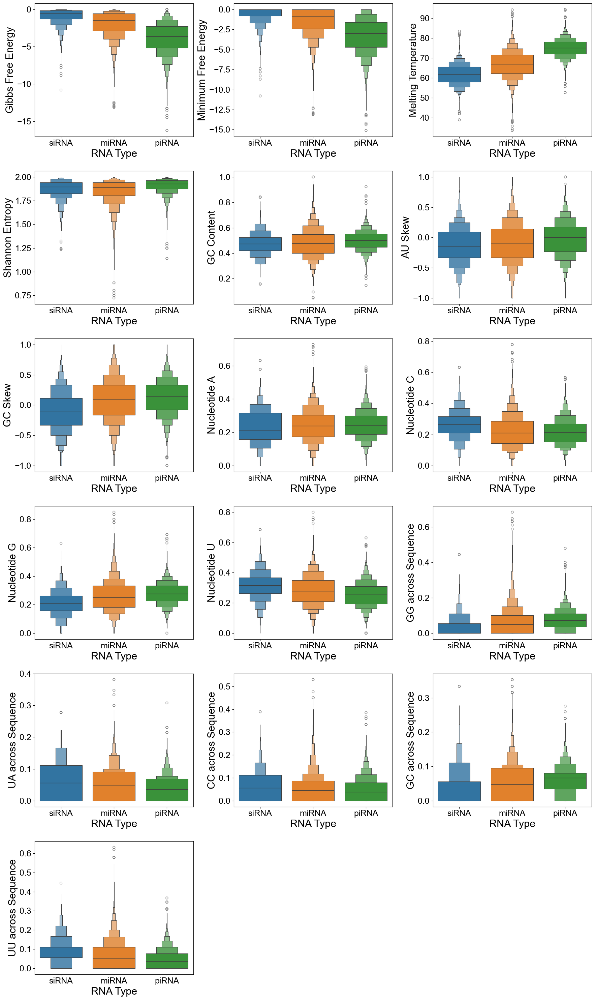

In [ ]:
# Density distribution plot with KS test 
def detailedFeatureBoxenGrid(siRNA, miRNA, piRNA, output_file_path, dataNum):
    plt.rcParams.update({
        "svg.fonttype": "none",
        "font.family": 'Arial',
        "font.size": 18,
        "axes.titlesize": 18,
        "axes.labelsize": 22, 
        "xtick.labelsize": 18,
        "ytick.labelsize": 18,
        "legend.fontsize": 16,
        "legend.title_fontsize": 14
    })

    siRNA = siRNA.copy()
    miRNA = miRNA.copy()
    piRNA = piRNA.copy() 
    
    siRNA['RNA_type'] = 'siRNA'
    miRNA['RNA_type'] = 'miRNA'
    piRNA['RNA_type'] = 'piRNA'

    data = pd.concat([siRNA, miRNA, piRNA], ignore_index=True)

    rename_dict = {
        'gibbs_free_energy': 'Gibbs Free Energy',
        'minimum_free_energy': 'Minimum Free Energy',
        'melting_temp': 'Melting Temperature',
        'shannon_entropy': 'Shannon Entropy',
        'gc_content': 'GC Content',
        'au_skew': 'AU Skew',
        'gc_skew': 'GC Skew',
        'a_content': 'Nucleotide A',
        'c_content': 'Nucleotide C',
        'g_content': 'Nucleotide G',
        'u_content': 'Nucleotide U',
        'GG_all': 'GG across Sequence',
        'UA_all': 'UA across Sequence',
        'CC_all': 'CC across Sequence',
        'GC_all': 'GC across Sequence',
        'UU_all': 'UU across Sequence'
    }
    data = data.rename(columns=rename_dict)

    features_to_plot = list(rename_dict.values())
    num_features = len(features_to_plot)

    cols = 3
    rows = math.ceil(num_features / cols)
    colors = {"siRNA": "#1f77b4", "miRNA": "#ff7f0e", "piRNA": "#2ca02c"}

    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
    axes = axes.flatten()

    def p_to_stars(p):
        if p < 1e-4: return "****"
        if p < 1e-3: return "***"
        if p < 1e-2: return "**"
        if p < 5e-2: return "*"
        return "ns"

    def annotate_comparison(ax, x1, x2, y, text, h=0.02):
        ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=1, c='k')
        ax.text((x1 + x2) / 2, y + h, text, ha='center', va='bottom', fontsize=10)

    order = ["siRNA", "miRNA", "piRNA"]
    pairs = [(0,1,"siRNA","miRNA"), (0,2,"siRNA","piRNA"), (1,2,"miRNA","piRNA")]

    for idx, feature in enumerate(features_to_plot):
        ax = axes[idx]

        sns.boxenplot(
            x="RNA_type", y=feature, data=data, order=order,
            palette=colors, ax=ax
        )
        # ax.set_title(f"{feature} Distribution", fontsize=12)
        ax.set_xlabel("RNA Type")
        ax.set_ylabel(feature)

        # compute pairwise KS tests on non-NaN values
        y_max = data[feature].dropna().max()
        y_min = data[feature].dropna().min()
        y_range = (y_max - y_min) if np.isfinite(y_max) and np.isfinite(y_min) else 1.0
        base = y_max if np.isfinite(y_max) else 1.0

        step = 0.06 * y_range if y_range > 0 else 1.0
        cur_y = base + 0.05 * y_range

        for j, (x1, x2, g1, g2) in enumerate(pairs):
            grp1 = data.loc[data["RNA_type"] == g1, feature].dropna().values
            grp2 = data.loc[data["RNA_type"] == g2, feature].dropna().values
            if len(grp1) >= 2 and len(grp2) >= 2:
                stat, p = ks_2samp(grp1, grp2, alternative='two-sided', mode='auto')
                print(g1, g2, p)
                stars = p_to_stars(p)
                # annotate_comparison(ax, x1, x2, cur_y, stars, h=0.01 * y_range)
                cur_y += step

        # ax.set_ylim(ax.get_ylim()[0], max(ax.get_ylim()[1], cur_y + 0.05 * y_range))

    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.rcParams.update({"svg.fonttype": "none"})
    plt.tight_layout()
    os.makedirs(output_file_path, exist_ok=True)
    outpath = f'{output_file_path}/RNA_Feature_Distributions_ks_{dataNum}k.svg'
    plt.savefig(outpath, format='svg')
    print(f"Saved: {outpath}")

detailedFeatureBoxenGrid(
    sirna,
    mirna, 
    pirna,
    "./", 
    "23"
)

siRNA miRNA Stem
siRNA miRNA Stem 101.95100529337066 5.691211000776082e-24 1
siRNA piRNA Stem
siRNA piRNA Stem 412.4776285244392 1.0588008664316353e-91 1
miRNA piRNA Stem
miRNA piRNA Stem 193.69007430886245 4.976306928570377e-44 1
siRNA miRNA Bulge
siRNA miRNA Bulge 101.95100529337066 5.691211000776082e-24 1
siRNA piRNA Bulge
siRNA piRNA Bulge 412.4776285244392 1.0588008664316353e-91 1
miRNA piRNA Bulge
miRNA piRNA Bulge 193.69007430886245 4.976306928570377e-44 1


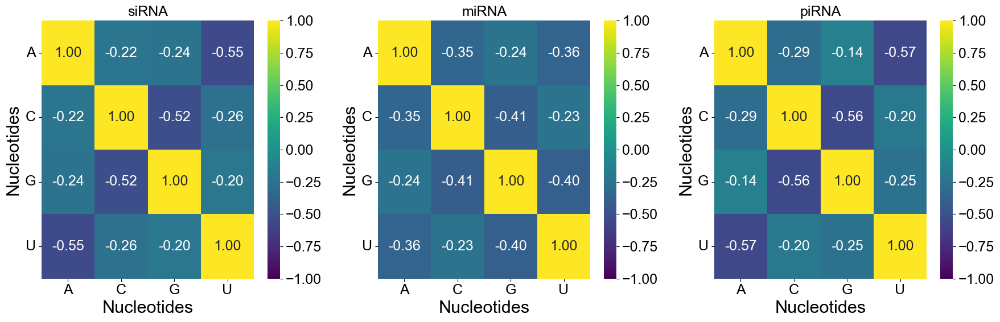

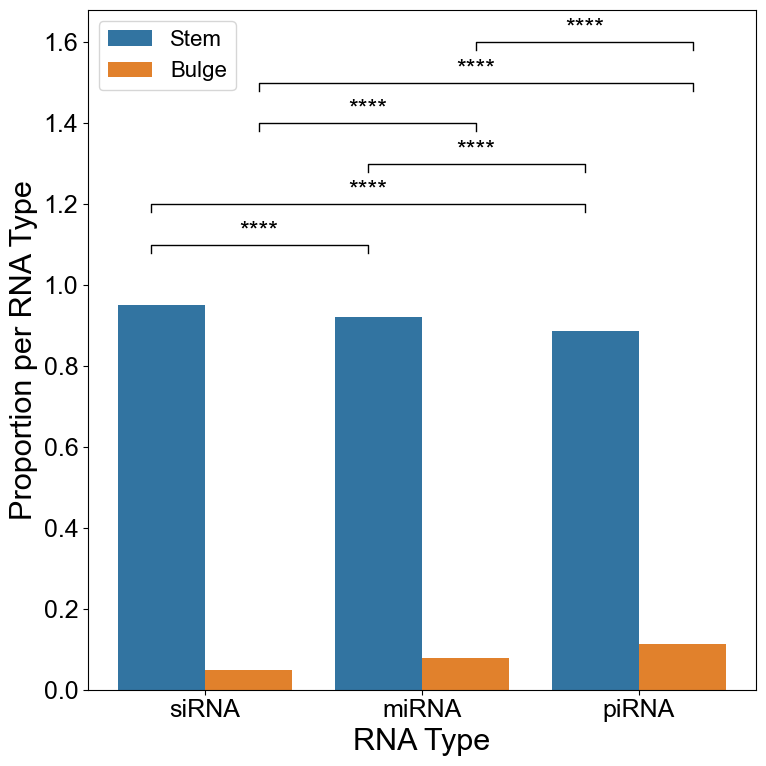

In [ ]:
def detailedFeatureAnalysis(siRNA, miRNA, piRNA, output_file_path, dataNum):
    plt.rcParams.update({
        "svg.fonttype": "none",
        "font.family": 'Arial',
        "font.size": 18,
        "axes.titlesize": 18,
        "axes.labelsize": 22, 
        "xtick.labelsize": 18,
        "ytick.labelsize": 18,
        "legend.fontsize": 16,
        "legend.title_fontsize": 14
    })
    
    siRNA = siRNA.copy()
    miRNA = miRNA.copy()
    piRNA = piRNA.copy()

    # Add a column for length 
    siRNA['Length'] = siRNA['sequence'].apply(len)
    miRNA['Length'] = miRNA['sequence'].apply(len)
    piRNA['Length'] = piRNA['sequence'].apply(len)

    # Add a column for RNA type
    siRNA['RNA_type'] = 'siRNA'
    miRNA['RNA_type'] = 'miRNA'
    piRNA['RNA_type'] = 'piRNA'

    data = pd.concat([siRNA, miRNA, piRNA], ignore_index=True)

    data = data.rename(columns={'a_content': 'A_distribution',
                                'g_content': 'G_distribution',
                                'u_content': 'U_distribution',
                                'c_content': 'C_distribution'})

    data = data.rename(columns={
        'gibbs_free_energy': 'Gibbs Free Energy',
        'minimum_free_energy': 'Minimum Free Energy',
        'melting_temp': 'Melting Temperature',
        'shannon_entropy': 'Shannon Entropy',
        'gc_content': 'GC Content',
        'au_skew': 'AU Skew',
        'gc_skew': 'GC Skew',
        'A_distribution': 'Nucleotide A', 
        'C_distribution': 'Nucleotide C', 
        'G_distribution': 'Nucleotide G', 
        'U_distribution': 'Nucleotide U',
        'U_1': 'U at Position 1', 
        'G_1': 'G at Position 1', 
        'GG_all': 'GG across Sequence', 
        'UA_all': 'UA across Sequence', 
        'CC_all': 'CC across Sequence', 
        'GC_all': 'GC across Sequence', 
        'UU_all': 'UU across Sequence',
        'length': 'Length',
    })
 
    results2 = ['Gibbs Free Energy','Minimum Free Energy','Melting Temperature','Shannon Entropy', 'GC Content', 'AU Skew','GC Skew', 'Nucleotide A', 'Nucleotide C', 'Nucleotide G', 'Nucleotide U', 'U at Position 1', 'G at Position 1', 'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence', 'Length']
    
    # Define colors for RNA types
    colors = {"siRNA": "#1f77b4", "miRNA": "#ff7f0e", "piRNA": "#2ca02c"}

    #  Nucleotide distribution
    datasets = {
        'siRNA': data[data["RNA_type"] == "siRNA"],
        'miRNA': data[data["RNA_type"] == "miRNA"],
        'piRNA': data[data["RNA_type"] == "piRNA"]
    }
    nucleotide_correlation_matrices = {}
    nucleotide_features = ['Nucleotide A', 'Nucleotide C', 'Nucleotide G', 'Nucleotide U']

    for key, df in datasets.items():
        nucleotide_correlation_matrices[key] = df[nucleotide_features].corr()
        nucleotide_correlation_matrices[key].columns = ['A', 'C', 'G', 'U']
        nucleotide_correlation_matrices[key].index = ['A', 'C', 'G', 'U']

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    for ax, (key, corr_matrix) in zip(axes, nucleotide_correlation_matrices.items()):
        sns.heatmap(corr_matrix, annot=True, cmap="viridis", fmt=".2f", ax=ax, vmin=-1, vmax=1)
        ax.set_title(f"{key}")
        ax.set_xlabel("Nucleotides")
        ax.set_ylabel("Nucleotides")
        ax.set_yticklabels(corr_matrix.index, rotation=0)

    plt.tight_layout()
    # Save and display the figure
    output_file = f'{output_file_path}/Nucleotide_Correlation_Comparison_{dataNum}k.svg'
    # plt.savefig(output_file, format='svg')

    # Structral motif
    def parse_structure(structure: str):
        structure = structure.rstrip()
        pairs = {}
        stack = []

        for i, ch in enumerate(structure):
            if ch == '(':
                stack.append(i)
            elif ch == ')':
                j = stack.pop()
                pairs[i] = j
                pairs[j] = i

        # Parse stem structures 
        visited = set()
        stems = []
        for i, j in sorted([(k, v) for k,v in pairs.items() if k < v]):
            if i in visited:
                continue
            visited.add(i)
            ci, cj = i, j
            while True:
                ni, nj = ci+1, cj-1
                if pairs.get(ni) == nj and ni not in visited:
                    visited.add(ni)
                    ci, cj = ni, nj
                else:
                    break
            stems.append(structure[:cj+1+1])
        
        # Parse bulge structures 
        n = len(structure)
        labels = ['P' if i in pairs else 'U' for i in range(n)]
        bulges = []

        i = 0 
        while i < n:
            if labels[i] == 'U':
                start = i
                while i < n and labels[i] == 'U':
                    i += 1
                end = i - 1
                
                left_p = start > 0 and labels[start-1] == 'P'
                right_p = end < n-1 and labels[end+1] == 'P'

                if left_p and right_p:
                    lp_pair = pairs[start-1]
                    rp_pair = pairs[end+1]

                    if lp_pair > rp_pair:
                        other_seq = structure[rp_pair+1: lp_pair]
                    else:
                        other_seq = structure[lp_pair+1:rp_pair]
                    
                    other_dots = other_seq.count('.')

                    if other_dots == 0:
                        bulges.append(structure[:end+1])
            else:
                i += 1
        
        return {"Stem": len(stems), "Bulge": len(bulges)}

    def analyze_structures(df):
        motifs = {"Stem": 0, "Bulge": 0}
        for s in df['secondary_structure']:
            if isinstance(s, str) and len(s) > 0:
                m = parse_structure(s)
                motifs["Stem"]  += m["Stem"]
                motifs["Bulge"] += m["Bulge"]
        return motifs

    siRNA_motifs = analyze_structures(siRNA)
    miRNA_motifs = analyze_structures(miRNA)
    piRNA_motifs = analyze_structures(piRNA)

    motifs_df = pd.DataFrame(
        [siRNA_motifs, miRNA_motifs, piRNA_motifs],
        index=["siRNA","miRNA","piRNA"]
    )[["Stem","Bulge"]]

    totals = motifs_df.sum(axis=1)
    prop = motifs_df.T/totals
    prop = prop.T.reset_index()
    prop = prop.melt(id_vars='index')
    order = ['siRNA', 'miRNA', 'piRNA']

    fig, ax = plt.subplots(1,1, figsize=(8,8))
    sns.barplot(prop, x='index', y='value', hue='variable',ax=ax,order=order)

    def bracket(ax, x1, x2, y, h=0.02, text="p="):
        """draw a bracket with text above"""
        ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="black")
        ax.text((x1+x2)/2, y+h*1.2, text, ha="center", va="bottom", fontsize=18)

    step = 1 * 0.08
    h = 1 * 0.02
    current_top = 1
    count = 0 

    stat_pairs = {}
    for j, m in enumerate(['Stem', 'Bulge']):
        stat_pairs[m] = {}
        for k, (a,b) in enumerate([('siRNA', 'miRNA'), ('siRNA', 'piRNA'), ('miRNA', 'piRNA')]):
            print(a, b, m)
            a_m = motifs_df.loc[a, m]; a_not = totals[a] - a_m
            b_m = motifs_df.loc[b, m]; b_not = totals[b] - b_m
            chi2, p, dof, _ = chi2_contingency([[a_m, a_not], [b_m, b_not]])
            print(a, b, m, chi2, p, dof)
            stat_pairs[m].update({(a,b): p})

    for k, v in stat_pairs['Stem'].items():
        count+=1
        x1 = order.index(k[0]) - 0.25
        x2 = order.index(k[1]) - 0.25
        y = 0.9 + 0.1*count + step
        current_top = y+h
        bracket(ax, x1, x2, y, h=h, text=(f"p={v:.2e}" if v >= 0.0001 else "****"))

    step = 1 * 0.08
    h = 1 * 0.02
    current_top = 1
    count = 0
    for k, v in stat_pairs['Bulge'].items():
        count+=1
        x1 = order.index(k[0]) + 0.25
        x2 = order.index(k[1]) + 0.25
        y = 1.2 + 0.1*count + step
        current_top = y+h
        bracket(ax, x1, x2, y, h=h, text=(f"p={v:.2e}" if v >= 0.0001 else "****"))

    ax.set_xlabel('RNA Type')
    ax.set_ylabel('Proportion per RNA Type')
    plt.legend(title='')

    plt.tight_layout()
    # plt.savefig(f"{output_file_path}/Structural_Motif_Proportions_pairwiseP_{dataNum}kg.svg", format="svg")
    plt.show()
    
detailedFeatureAnalysis(sirna, mirna, pirna, './', '23')

In [ ]:
# Structral motif
siRNA = sirna
miRNA = mirna 
piRNA = pirna

def parse_structure(structure: str):
    structure = structure.rstrip()
    pairs = {}
    stack = []

    for i, ch in enumerate(structure):
        if ch == '(':
            stack.append(i)
        elif ch == ')':
            j = stack.pop()
            pairs[i] = j
            pairs[j] = i

    # Parse stem structures 
    visited = set()
    stems = []
    for i, j in sorted([(k, v) for k,v in pairs.items() if k < v]):
        if i in visited:
            continue
        visited.add(i)
        ci, cj = i, j
        while True:
            ni, nj = ci+1, cj-1
            if pairs.get(ni) == nj and ni not in visited:
                visited.add(ni)
                ci, cj = ni, nj
            else:
                break
        stems.append(structure[:cj+1+1])
    
    # Parse bulge structures 
    n = len(structure)
    labels = ['P' if i in pairs else 'U' for i in range(n)]
    bulges = []

    i = 0 
    while i < n:
        if labels[i] == 'U':
            start = i
            while i < n and labels[i] == 'U':
                i += 1
            end = i - 1
            
            left_p = start > 0 and labels[start-1] == 'P'
            right_p = end < n-1 and labels[end+1] == 'P'

            if left_p and right_p:
                lp_pair = pairs[start-1]
                rp_pair = pairs[end+1]

                if lp_pair > rp_pair:
                    other_seq = structure[rp_pair+1: lp_pair]
                else:
                    other_seq = structure[lp_pair+1:rp_pair]
                
                other_dots = other_seq.count('.')

                if other_dots == 0:
                    bulges.append(structure[:end+1])
        else:
            i += 1
    
    return {"Stem": len(stems), "Bulge": len(bulges)}

def count_paired_bases(seq):
    open_bases = seq.count('(')
    close_bases = seq.count(')')
    assert open_bases == close_bases
    return open_bases+close_bases

siRNA['stem_count'] = siRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Stem'])
siRNA['bulge_count'] = siRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Bulge'])

miRNA['stem_count'] = miRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Stem'])
miRNA['bulge_count'] = miRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Bulge'])

piRNA['stem_count'] = piRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Stem'])
piRNA['bulge_count'] = piRNA['secondary_structure'].apply(lambda x: parse_structure(x)['Bulge'])

siRNA['stem_per_nt'] = siRNA['stem_count'] / siRNA['sequence'].apply(lambda x: len(x))
miRNA['stem_per_nt'] = miRNA['stem_count'] / miRNA['sequence'].apply(lambda x: len(x))
piRNA['stem_per_nt'] = piRNA['stem_count'] / piRNA['sequence'].apply(lambda x: len(x))

siRNA['bulge_per_nt'] = siRNA['bulge_count'] / siRNA['sequence'].apply(lambda x: len(x))
miRNA['bulge_per_nt'] = miRNA['bulge_count'] / miRNA['sequence'].apply(lambda x: len(x))
piRNA['bulge_per_nt'] = piRNA['bulge_count'] / piRNA['sequence'].apply(lambda x: len(x))

siRNA['type'] = 'siRNA'
miRNA['type'] = 'miRNA'
piRNA['type'] = 'piRNA'



[np.float64(0.0), np.float64(1.0), np.float64(2.0)]
20011.799026415796 0.0
     1    2    3
1  1.0  0.0  0.0
2  0.0  1.0  0.0
3  0.0  0.0  1.0
0.2885748341877197
[np.float64(0.0), np.float64(0.0), np.float64(0.0)]
3783.797355516391 0.0
              1             2    3
1  1.000000e+00  2.888242e-75  0.0
2  2.888242e-75  1.000000e+00  0.0
3  0.000000e+00  0.000000e+00  1.0
0.05456324506491111
[np.float64(0.0), np.float64(0.045454545454545456), np.float64(0.06451612903225806)]
7380.6105947776505 0.0
     1    2    3
1  1.0  0.0  0.0
2  0.0  1.0  0.0
3  0.0  0.0  1.0
0.1064301353306942
[np.float64(0.0), np.float64(0.0), np.float64(0.0)]
3390.3867749460533 0.0
              1             2    3
1  1.000000e+00  8.085635e-80  0.0
2  8.085635e-80  1.000000e+00  0.0
3  0.000000e+00  0.000000e+00  1.0
0.04889017224892286


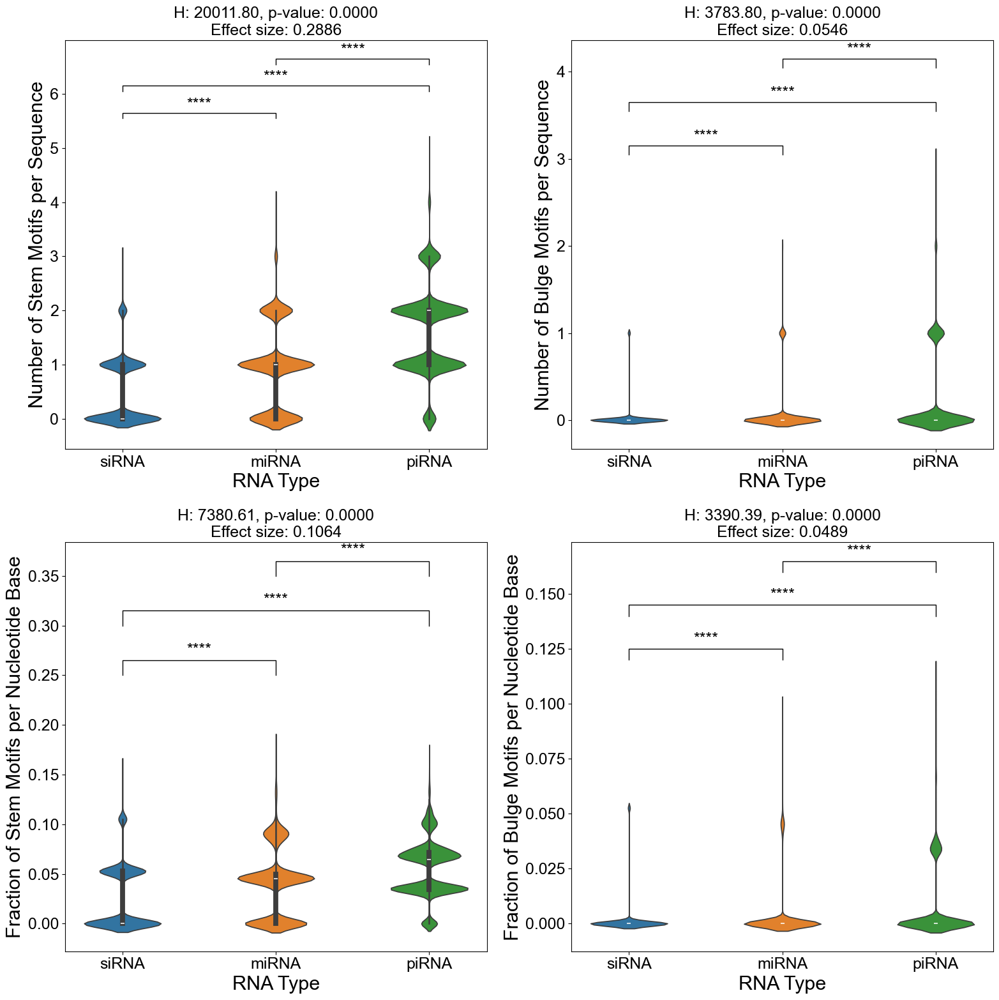

In [ ]:
fig, axs= plt.subplots(2,2, figsize=(16,16))
scale_dict = {'stem_count': [1, 0.1, 5, 0.5], 'bulge_count': [1, 0.1, 2.5, 0.5], 'stem_per_nt': [0.15, 0.1, 0.15, 0.05], 'bulge_per_nt': [0.05, 0.1, 0.05, 0.02]}
for col, ax in zip(['stem_count', 'bulge_count', 'stem_per_nt', 'bulge_per_nt'],axs.flatten()):
    scale_val = scale_dict[col]

    data = pd.concat([siRNA, miRNA, piRNA])
    groups_ = [data[data['type'] == k][col].dropna() for k in ['siRNA', 'miRNA', 'piRNA']]
    print([x.median() for x in groups_])
    stat, p = scipy.stats.kruskal(*[list(x) for x in groups_])
    print(stat, p)
    p_values = sp.posthoc_dunn(groups_, p_adjust='holm') # 0 = sirna, 1 = mirna, 2 = pirna 
    dunn_results = pd.DataFrame(p_values)
    print(dunn_results)

    # Using epsilon-squared to calculate effect size from Kruskal-Wallis H 
    n = sum([len(x) for x in groups_]) 
    effect_size = stat/((n**2 -1)/(n+1))
    print(effect_size)

    stat_pairs = {}
    map_dict = {1: 'siRNA', 2:'miRNA', 3:'piRNA'}
    for i in dunn_results.index:
        for c in dunn_results.columns:
            if i == c:
                continue
            elif c > i and (map_dict[c], map_dict[i]) not in stat_pairs.keys():
                stat_pairs[(map_dict[i], map_dict[c])] = dunn_results.loc[i, c]
            else:
                continue
    
    plt.rcParams.update({
        "svg.fonttype": "none",
        "font.family": 'Arial',
        "font.size": 18,
        "axes.titlesize": 18,
        "axes.labelsize": 22, 
        "xtick.labelsize": 18,
        "ytick.labelsize": 18,
        "legend.fontsize": 16,
        "legend.title_fontsize": 14
    })
    order = ['siRNA', 'miRNA', 'piRNA']
    data = data.rename(columns={'type': 'RNA Type'})
    sns.violinplot(data[['RNA Type', col]], y=col, hue='RNA Type', x='RNA Type', ax=ax, width=0.5)
    def bracket(ax, x1, x2, y, h=0.02, text="p="):
        """draw a bracket with text above"""
        ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="black")
        ax.text((x1+x2)/2, y+h*1.2, text, ha="center", va="bottom", fontsize=18)
    ax.set_xlabel('RNA Type')
    if col in ['stem_count', 'bulge_count']:
        ax.set_ylabel(f'Number of {col.split('_')[0].capitalize()} Motifs per Sequence')
    else:
        ax.set_ylabel(f'Fraction of {col.split('_')[0].capitalize()} Motifs per Nucleotide Base')

    step = 1 * 0.05
    h =  scale_val[0] *  scale_val[1]
    current_top = 1
    count = 0 

    for k, v in stat_pairs.items():
        count+=1
        x1 = order.index(k[0])
        x2 = order.index(k[1])
        y =  scale_val[2] +  scale_val[3] *count + step 
        current_top = y+h
        bracket(ax, x1, x2, y, h=h, text=(f"p={v:.2e}" if v >= 0.0001 else "****"))

    ax.set_title(f'H: {stat:.2f}, p-value: {p:.4f}\nEffect size: {effect_size:.4f}')
    plt.tight_layout()
    # plt.savefig('./figure4e_h.png')
    # plt.savefig('./figure4e_h.svg')

('Gibbs Free Energy', 'Nucleotide U')
('Gibbs Free Energy', 'GG across Sequence')
('Gibbs Free Energy', 'UA across Sequence')
('Gibbs Free Energy', 'GC across Sequence')
('Gibbs Free Energy', 'UU across Sequence')
('Minimum Free Energy', 'Nucleotide U')
('Minimum Free Energy', 'GG across Sequence')
('Minimum Free Energy', 'UA across Sequence')
('Minimum Free Energy', 'GC across Sequence')
('Minimum Free Energy', 'UU across Sequence')
('Melting Temperature', 'Nucleotide G')
('Melting Temperature', 'Nucleotide U')
('Melting Temperature', 'GG across Sequence')
('Melting Temperature', 'UU across Sequence')
('Shannon Entropy', 'UU across Sequence')
('GC Content', 'Nucleotide A')
('GC Content', 'Nucleotide G')
('GC Content', 'Nucleotide U')
('GC Content', 'GG across Sequence')
('GC Content', 'UU across Sequence')
('GC Content', 'Length')
('Nucleotide A', 'UA across Sequence')
('Nucleotide G', 'Nucleotide U')
('Nucleotide G', 'UA across Sequence')
('Nucleotide G', 'Length')
('Nucleotide U', '

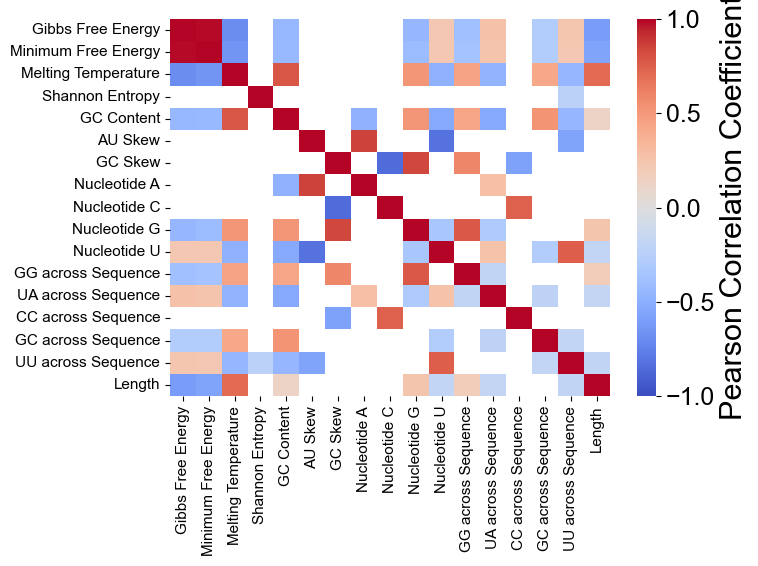

In [ ]:
# Correlation heatmap
corr_df = pd.concat([sirna, mirna, pirna]).reset_index(drop=True)
rename_dict = {
    'gibbs_free_energy': 'Gibbs Free Energy',
    'minimum_free_energy': 'Minimum Free Energy',
    'melting_temp': 'Melting Temperature',
    'shannon_entropy': 'Shannon Entropy',
    'gc_content': 'GC Content',
    'au_skew': 'AU Skew',
    'gc_skew': 'GC Skew',
    'a_content': 'Nucleotide A',
    'c_content': 'Nucleotide C',
    'g_content': 'Nucleotide G',
    'u_content': 'Nucleotide U',
    'GG_all': 'GG across Sequence',
    'UA_all': 'UA across Sequence',
    'CC_all': 'CC across Sequence',
    'GC_all': 'GC across Sequence',
    'UU_all': 'UU across Sequence'
}
corr_df = corr_df.rename(columns=rename_dict)
corr_df['Length'] = corr_df['sequence'].apply(lambda x: len(x))
corr_df = corr_df[list(rename_dict.values()) + ['Length']].corr() # Pearson correlation

stat_pairs = {}
for x in list(rename_dict.values()) + ['Length']:
    for y in list(rename_dict.values()) + ['Length']:
        if (x, y) not in stat_pairs.keys() and (y, x) not in stat_pairs.keys():
            stat_pairs[(x, y)] = pearsonr(corr_df[x], corr_df[y]).pvalue

for x, y in stat_pairs.items():
    if y < 0.05:
        if y < 0.001:
            continue
        elif y >= 0.001:
            print(x)
    elif y >= 0.05:
        corr_df.loc[x[0], x[1]] = None
        corr_df.loc[x[1], x[0]] = None

# corr_df.to_csv('./pcc_23k_irrespective_corr_antisense_no_overhang.csv')

fig, ax = plt.subplots(1,1, figsize=(8,6))
sns.heatmap(corr_df, cmap='coolwarm',ax=ax, cbar_kws={'label': 'Pearson Correlation Coefficient'}, vmin=-1, vmax=1)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 11)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 11)
plt.tight_layout()
# plt.savefig("./pcc_23k_irrespective_corr_antisense.png", dpi=300)
# plt.savefig("./pcc_23k_irrespective_corr_antisense.svg", dpi=600)
plt.show()

[('UA\nacross\nSequence', -0.5386543186714261), ('Nucleotide\nU', -0.5363077565421938), ('Nucleotide\nA', -0.4833545494153516), ('GC\nContent', 1.0), ('Melting\nTemperature', 0.7816412272719617), ('GC\nacross\nSequence', 0.5251573531171122), ('Nucleotide\nG', 0.5167532851866963)]
GC
Content UA
across
Sequence -0.5386543186714261
GC
Content Nucleotide
U -0.5363077565421938
GC
Content Nucleotide
A -0.4833545494153516
GC
Content Melting
Temperature 0.7816412272719617
GC
Content GC
across
Sequence 0.5251573531171122
GC
Content Nucleotide
G 0.5167532851866963
[('Melting\nTemperature', -0.6875766538121794), ('Nucleotide\nG', -0.4522097511336925), ('GC\nContent', -0.44141285659828855), ('Gibbs\nFree\nEnergy', 1.0), ('Minimum\nFree\nEnergy', 0.9894426138788174), ('UA\nacross\nSequence', 0.27022776987171854), ('UU\nacross\nSequence', 0.23646798398261346)]
Gibbs
Free
Energy Melting
Temperature -0.6875766538121794
Gibbs
Free
Energy Nucleotide
G -0.4522097511336925
Gibbs
Free
Energy GC
Content -0.

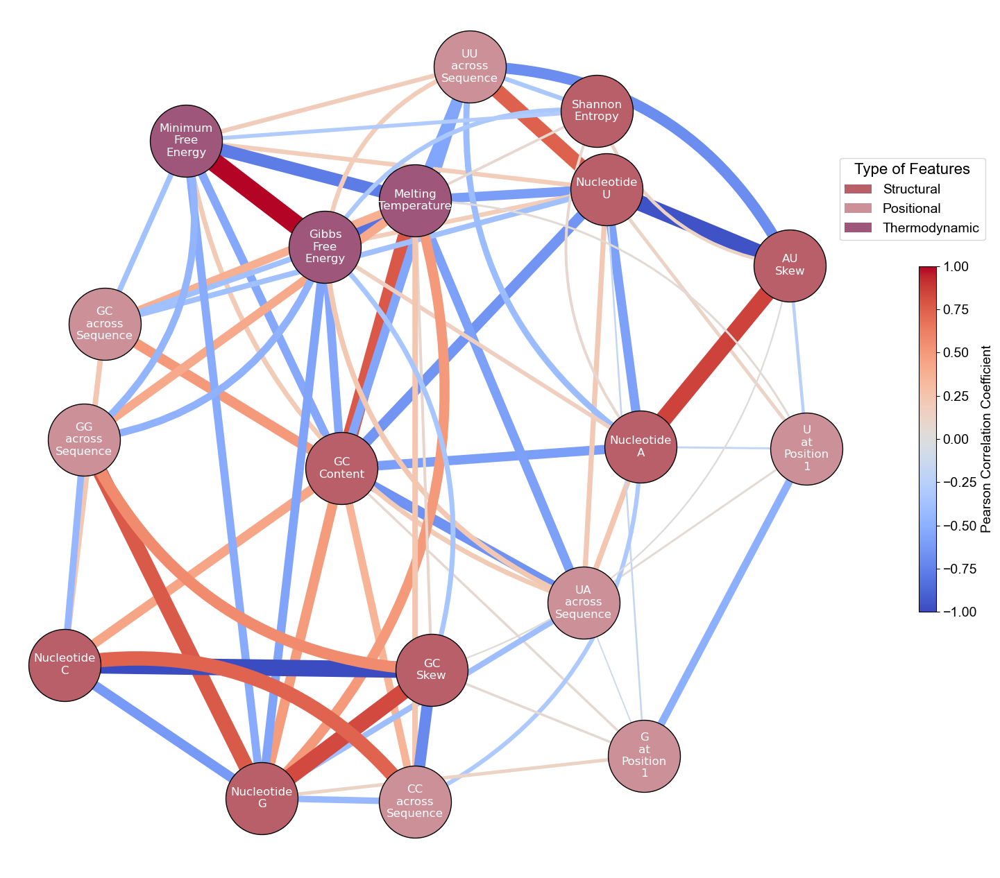

In [ ]:
# Correlation Network graph 
fig, ax = plt.subplots(figsize=(16,13))

g = nx.Graph()

rename_dict = {'gc_content': 'GC\nContent',
                'gibbs_free_energy':  'Gibbs\nFree\nEnergy',
                'minimum_free_energy': 'Minimum\nFree\nEnergy',
                'a_content':  'Nucleotide\nA',
                'u_content':  'Nucleotide\nU', 
                'g_content': 'Nucleotide\nG', 
                'c_content': 'Nucleotide\nC',
                'melting_temp':  'Melting\nTemperature',
                'au_skew':  'AU\nSkew',
                'gc_skew':  'GC\nSkew',
                'shannon_entropy':  'Shannon\nEntropy',
                'U_1': 'U\nat\nPosition\n1',
                'G_1':  'G\nat\nPosition\n1',
                'GG_all':  'GG\nacross\nSequence',
                'UA_all':  'UA\nacross\nSequence',
                'CC_all':  'CC\nacross\nSequence',
                'GC_all':  'GC\nacross\nSequence',
                'UU_all':  'UU\nacross\nSequence'}

irrespective_network_df = pd.concat([sirna, mirna, pirna]).reset_index(drop=True)
irrespective_network_df = irrespective_network_df[rename_dict.keys()]
irrespective_network_df = irrespective_network_df.rename(columns=rename_dict)
corr_matrix = irrespective_network_df.corr(method='pearson')
for x, y in stat_pairs.items():
    if x[0] in corr_matrix.columns and x[1] in corr_matrix.columns: 
        if y < 0.05:
            continue
        else:
            corr_matrix.loc[x[0].replace(' ', '\n'), x[1].replace(' ', '\n')] = None
            corr_matrix.loc[x[1].replace(' ', '\n'), x[0].replace(' ', '\n')] = None

network_dict = {}
for y in corr_matrix:
    network_dict[y] = sorted(corr_matrix[y].dropna().items(), key=lambda x: x[1])[:3] + sorted(corr_matrix[y].dropna().items(), key=lambda x: x[1], reverse=True)[:4]
    print(network_dict[y])
    g.add_node('\n'.join(y.split(' ')))
    for z in [x for x in network_dict[y]]:
        if z[0] != y: 
            g.add_node('\n'.join(z[0].split(' ')))
            g.add_edge('\n'.join(y.split(' ')), '\n'.join(z[0].split(' ')), weight=z[1])
            print(y, z[0], z[1])
print(g)

hex_colors = ['#B85F69', '#CB9098', '#9E577A']

colormap = []
for node,_ in g.nodes.items():
    if node in ['Nucleotide\nA', 'Nucleotide\nU', 'Nucleotide\nG', 'Nucleotide\nC', 'GC\nContent', 'GC\nSkew', 'AU\nSkew','Shannon\nEntropy']: #Structural 
        colormap.append(hex_colors[0])#[4])
    elif node in ['U\nat\nPosition\n1', 'UU\nacross\nSequence','G\nat\nPosition\n1', 'GG\nacross\nSequence', 'CC\nacross\nSequence', 'GC\nacross\nSequence', 'UA\nacross\nSequence']: # Psotional 
        colormap.append(hex_colors[1])#[0])
    elif node in ['Gibbs\nFree\nEnergy', 'Minimum\nFree\nEnergy', 'Melting\nTemperature']: #Thermo
        colormap.append(hex_colors[2])#[2]) 

edges, weights = zip(*nx.get_edge_attributes(g,'weight').items())
d = dict(g.degree)
nx.set_edge_attributes(g,values={k: abs(v) for k, v in nx.get_edge_attributes(g,'weight').items()}, name='weight') # such that weights are positive for kamada_kawai, but colours will represent neg/pos correlation
paths = dict(nx.shortest_path_length(g, weight=weights))
for x in paths:
    for y in paths[x]:
        paths[x][y] = paths[x][y]*2
pos = nx.kamada_kawai_layout(g,paths,scale=1)#shell_layout(g)

colourmap = sns.color_palette("coolwarm", as_cmap=True) 
norm = plt.Normalize(vmin = min(weights), vmax = max(weights))
edge_color = colourmap(norm(weights))
edge_width = [x*20 for x in list(map(abs,weights))]

for loop in range(20):
    for nodex in g.nodes():
        for nodey in g.nodes():
            if (nodex != nodey):
                # if y distance is too small
                if(max(pos[nodex][1],pos[nodey][1])-min(pos[nodex][1],pos[nodey][1])<0.3):
                    # check if also x distance is too small
                    if((max(pos[nodex][0],pos[nodey][0])-min(pos[nodex][0],pos[nodey][0])< 0.3)):
                        print(nodex, nodey)
                        if(pos[nodex][1] < pos[nodey][1]):
                            pos[nodex][1] = pos[nodex][1]-0.3
                            pos[nodey][1] = pos[nodey][1]+0.3
                        else:
                            pos[nodex][1] = pos[nodex][1]+0.3
                            pos[nodey][1] = pos[nodey][1]-0.3

for y in pos:
    if y in ['Minimum\nFree\nEnergy']:
        pos[y] = pos[y] + [-0.2, 0]
    elif y in ['Nucleotide\nU']:
        pos[y] = pos[y] + [0.1,0.1]
    elif y in ['Nucleotide\nG']:
        pos[y] = pos[y] + [0, -0.4]
    elif y in ['Nucleotide\nA']:
        pos[y] = pos[y] + [-0.1, -0.2]
    elif y in ['U\nat\nPosition\n1']:
        pos[y] = pos[y] + [-0.1, 0.1]
    elif y in ['Melting\nTemperature']:
        pos[y] = pos[y] + [-0.05, 0]
    elif y in ['Nucleotide\nC']:
        pos[y] = pos[y] + [-0.05, -0.1]
    elif y in ['Gibbs\nFree\nEnergy']:
        pos[y] = pos[y] + [-0.05, 0.2]


connections = [] 
for pair in g.edges(): 
    for node in g.nodes():
        if node not in pair:
            if min([pos[pair[0]][0], pos[pair[1]][0]]) < pos[node][0] < max([pos[pair[0]][0], pos[pair[1]][0]]) and min([pos[pair[0]][1], pos[pair[1]][1]]) < pos[node][1] < max([pos[pair[0]][1], pos[pair[1]][1]]):
                print(pair, node, pos[pair[0]], pos[pair[1]], pos[node])
                connections.append('arc3,rad=-0.3')
                break
        else: 
            connections.append('arc3')
            break


for count, node in enumerate(g.nodes()):
    nx.draw_networkx_nodes(g, pos, nodelist = [node], node_color=colormap[count], node_size=5600, edgecolors='black')
    nx.draw_networkx_labels(g, pos, {node:node}, font_size=12, font_color='white')

for id, edge in enumerate(g.edges()):
    print(edge)
    nx.draw_networkx_edges(g, pos, edgelist=[edge],arrows=True, edge_color=edge_color[id], edge_cmap=sns.color_palette("coolwarm", as_cmap=True), width = edge_width[id], connectionstyle=connections[id])
    
legend_dict= {'Structural': hex_colors[0],
             'Positional': hex_colors[1],
             'Thermodynamic':hex_colors[2]}
handles = [Patch(facecolor=legend_dict[label], label=label) for label in legend_dict]
ax.legend(handles=handles, loc=[0.97, 0.73], title='Type of Features', fontsize=14, title_fontsize=16)
ax.axis('off')
sm = plt.cm.ScalarMappable(cmap=colourmap, norm=plt.Normalize(vmin = -1, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.4)
cbar.ax.tick_params(labelsize=14)
cbar.set_label("Pearson Correlation Coefficient", fontsize=14)

plt.tight_layout()
# plt.savefig("./pcc_23k_irrespective_network.png", dpi=300)
# plt.savefig("./pcc_23k_irrespective_network.svg", dpi=600)
plt.show()

# 4. Deep Learning Embeddings Analysis

## 4.1 t-SNE Projection

In [118]:
# Generate RNA-FM embeddings
def Featurizer(input_data, chunk_size):
    # Load RNA-FM
    model, alphabet = fm.pretrained.rna_fm_t12('./.cache/torch/hub/checkpoints/RNA-FM_pretrained.pth')
    emb_len = 640

    batch_converter = alphabet.get_batch_converter()
    model.eval()  # disables dropout for deterministic results

    embeddings = np.zeros((len(input_data), emb_len))

    # Prepare data
    for i in tqdm(range(0, len(input_data), chunk_size)):

        data = input_data[i:i+chunk_size]
        _, batch_strs, batch_tokens = batch_converter(data)

        # Extract embeddings (on CPU)
        with torch.no_grad():
            results = model(batch_tokens, repr_layers=[12])

        emb = results["representations"][12].numpy()

        for idx, x in enumerate(batch_strs): 
            embeddings[i+idx:i+chunk_size+idx, :] = np.mean(emb[idx, 1:1+len(x),:], axis=0)

    print(embeddings.shape)

    return embeddings

# To generate RNA-FM embeddings
# mirna_emb = Featurizer(mirna_data, chunk_size = 20)
# sirna_emb = Featurizer(sirna_data, chunk_size = 20)
# pirna_emb = Featurizer(pirna_data, chunk_size = 20)

In [ ]:
# To load previously computed embeddings, these files can be found in: RNAExplorer/portal/data/embeddings/
db1 = pd.read_csv('database.part01.csv')
db2 = pd.read_csv('database.part02.csv')
db = pd.concat([db1, db2]).reset_index(drop=True)

sirna_db = db[db['RNA Type'] == 'siRNA'].reset_index()
mirna_db = db[db['RNA Type'] == 'miRNA'].reset_index()
pirna_db = db[db['RNA Type'] == 'piRNA'].reset_index()

sirna_db = sirna_db[['index', 'Sequence']].set_index('Sequence')
mirna_db = mirna_db[['index', 'Sequence']].set_index('Sequence')
pirna_db = pirna_db[['index', 'Sequence']].set_index('Sequence')

ls = []
for i in range(1,8):
    emb = np.load(f'refs_embeddings.part0{i}.npy')
    ls.append(emb)
embs = np.concat(ls)

In [ ]:
# To load previously computed embeddings
sirna_emb = embs[list(sirna_db.loc[[x[-1] for x in sirna_data], :]['index']), :]
mirna_emb = embs[list(mirna_db.loc[[x[-1] for x in mirna_data], :]['index']), :]
pirna_emb = embs[list(pirna_db.loc[[x[-1] for x in pirna_data], :]['index']), :]

# Sanity check 
m = Featurizer(mirna_data[:10], chunk_size=20)
p = Featurizer(pirna_data[:10], chunk_size=20)
assert (m == mirna_emb[:10]).all()
assert (p == pirna_emb[:10]).all()

(69348, 640)
['gibbs_free_energy', 'minimum_free_energy', 'melting_temp', 'shannon_entropy', 'gc_content', 'au_skew', 'gc_skew', 'a_content', 'u_content', 'g_content', 'c_content', 'U_1', 'G_1']
Saved SVG panel to: ./sirna_correction/RNA_FM_tSNE_PANEL_23k_antisense_.svg
['gibbs_free_energy', 'minimum_free_energy', 'melting_temp', 'shannon_entropy', 'gc_content', 'au_skew', 'gc_skew', 'a_content', 'u_content', 'g_content', 'c_content', 'U_1', 'G_1']
Saved SVG panel to: ./sirna_correction/RNA_FM_tSNE_PANEL_23k_antisense_PCA.svg


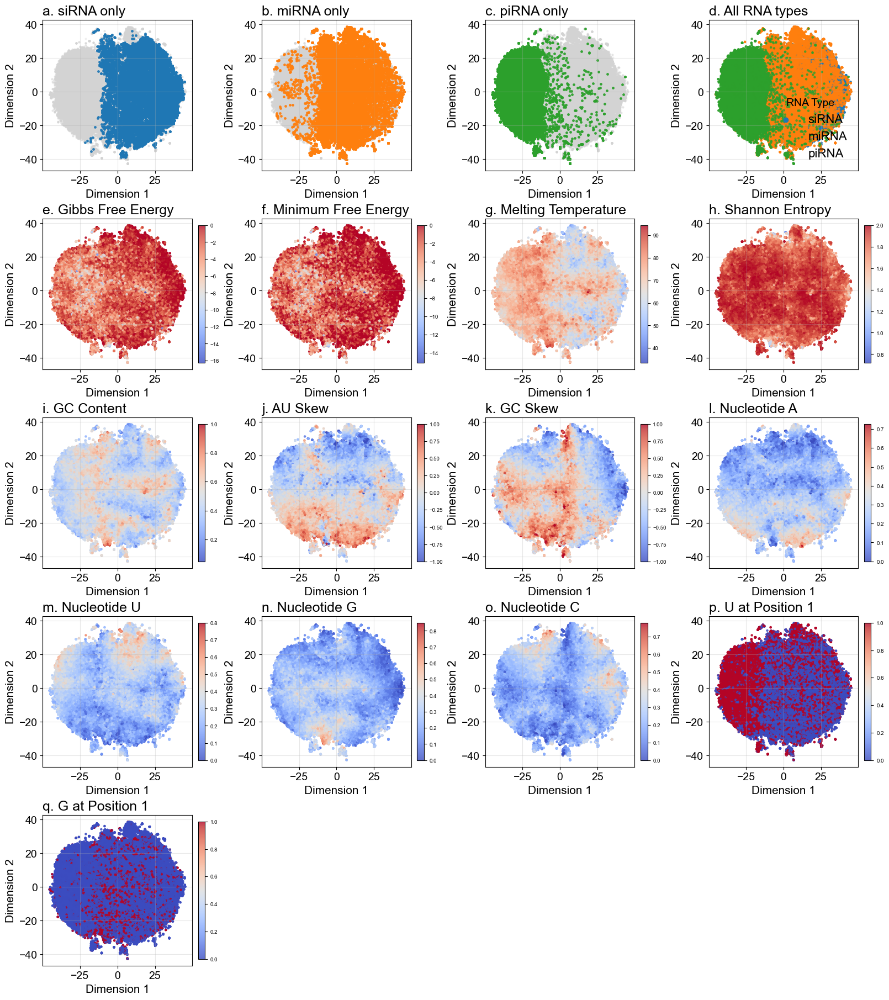

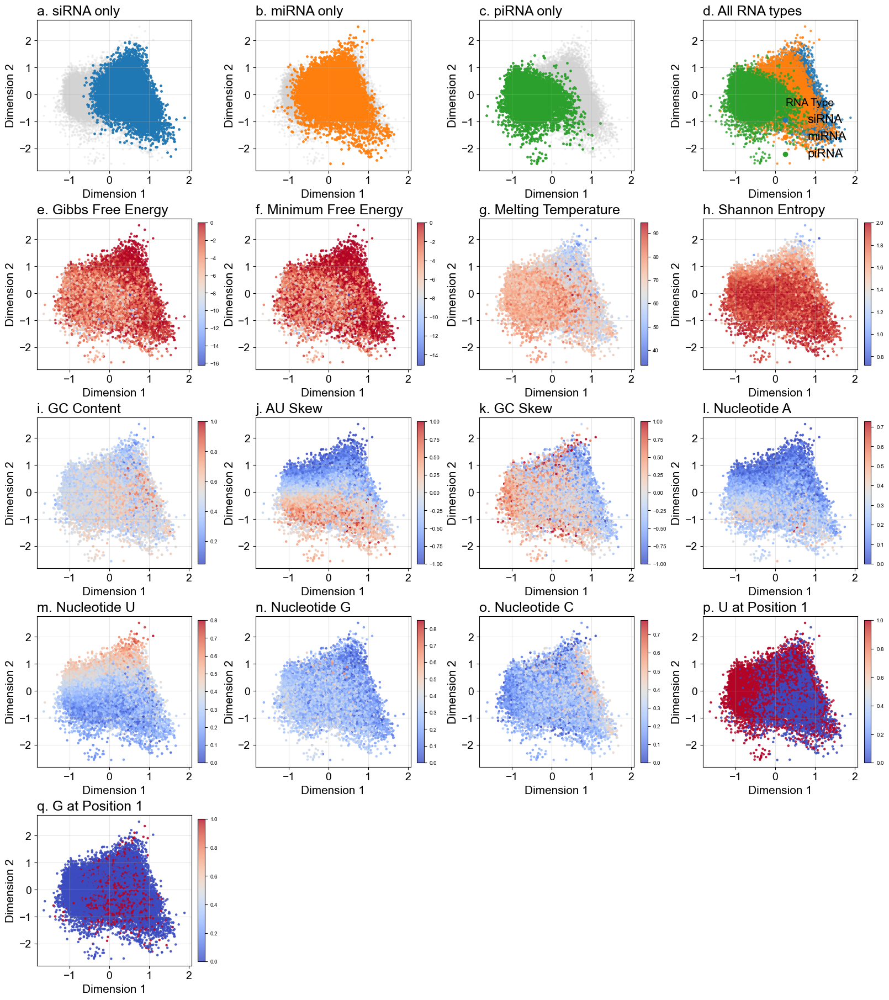

In [ ]:
def generateIndividualFeaturePlots(reduced_data, siRNA, miRNA, piRNA, output_file_path, dataNum, filename ='', individual_format="svg", rasterize_points=True, raster_dpi=180):
    plt.rcParams.update({
        "svg.fonttype": "none",
        "font.family": 'Arial',
        "font.size": 15,
        "axes.titlesize": 18,
        "axes.labelsize": 15, 
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 16,
        "legend.title_fontsize": 14
    })

    abc_numbers = 'abcdefghijklmnopqrs'

    reNameDict = {
        'gibbs_free_energy': 'Gibbs Free Energy',
        'minimum_free_energy': 'Minimum Free Energy',
        'melting_temp': 'Melting Temperature',
        'shannon_entropy': 'Shannon Entropy',
        'gc_content': 'GC Content',
        'au_skew': 'AU Skew',
        'gc_skew': 'GC Skew',
        'a_content': 'Nucleotide A',
        'u_content': 'Nucleotide U',
        'g_content': 'Nucleotide G',
        'c_content': 'Nucleotide C',
        'U_1': 'U at Position 1',
        'G_1': 'G at Position 1'
    }

    siRNA_df = siRNA
    miRNA_df = miRNA
    piRNA_df = piRNA

    siRNA_df['RNA Type'] = 'siRNA'
    miRNA_df['RNA Type'] = 'miRNA'
    piRNA_df['RNA Type'] = 'piRNA'

    full_df = pd.concat([siRNA_df, miRNA_df, piRNA_df], ignore_index=True)
    RNA_types = full_df['RNA Type'].values
    type_colors = {'siRNA': '#1f77b4', 'miRNA': '#ff7f0e', 'piRNA': '#2ca02c'}
    color_vector = [type_colors[rna] for rna in RNA_types]

    common_cols = set(siRNA_df.columns) & set(miRNA_df.columns) & set(piRNA_df.columns)
    valid_features = [f for f in reNameDict if f in common_cols ]
    print(valid_features)

    os.makedirs(output_file_path, exist_ok=True)

    def get_feature_values(feature):
        vals = np.concatenate([
            siRNA_df[feature].values,
            miRNA_df[feature].values,
            piRNA_df[feature].values
        ])
        return vals

    def rscatter(ax, *args, **kwargs):
        # ensure only the heavy point cloud is rasterized
        if rasterize_points and "rasterized" not in kwargs:
            kwargs["rasterized"] = True
        return ax.scatter(*args, **kwargs)

    ncols = 4
    total_plots = 4 + len(valid_features)
    nrows = int(math.ceil(total_plots / ncols))

    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(ncols*4.0, nrows*3.6),
        constrained_layout=True
    )
    if nrows == 1:
        axes = np.array([axes])
    axes = axes.reshape(nrows, ncols)

    for ax in axes.flat:
        ax.set_rasterization_zorder(0)

    mask_si = (RNA_types == 'siRNA')
    mask_mi = (RNA_types == 'miRNA')
    mask_pi = (RNA_types == 'piRNA')

    ax = axes[0,0]
    rscatter(ax, reduced_data[:,0], reduced_data[:,1], c="#d3d3d3", s=4, alpha=0.25)
    rscatter(ax, reduced_data[mask_si,0], reduced_data[mask_si,1], c=type_colors['siRNA'], s=6, alpha=0.9)
    ax.set_title("a. siRNA only", loc='left'); ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    ax = axes[0,1]
    rscatter(ax, reduced_data[:,0], reduced_data[:,1], c="#d3d3d3", s=4, alpha=0.25)
    rscatter(ax, reduced_data[mask_mi,0], reduced_data[mask_mi,1], c=type_colors['miRNA'], s=6, alpha=0.9)
    ax.set_title("b. miRNA only", loc='left'); ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    ax = axes[0,2]
    rscatter(ax, reduced_data[:,0], reduced_data[:,1], c="#d3d3d3", s=4, alpha=0.25)
    rscatter(ax, reduced_data[mask_pi,0], reduced_data[mask_pi,1], c=type_colors['piRNA'], s=6, alpha=0.9)
    ax.set_title("c. piRNA only", loc='left'); ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    ax = axes[0,3]
    rscatter(ax, reduced_data[:, 0], reduced_data[:, 1], c=color_vector, s=5, alpha=0.7)
    for label in type_colors:
        ax.scatter([], [], c=type_colors[label], label=label)
    ax.legend(title="RNA Type", frameon=False, loc='lower right')
    ax.set_title("d. All RNA types", loc='left')
    ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    start_idx = 4
    for idx, feature in enumerate(valid_features):
        r = (start_idx + idx) // ncols
        c = (start_idx + idx) % ncols
        ax = axes[r, c]
        vals = get_feature_values(feature)
        sc = rscatter(ax, reduced_data[:,0], reduced_data[:,1], c=vals, cmap='coolwarm', s=5, alpha=0.8)
        ax.set_title(f'{abc_numbers[start_idx+idx]}. {reNameDict[feature]}', loc='left')
        ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)
        cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=7)

    last_filled = total_plots - 1
    for k in range(last_filled + 1, nrows*ncols):
        r = k // ncols
        c = k % ncols
        axes[r, c].axis('off')

    panel_path = os.path.join(output_file_path, f"RNA_FM_tSNE_PANEL_{dataNum}k{filename}.{individual_format}")
    # fig.savefig(panel_path, format=individual_format, bbox_inches="tight", dpi=raster_dpi)
    # plt.close(fig)
    print(f"Saved {individual_format.upper()} panel to: {panel_path}")

all_emb = np.concat([sirna_emb, mirna_emb, pirna_emb])
print(all_emb.shape)
tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
reduced_data = tsne.fit_transform(all_emb)
generateIndividualFeaturePlots(reduced_data, sirna, mirna, pirna, "./", "23", filename='_antisense_')

# PCA 
pca = PCA(n_components=2, random_state=42)
pca_reduced_data = pca.fit_transform(all_emb)
generateIndividualFeaturePlots(pca_reduced_data, sirna, mirna, pirna, "./", "23", filename='_antisense_PCA')

In [66]:
# Plot RNA types as backgrounds 
def plot_rna_type(reduced_data, siRNA, miRNA, piRNA, rna_type, fig, ax, bg_only=False, rasterize_points=True):
    plt.rcParams.update({
        "svg.fonttype": "none",
        "font.size": 11,
        "axes.titlesize": 14,
        "axes.labelsize": 11,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "legend.fontsize": 10,
        "legend.title_fontsize": 11
    })

    # tsne = TSNE(n_components=2, random_state=42, perplexity=30, learning_rate=200)
    # reduced_data = tsne.fit_transform(all_embeddings)
    siRNA_df = siRNA
    miRNA_df = miRNA
    piRNA_df = piRNA

    siRNA_df['RNA Type'] = 'siRNA'
    miRNA_df['RNA Type'] = 'miRNA'
    piRNA_df['RNA Type'] = 'piRNA'

    full_df = pd.concat([siRNA_df, miRNA_df, piRNA_df], ignore_index=True)
    RNA_types = full_df['RNA Type'].values
    type_colors = {'siRNA': '#1f77b4', 'miRNA': '#ff7f0e', 'piRNA': '#2ca02c'}
    color_vector = [type_colors[rna] for rna in RNA_types]

    def rscatter(ax, *args, **kwargs):
        # ensure only the heavy point cloud is rasterized
        if rasterize_points and "rasterized" not in kwargs:
            kwargs["rasterized"] = True
        return ax.scatter(*args, **kwargs)

    if rna_type == 'all': 
        rscatter(ax, reduced_data[:, 0], reduced_data[:, 1], c=color_vector, s=5, alpha=0.7)
        for label in type_colors:
            ax.scatter([], [], c=type_colors[label], label=label)
        ax.legend(title="RNA Type", frameon=False, loc='lower right')
        ax.set_title("All RNA types")
        ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    else:
        mask = (RNA_types == rna_type)
        rscatter(ax, reduced_data[~mask,0], reduced_data[~mask,1], c="#d3d3d3", s=4, alpha=0.25)
        if not bg_only: 
            rscatter(ax, reduced_data[mask,0], reduced_data[mask,1], c=type_colors[rna_type], s=6, alpha=0.9)
        ax.set_title(f"{rna_type} only"); ax.set_xlabel("Dimension 1"); ax.set_ylabel("Dimension 2"); ax.grid(True, alpha=0.3)

    return fig, ax

### 4.1.1 Length-matched Dataset

15 34
19 19
26 32
PearsonRResult(statistic=np.float64(-0.8243964526052512), pvalue=np.float64(0.0))
PearsonRResult(statistic=np.float64(-0.01855671545953061), pvalue=np.float64(1.0235307025507953e-06))
Pearson correlation between Length and Dimension 0: PearsonRResult(statistic=np.float64(-0.8243964526052512), pvalue=np.float64(0.0))
Pearson correlation between Length and Dimension 1: PearsonRResult(statistic=np.float64(-0.01855671545953061), pvalue=np.float64(1.0235307025507953e-06))
siRNA
PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))
PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))
Pearson correlation between Length and Dimension 0: PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))
Pearson correlation between Length and Dimension 1: PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))
miRNA
PearsonRResult(statistic=np.float64(-0.20647965762101), pvalue=np.float64(5.295846477320296e-221))
PearsonRResult(statistic=np.flo

/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1709829843.py:48: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  print(pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 0]))
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1709829843.py:49: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  print(pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 1]))
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1709829843.py:50: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  print(f'Pearson correlation between Length and Dimension 0: {pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 0])}')
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1709829843.py:51: ConstantInputWarning

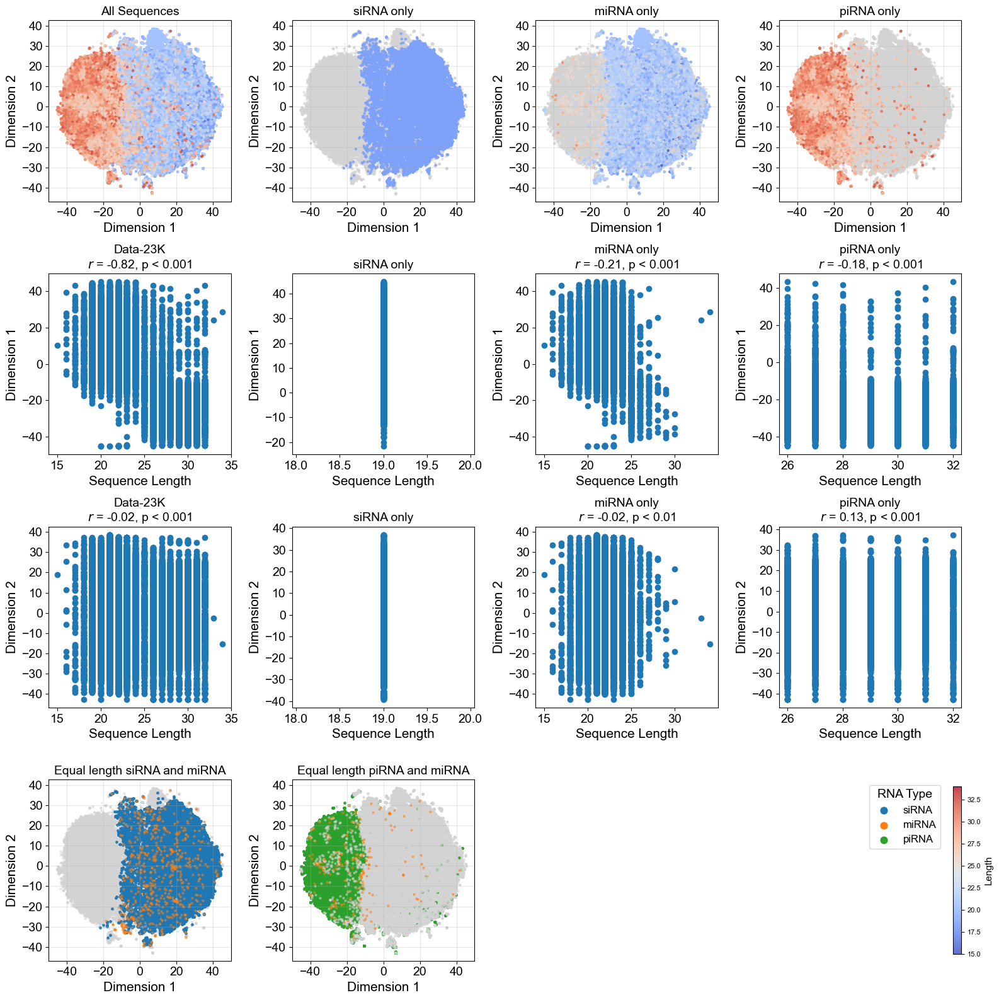

In [ ]:
# Plot the length distribution separated by RNA type 
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "legend.title_fontsize": 11
})

labels = ['siRNA', 'miRNA', 'piRNA']
cluster_labels = np.concat([sirna['RNA Type'], mirna['RNA Type'], pirna['RNA Type']])

for df in [mirna, sirna, pirna]:
    df['length'] = df['sequence'].apply(lambda x: len(x))
    print(df['length'].min(), df['length'].max())

mirna_p = mirna[(mirna['length'] >= 26) & (mirna['length'] <= 32)]
mirna_s = mirna[(mirna['length'] == 19)]

mirna_red = reduced_data[len(sirna):len(sirna)+len(mirna)]

for i, ax in enumerate(axs.flatten()):
    if i == 0: 
        vals = np.concatenate([
            sirna['length'].values,
            mirna['length'].values,
            pirna['length'].values
        ])
        print(pearsonr(vals, reduced_data[:, 0]))
        print(pearsonr(vals, reduced_data[:, 1]))
        print(f'Pearson correlation between Length and Dimension 0: {pearsonr(vals, reduced_data[:, 0])}')
        print(f'Pearson correlation between Length and Dimension 1: {pearsonr(vals, reduced_data[:, 1])}')
        sc = ax.scatter(reduced_data[:,0], reduced_data[:,1], c=vals, cmap='coolwarm', s=5, alpha=0.8)
        ax.set_title('All Sequences')
        ax.set_xlabel("Dimension 1")
        ax.set_ylabel("Dimension 2")
        ax.grid(True, alpha=0.3)

    elif 0 < i < 4:
        print(labels[i-1])
        fig, ax = plot_rna_type(reduced_data, sirna, mirna, pirna, labels[i-1], fig, ax, bg_only=True)
        ax.scatter(reduced_data[cluster_labels == labels[i-1], 0], reduced_data[cluster_labels == labels[i-1], 1], c=vals[cluster_labels == labels[i-1]], cmap='coolwarm', s=5, alpha=0.8, vmin=vals.min(), vmax=vals.max()) 
        print(pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 0]))
        print(pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 1]))
        print(f'Pearson correlation between Length and Dimension 0: {pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 0])}')
        print(f'Pearson correlation between Length and Dimension 1: {pearsonr(vals[cluster_labels == labels[i-1]], reduced_data[cluster_labels == labels[i-1], 1])}')

        ax.set_xlabel("Dimension 1")
        ax.set_ylabel("Dimension 2")

    elif i == 4:
        ax.scatter(vals, reduced_data[:, 0])
        print(pearsonr(vals, reduced_data[:, 0]))
        ax.set_xlabel("Sequence Length")
        ax.set_ylabel("Dimension 1")
        ax.set_title(f'Data-23K\n' fr"$r$ = {round(pearsonr(vals, reduced_data[:, 0]).statistic, 2)}, p < 0.001")
        ax.set_xlim(14, 35)
    
    elif 4 < i < 8:
        print(labels[i % 4 - 1 ])
        ax.scatter(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 0])
        ax.set_xlabel("Sequence Length")
        ax.set_ylabel("Dimension 1")
        print(pearsonr(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 0]))
        if labels[i%4 - 1] != 'siRNA': 
            ax.set_title(f'{labels[i%4 - 1]} only\n'  fr"$r$ = {round(pearsonr(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 0]).statistic, 2)}, p < 0.001")
        else:
            ax.set_title(f'{labels[i%4 - 1]} only')

    elif i == 8:
        ax.scatter(vals, reduced_data[:, 1])
        ax.set_xlabel("Sequence Length")
        ax.set_ylabel("Dimension 2")
        print(pearsonr(vals, reduced_data[:, 1]))
        ax.set_title(f'Data-23K\n' fr"$r$ = {round(pearsonr(vals, reduced_data[:, 1]).statistic, 2)}, p < 0.001")
        ax.set_xlim(14, 35)
    
    elif 8 < i < 12:
        print(labels[i % 4 - 1 ])
        ax.scatter(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 1])
        ax.set_xlabel("Sequence Length")
        ax.set_ylabel("Dimension 2")
        print(pearsonr(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 1]))
        if labels[i%4 - 1] == 'piRNA': 
            ax.set_title(f'{labels[i%4 - 1]} only\n' fr"$r$ = {round(pearsonr(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 1]).statistic, 2)}, p < 0.001")
        elif labels[i%4 - 1] == 'miRNA': 
            ax.set_title(f'{labels[i%4 - 1]} only\n' fr"$r$ = {round(pearsonr(vals[cluster_labels == labels[i % 4 -1 ]], reduced_data[cluster_labels == labels[i % 4 -1 ], 1]).statistic, 2)}, p < 0.01")
        else:
            ax.set_title(f'{labels[i%4 - 1]} only')

    elif i == 12: 
        fig, ax = plot_rna_type(reduced_data, sirna, mirna, pirna, 'siRNA', fig, ax, bg_only=False)
        ax.scatter(mirna_red[mirna_s.index,:][:, 0], mirna_red[mirna_s.index,:][:, 1], c='#ff7f0e', s=4, alpha=0.5) 
        ax.set_title('Equal length siRNA and miRNA')
    
    elif i == 13:
        # Length-matched miRNA and piRNA
        fig, ax = plot_rna_type(reduced_data, sirna, mirna, pirna, 'piRNA', fig, ax, bg_only=False)
        ax.scatter(mirna_red[[x for x in mirna.index if x not in mirna_p.index],:][:, 0], mirna_red[[x for x in mirna.index if x not in mirna_p.index],:][:, 1], c='#d3d3d3', s=4, alpha=0.5) # not length-matched 
        ax.scatter(mirna_red[mirna_p.index,:][:, 0], mirna_red[mirna_p.index,:][:, 1], c='#ff7f0e', s=4, alpha=0.5) # length-matched 
        ax.set_title('Equal length piRNA and miRNA')

    else:
        ax.set_axis_off()

for ax in list(axs.flatten())[-1:]:
    cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04, label='Length')
    cbar.ax.tick_params(labelsize=8)

    ax.scatter([], [], color='tab:blue', label='siRNA', s=60)
    ax.scatter([], [], color='tab:orange', label='miRNA', s=60)
    ax.scatter([], [], color='tab:green', label='piRNA', s=60)
    ax.legend(title="RNA Type", title_fontsize=14, fontsize=12)


plt.tight_layout()
# plt.savefig('./RNA_FM_tSNE_miRNA_Length_23k_Updated_fix.svg')
# plt.savefig('./RNA_FM_tSNE_miRNA_Length_23k_Updated_fix.png')
plt.show()

### 4.1.2 Clustering Performance

In [ ]:
# Using t-SNE reduced RNA-FM features
clustering_performance = pd.DataFrame(columns=['silhouette_score'], index= ['true', 'true_siRNA', 'true_miRNA', 'true_piRNA', 'random', 'random_siRNA', 'random_miRNA', 'random_piRNA'])

# RNA type labels with true features  
cluster_labels = np.concat([sirna['RNA Type'], mirna['RNA Type'], pirna['RNA Type']])
average_sil_score  = silhouette_score(X=reduced_data, labels=cluster_labels)
sil_per_group = silhouette_samples(X=reduced_data, labels=cluster_labels)

clustering_performance.at['true', 'silhouette_score'] = average_sil_score
for label in np.unique(cluster_labels):
    clustering_performance.at[f'true_{label}', 'silhouette_score'] = sil_per_group[cluster_labels == label].mean()

# RNA type labels with randomly assigned features 
np.random.seed(42)
random_labels = cluster_labels.copy()
np.random.shuffle(random_labels)
average_sil_score = silhouette_score(X=reduced_data, labels=random_labels)
sil_per_group = silhouette_samples(X=reduced_data, labels=random_labels)

clustering_performance.at['random', 'silhouette_score'] = average_sil_score
for label in np.unique(random_labels):
    clustering_performance.at[f'random_{label}', 'silhouette_score'] = sil_per_group[random_labels == label].mean()

clustering_performance

,silhouette_score,ch_score,db_index
true,0.181239,NaN,NaN
true_siRNA,0.144618,NaN,NaN
true_miRNA,-0.051724,NaN,NaN
true_piRNA,0.450824,NaN,NaN
random,-0.001994,NaN,NaN
random_siRNA,-0.002125,NaN,NaN
random_miRNA,0.000143,NaN,NaN
random_piRNA,-0.004001,NaN,NaN


In [ ]:
# Using PCA-Reduced RNA-FM features
clustering_performance = pd.DataFrame(columns=['silhouette_score'], index= ['true', 'true_siRNA', 'true_miRNA', 'true_piRNA', 'random', 'random_siRNA', 'random_miRNA', 'random_piRNA'])

# RNA type labels with true PCA-Reduced RNA-FM features
cluster_labels = np.concat([sirna['RNA Type'], mirna['RNA Type'], pirna['RNA Type']])
average_sil_score  = silhouette_score(X=pca_reduced_data, labels=cluster_labels)
sil_per_group = silhouette_samples(X=pca_reduced_data, labels=cluster_labels)

clustering_performance.at['true', 'silhouette_score'] = average_sil_score
for label in np.unique(cluster_labels):
    clustering_performance.at[f'true_{label}', 'silhouette_score'] = sil_per_group[cluster_labels == label].mean()

# RNA type labels with randomly assigned features 
np.random.seed(42)
random_labels = cluster_labels.copy()
np.random.shuffle(random_labels)
average_sil_score = silhouette_score(X=pca_reduced_data, labels=random_labels)
sil_per_group = silhouette_samples(X=pca_reduced_data, labels=random_labels)

clustering_performance.at['random', 'silhouette_score'] = average_sil_score
for label in np.unique(random_labels):
    clustering_performance.at[f'random_{label}', 'silhouette_score'] = sil_per_group[random_labels == label].mean()

clustering_performance

,silhouette_score,ch_score,db_index
true,0.173587,NaN,NaN
true_siRNA,0.09978,NaN,NaN
true_miRNA,-0.030079,NaN,NaN
true_piRNA,0.451059,NaN,NaN
random,-0.002225,NaN,NaN
random_siRNA,-0.001883,NaN,NaN
random_miRNA,0.000629,NaN,NaN
random_piRNA,-0.005421,NaN,NaN


### 4.1.3 Substructures

In [71]:
# to obtain these files, see: https://www.mirbase.org/download/CURRENT/database_files (version 22.1 is used at the time of publication)

# Map ascension ID to the index used in the text files 
with open('mirna_mature.txt', 'r') as f:
    matasc2id = f.read()
matasc2id = matasc2id.strip('<p>').strip('<br></p>\n').split('<br>')
matasc2id_dict = {k:v for k, v in zip([x.split('\t')[0] for x in matasc2id], [x.split('\t')[3] for x in matasc2id])} # both lists are of the same length 

# Map precursor ID to the family ID 
with open('mirna_2_prefam.txt', 'r') as f:
    pre2fam = f.read()
pre2fam = pre2fam.strip('<p>').strip('<br></p>\n').split('<br>')
pre2fam_df = pd.DataFrame([x.split('\t')[0:2] for x in pre2fam], columns=['precursor', 'family']) #first column is precursor id, second column is family id 

# Map family ID to actual family 
with open('mirna_prefam.txt', 'r') as f:
    id2fam = f.read()
id2fam = id2fam.strip('<p>').strip('<br></p>\n').split('<br>')
id2fam_dict = {k: v for k, v in zip([x.split('\t')[0] for x in id2fam], [x.split('\t')[2] for x in id2fam])} #k is family id, v is family name  # both lists are of the same length 

# Map mature RNA to their precursor to get the RNA family 
with open('mirna_pre_mature.txt', 'r') as f:
    mat2pre = f.read()
mat2pre = mat2pre.strip('<p>').strip('<br></p>\n').split('<br>')
# Lists are not of the same length hence if i use zip it will cause the mature rna to only map to the last precursor 
mat2pre_df = pd.DataFrame([x.split('\t')[0:2] for x in mat2pre], columns=['precursor', 'matureseq'])

mat2pre_df = mat2pre_df.merge(pre2fam_df, how='left')
mat2pre_df['familyname'] = mat2pre_df['family'].map(id2fam_dict)
mat2pre_df['mature_acc'] = mat2pre_df['matureseq'].map(matasc2id_dict)

# for additional verification
# Maps to external database
with open('mirna_database_links.txt', 'r') as f:
    id2ext = f.read()
id2ext = id2ext.strip('<p>').strip('<br></p>\n').split('<br>')
id2ext_df = pd.DataFrame([x.split('\t') for x in id2ext], columns=['ID', 'database', 'database_ID', 'familyname'])
# Remove withdrawn sequences from miRBase 
id2ext_df = id2ext_df[~id2ext_df['familyname'].str.contains('withdrawn')]

# Map database ID to its origin - this should act as another level for verification
with open('mirna_database_url.txt', 'r') as f:
    rna_db = f.read()
rna_db = rna_db.strip('<p>').strip('<br></p>\n').split('<br>')
rna_db_dict = {k: v for k, v in zip([x.split('\t')[0] for x in rna_db], [x.split('\t')[1] for x in rna_db])}
id2ext_df['database'] = id2ext_df['database'].map(rna_db_dict)
# Remove precursors that maps to RNAcentral only because the family name listed from RNAcentral is database-specific, hence difficult to combine with other databases 
id2ext_df = id2ext_df[id2ext_df['database'] != 'RNAcentral'].reset_index(drop=True)
# Some precursors have no familyname 
id2ext_df['familyname'] = id2ext_df['familyname'].replace('', np.nan)
id2ext_df = id2ext_df.dropna().reset_index(drop=True)

# Assigning a common name for the same precursor ID 
id2ext_df['priority'] = (id2ext_df['database'] == 'Rfam').map({True: 0, False:1}) # using Rfam as the priority instead of HGNC because it is for all ncRNAs 
id2ext_df = id2ext_df.sort_values(['familyname','priority']).groupby("ID", as_index=False).first() # If RFam doesn't have gene name existing, then take the first value

In [ ]:
# Directly extract available family information from miRBase 22.1
mirna_df = pd.read_csv('mirna_sequences_whole_species.csv', index_col=0).rename(columns={'accession_id':'mature_acc', 'species_id': 'mature_id'})

# for ascension id with existing familyname, keep 
mirna_df = mirna_df.merge(mat2pre_df[['mature_acc','familyname']].dropna().drop_duplicates().reset_index(drop=True), how='left')
print(f'Number of entries still missing: {len(mirna_df[mirna_df['familyname'].isna()])}')

# for those without existing familyname, check if miRBase has it for external databases
mat2ext = mat2pre_df[['mature_acc','precursor','familyname']].drop_duplicates().reset_index(drop=True)
mat2ext = mat2ext.set_index(['mature_acc'])
mat2ext = mat2ext.loc[mirna_df.loc[mirna_df['familyname'].isna(), 'mature_acc'],:]
mat2ext = mat2ext.drop(columns=['familyname'])
mat2ext = mat2ext.loc[mirna_df.loc[mirna_df['familyname'].isna(), 'mature_acc'],:].reset_index().merge(id2ext_df[['ID', 'familyname']].drop_duplicates(), left_on='precursor', right_on='ID', how='left')
mat2ext = mat2ext.sort_values(['familyname']).groupby("mature_acc").first() # If more than one precursor exists for the mature RNA, use the first precursor 

mirna_df.loc[mirna_df['familyname'].isna(), 'familyname'] = mat2ext.loc[mirna_df.loc[mirna_df['familyname'].isna(), 'mature_acc'],'familyname'].tolist()

mirna_df['exist_in_other_db'] = mirna_df['familyname'].notna().map({True: 1, False: 0}) # later on, this can verify if the families are extracted from actual databases versus separated using regex; separating via regex introduces a misconception as RNA families are defined by conserved seed sequences but may have other names 

mirna_df = mirna_df.set_index(['mature_acc'])

print(f'Number of entries still missing: {len(mirna_df[mirna_df['familyname'].isna()])}')

Number of entries still missing: 24932
Number of entries still missing: 21060


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2850644896.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  subgroups_of_interest = plot_mirna.groupby(['familyname']).apply(len).sort_values()[::-1][:5].index


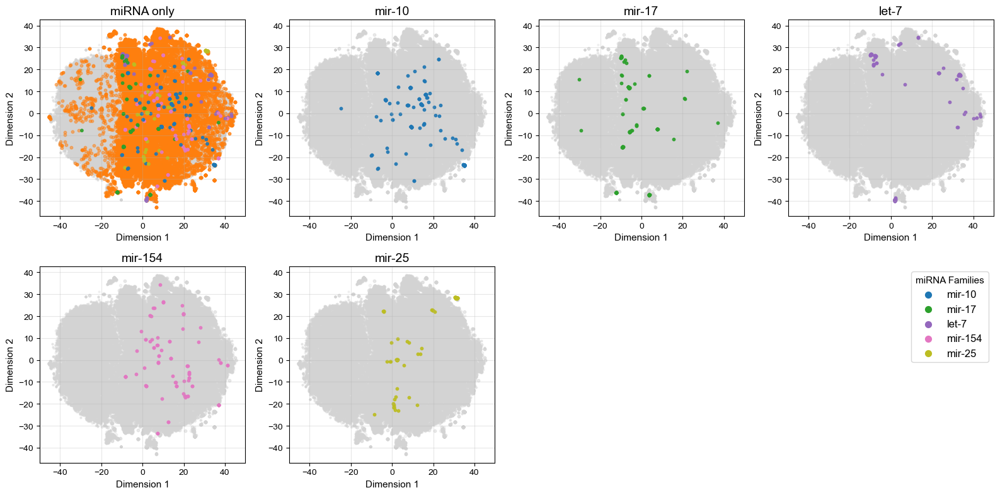

In [ ]:
mirna_subgroups = mirna_df.reset_index()[['mature_seq', 'familyname', 'exist_in_other_db']].dropna().drop_duplicates().reset_index(drop=True)
# Filter out sequences from Data-23K that has subgroups 
plot_mirna = mirna[['sequence']].merge(mirna_subgroups, left_on='sequence', right_on='mature_seq',how='left').dropna().reset_index(drop=True)
plot_mirna = plot_mirna[plot_mirna['exist_in_other_db'] == 1].reset_index(drop=True)
# Plot 5 most abundant families
subgroups_of_interest = plot_mirna.groupby(['familyname']).apply(len).sort_values()[::-1][:5].index
mirna_red_data = reduced_data[len(sirna):len(sirna)+len(mirna)]

fig, axs = plt.subplots(2, 4, figsize=(16,8))
cmap = plt.get_cmap("tab10")
for i, ax in enumerate(axs.flatten()):
    if i == 0: 
        group_in_code = plot_mirna[plot_mirna['familyname'].isin(subgroups_of_interest)]['familyname'].astype(pd.CategoricalDtype(categories=subgroups_of_interest, ordered=True)).cat.codes.tolist()
        mask = mirna['sequence'].isin(plot_mirna[plot_mirna['familyname'].isin(subgroups_of_interest)]['sequence'])
        fig, ax = plot_rna_type(reduced_data, sirna, mirna, pirna, 'miRNA', fig, ax, bg_only=True)
        ax.scatter(mirna_red_data[~mask, 0], mirna_red_data[~mask, 1], c='#ff7f0e', s=10, alpha=0.5, rasterized=True) # normal 
        ax.scatter(mirna_red_data[mask, 0], mirna_red_data[mask, 1], c=[cmap(x/len(subgroups_of_interest)) for x in group_in_code], s=10, alpha=0.9, rasterized=True) # with subgroup labels 
    elif i < 6:
        group = subgroups_of_interest[i-1]
        fig, ax = plot_rna_type(reduced_data, sirna, mirna, pirna, 'miRNA', fig, ax, bg_only=True)
        mask = mirna['sequence'].isin(plot_mirna[plot_mirna['familyname'] == group]['sequence'])
        ax.scatter(mirna_red_data[~mask, 0], mirna_red_data[~mask, 1], c="#d3d3d3", s=10, alpha=0.25, rasterized=True) # normal
        ax.scatter(mirna_red_data[mask, 0], mirna_red_data[mask, 1], color=cmap((i-1)/ len(subgroups_of_interest)), s=10, alpha=0.9, rasterized=True)
        ax.set_title(group)
    else:
        ax.set_axis_off()

for ax in list(axs.flatten())[-1:]:
    for i, l in enumerate(subgroups_of_interest):
        ax.scatter([], [], color=cmap((i)/ len(subgroups_of_interest)), label=l, s=50)
    ax.legend(title="miRNA Families",fontsize=12)

plt.tight_layout()
# plt.savefig('./RNA_FM_tSNE_miRNA_Subgroups_23k_Updated.svg')
# plt.savefig('./RNA_FM_tSNE_miRNA_Subgroups_23k_Updated.png')
plt.show()

In [77]:
# Clustering performance evaluation 
mapping = {seq: i for i, seq in enumerate(mirna['sequence'])}
clus_df = plot_mirna.copy()
clus_df['index_in_mirna'] = clus_df['sequence'].map(mapping)
clus_df = clus_df[['familyname', 'index_in_mirna']].groupby(['familyname']).agg(list)
clus_df = clus_df.reset_index().explode(['index_in_mirna'])

org_feat = mirna_emb[list(clus_df['index_in_mirna']), : ]

clustering_performance = pd.DataFrame(columns=['silhouette_score'], index=['true', 'random'])
sil_df = {'miRNA Family': [], 'Silhouette Score': []}
random_sil_df = {'miRNA Family': [], 'Silhouette Score': []}

# miRNA families with true RNA-FM features 
cluster_labels = np.array(list(clus_df['familyname']))
average_sil_score = silhouette_score(X=org_feat, labels=cluster_labels)
sil_per_fam = silhouette_samples(X=org_feat, labels=cluster_labels)
for label in np.unique(cluster_labels):
    sil_df['miRNA Family'].append(label)
    sil_df['Silhouette Score'].append(sil_per_fam[cluster_labels == label].mean())

clustering_performance.at['true', 'silhouette_score'] = average_sil_score

# miRNA families with randomly assigned features 
np.random.seed(42)
random_labels = cluster_labels.copy()
np.random.shuffle(random_labels)
average_sil_score = silhouette_score(X=org_feat, labels=random_labels)
sil_per_fam = silhouette_samples(X=org_feat, labels=random_labels)
for label in np.unique(random_labels):
    random_sil_df['miRNA Family'].append(label)
    random_sil_df['Silhouette Score'].append(sil_per_fam[random_labels == label].mean())
clustering_performance.at['random', 'silhouette_score'] = average_sil_score

clustering_performance

,silhouette_score
true,-0.242
random,-0.403865


1.2781024846233218e-39


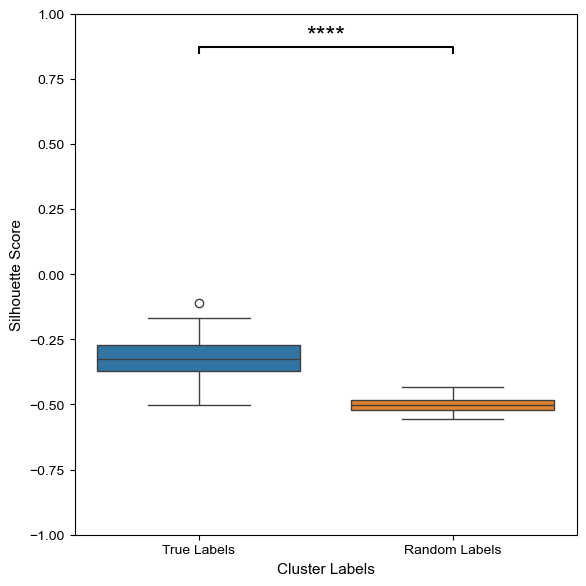

In [ ]:
# Boxplots of distribution of silhouette score of all miRNA families 
# of miRNA families with sequence counts > 20 
true_df = pd.DataFrame(sil_df)
true_df = true_df.merge(clus_df['familyname'].value_counts().reset_index().rename(columns={'familyname': 'miRNA Family'}))
true_df = true_df[true_df['count'] > 20]

random_df = pd.DataFrame(random_sil_df)
random_df = random_df.merge(pd.Series(random_labels).value_counts().reset_index().rename(columns={'index':'miRNA Family'}))
random_df = random_df[random_df['count'] > 20]

fig, ax = plt.subplots(1,1, figsize=(6,6))
sns.boxplot(pd.DataFrame(np.array([true_df['Silhouette Score'],random_df['Silhouette Score']])).T.rename(columns={0:'True Labels', 1: 'Random Labels'}), ax=ax)
ax.set_xlabel('Cluster Labels')
ax.set_ylabel('Silhouette Score')
ax.set_ylim(-1, 1)

p_value = scipy.stats.ks_2samp(true_df['Silhouette Score'],random_df['Silhouette Score']).pvalue
print(p_value)
if p_value < 0.05:
    x1, x2 = 0, 1
    y, h = 0.85, 0.02
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], c='k')
    ax.text((x1+x2)/2, y+h, p_value if p_value >= 0.0001 else '****', ha='center', va='bottom', fontdict={'size': 18})
plt.tight_layout()
# plt.savefig('./miRNA_families_RNA-FM_features_sil_score_23k_populated_fix.png')
# plt.savefig('./miRNA_families_RNA-FM_features_sil_score_23k_populated_fix.svg')
plt.show()

## 4.2 Correlation 

### 4.2.1 Feature Initialization

In [ ]:
gc_content = list(mirna['gc_content'].values) + list(sirna['gc_content'].values) + list(pirna['gc_content'].values)
gfe = list(mirna['gibbs_free_energy'].values) + list(sirna['gibbs_free_energy'].values) + list(pirna['gibbs_free_energy'].values)
mfe = list(mirna['minimum_free_energy'].values) + list(sirna['minimum_free_energy'].values) + list(pirna['minimum_free_energy'].values)
a_content = list(mirna['a_content'].values) + list(sirna['a_content'].values) + list(pirna['a_content'].values)
u_content = list(mirna['u_content'].values) + list(sirna['u_content'].values) + list(pirna['u_content'].values)
g_content = list(mirna['g_content'].values) + list(sirna['g_content'].values) + list(pirna['g_content'].values)
c_content = list(mirna['c_content'].values) + list(sirna['c_content'].values) + list(pirna['c_content'].values)
tm = list(mirna['melting_temp'].values) + list(sirna['melting_temp'].values) + list(pirna['melting_temp'].values)
au_skew = list(mirna['au_skew'].values) + list(sirna['au_skew'].values) + list(pirna['au_skew'].values)
gc_skew = list(mirna['gc_skew'].values) + list(sirna['gc_skew'].values) + list(pirna['gc_skew'].values)
shannon = list(mirna['shannon_entropy'].values) + list(sirna['shannon_entropy'].values) + list(pirna['shannon_entropy'].values)
u1 = list(mirna['U_1'].values) + list(sirna['U_1'].values) + list(pirna['U_1'].values)
g1 = list(mirna['G_1'].values) + list(sirna['G_1'].values) + list(pirna['G_1'].values)
ggall = list(mirna['GG_all'].values) + list(sirna['GG_all'].values) + list(pirna['GG_all'].values)
uaall = list(mirna['UA_all'].values) + list(sirna['UA_all'].values) + list(pirna['UA_all'].values)
ccall = list(mirna['CC_all'].values) + list(sirna['CC_all'].values) + list(pirna['CC_all'].values)
gcall = list(mirna['GC_all'].values) + list(sirna['GC_all'].values) + list(pirna['GC_all'].values)
uuall = list(mirna['UU_all'].values) + list(sirna['UU_all'].values) + list(pirna['UU_all'].values)

all_emb = np.concat([mirna_emb, sirna_emb, pirna_emb])
print(all_emb.shape)

(69348, 640)


In [82]:
def gen_corr_feat(embeddings, feature, type, filename=None, corr_list=False):
    """
    embeddings: types of embeddings eg. [mirna_emb, sirna_emb, pirna_emb]
    feature: list of the features eg. gc_content
    type: Pearson or Spearman
    filename: saved filename
    corr_list: to generate output as list 
    """

    corr = []
    pval = []
    labels = ['miRNA', 'siRNA', 'piRNA']

    # DataFrame
    df = pd.DataFrame()
    CorrType = []
    RNAType = []
    RnafmEmb = []
    Correlation = []
    PVal = []

    pos = 0
    if type == 'Pearson':
        for idx, emb in enumerate(embeddings):
            print(idx, emb.shape)
            for i in range(0, 640):
                corr.append(pearsonr(feature[pos:pos+len(emb)],emb[:,i])[0])
                pval.append(pearsonr(feature[pos:pos+len(emb)],emb[:,i])[1])
            pos += len(emb)

    elif type == 'Spearman':
        for idx, emb in enumerate(embeddings):
            print(idx, emb.shape)
            for i in range(0, 640):
                corr.append(spearmanr(feature[pos:pos+len(emb)],emb[:,i])[0])
                pval.append(spearmanr(feature[pos:pos+len(emb)],emb[:,i])[1])
            pos += len(emb)

    print(len(corr), len(pval))

    #DataFrame
    for i, x in enumerate([corr[:640],corr[640:640*2],corr[640*2:]]):
        for y in np.argsort(x)[::-1].tolist()[:20]:
            CorrType.append('positive')
            RNAType.append(labels[i])
            RnafmEmb.append(y)
            Correlation.append(x[y])
            PVal.append([pval[:640], pval[640:640*2], pval[640*2:]][i][y])

        for y in np.argsort(x).tolist()[:20]: 
            CorrType.append('negative')
            RNAType.append(labels[i])
            RnafmEmb.append(y)
            Correlation.append(x[y])
            PVal.append([pval[:640], pval[640:640*2], pval[640*2:]][i][y])

    df['RNA Type'] = RNAType
    df['Type'] = CorrType
    df['RNA-FM Features'] = RnafmEmb
    df['Correlation'] = Correlation
    df['P-Value'] = PVal

    if filename != None:
        df.to_csv(filename)

    return df, corr

### 4.2.2 Correlation Calculation

In [83]:
gc_corr_df_23, gc_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], gc_content, 'Pearson')

gfe_corr_df_23, gfe_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], gfe,'Pearson')

mfe_corr_df_23, mfe_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], mfe,'Pearson')

tm_corr_df_23, tm_corr_23  = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], tm, 'Pearson')

shannon_corr_df_23, shannon_corr_23= gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], shannon, 'Pearson')

a_corr_df_23, a_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], a_content,'Pearson')

u_corr_df_23, u_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], u_content,'Pearson')

g_corr_df_23, g_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], g_content,'Pearson')

c_corr_df_23, c_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], c_content,'Pearson')

au_skew_corr_df_23, au_skew_corr_23  = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], au_skew, 'Pearson')

gc_skew_corr_df_23, gc_skew_corr_23  = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], gc_skew, 'Pearson')

u1_corr_df_23, u1_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], u1,'Pearson')

g1_corr_df_23, g1_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], g1,'Pearson')

ggall_corr_df_23, ggall_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], ggall,'Pearson')

uaall_corr_df_23, uaall_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], uaall,'Pearson')

ccall_corr_df_23, ccall_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], ccall,'Pearson')

gcall_corr_df_23, gcall_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], gcall,'Pearson')

uuall_corr_df_23, uuall_corr_23 = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], uuall,'Pearson')

0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920
0 (23116, 640)
1 (23116, 640)
2 (23116, 640)
1920 1920


In [84]:
labels = ['GC Content', 'Gibbs Free Energy', 'Minimum Free Energy', 'Nucleotide A', 'Nucleotide U', 'Nucleotide G', 'Nucleotide C', 'Melting Temperature', 'AU Skew', 'GC Skew', 'Shannon Entropy', 'U at Position 1', 'G at Position 1', 'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']
features = []
for y in labels:
    features.append([y]*len(gc_corr_df_23))
features = [feat for featlist in features for feat in featlist]
feat_df_23 = pd.concat([gc_corr_df_23, gfe_corr_df_23, mfe_corr_df_23, a_corr_df_23, u_corr_df_23, g_corr_df_23, c_corr_df_23, tm_corr_df_23, au_skew_corr_df_23, gc_skew_corr_df_23, shannon_corr_df_23, u1_corr_df_23, g1_corr_df_23, ggall_corr_df_23, uaall_corr_df_23, ccall_corr_df_23, gcall_corr_df_23, uuall_corr_df_23])
feat_df_23['Interpretable Features'] = features
feat_df_23 = feat_df_23[[feat_df_23.columns.tolist()[-1]] + feat_df_23.columns.tolist()[:-1]]
feat_df_23

,Interpretable Features,RNA Type,Type,RNA-FM Features,Correlation,P-Value
0,GC Content,miRNA,positive,148,0.923902,0.0
1,GC Content,miRNA,positive,208,0.662369,0.0
2,GC Content,miRNA,positive,204,0.642971,0.0
3,GC Content,miRNA,positive,481,0.632504,0.0
4,GC Content,miRNA,positive,331,0.614782,0.0
...,...,...,...,...,...,...
115,UU across Sequence,piRNA,negative,11,-0.406314,0.0
116,UU across Sequence,piRNA,negative,342,-0.405670,0.0
117,UU across Sequence,piRNA,negative,638,-0.404872,0.0
118,UU across Sequence,piRNA,negative,46,-0.389586,0.0


In [85]:
# All Types Combined
all_emb_gc_corr_23 = []
all_emb_gfe_corr_23 = []
all_emb_mfe_corr_23 = []
all_emb_a_corr_23 = []
all_emb_u_corr_23 = []
all_emb_g_corr_23 = []
all_emb_c_corr_23 = []
all_emb_tm_corr_23 = [] #melting T
all_emb_auskew_corr_23 = [] #au_skew
all_emb_gcskew_corr_23 = [] #gc_skew
all_emb_shannon_corr_23 = [] #shannon E

for idx in range(0, 640):
    all_emb_gc_corr_23.append(pearsonr(gc_content, all_emb[:,idx])[0]) 
    all_emb_gfe_corr_23.append(pearsonr(gfe, all_emb[:,idx])[0]) 
    all_emb_mfe_corr_23.append(pearsonr(mfe, all_emb[:,idx])[0]) 
    all_emb_a_corr_23.append(pearsonr(a_content, all_emb[:,idx])[0]) 
    all_emb_u_corr_23.append(pearsonr(u_content, all_emb[:,idx])[0]) 
    all_emb_g_corr_23.append(pearsonr(g_content, all_emb[:,idx])[0]) 
    all_emb_c_corr_23.append(pearsonr(c_content, all_emb[:,idx])[0]) 
    all_emb_tm_corr_23.append(pearsonr(tm, all_emb[:,idx])[0]) 
    all_emb_auskew_corr_23.append(pearsonr(au_skew, all_emb[:,idx])[0]) 
    all_emb_gcskew_corr_23.append(pearsonr(gc_skew, all_emb[:,idx])[0]) 
    all_emb_shannon_corr_23.append(pearsonr(shannon, all_emb[:,idx])[0]) 

all_emb_td_dict_23 = {'u1': [], 'g1': [], 'ggall': [], 'uaall': [], 'ccall': [], 'gcall': [], 'uuall': []}

for idx in range(0, 640):
    all_emb_td_dict_23['u1'].append(pearsonr(u1, all_emb[:,idx])[0])
    all_emb_td_dict_23['g1'].append(pearsonr(g1, all_emb[:,idx])[0])

    all_emb_td_dict_23['ggall'].append(pearsonr(ggall, all_emb[:,idx])[0])
    all_emb_td_dict_23['uaall'].append(pearsonr(uaall, all_emb[:,idx])[0])
    all_emb_td_dict_23['ccall'].append(pearsonr(ccall, all_emb[:,idx])[0])
    all_emb_td_dict_23['gcall'].append(pearsonr(gcall, all_emb[:,idx])[0])
    all_emb_td_dict_23['uuall'].append(pearsonr(uuall, all_emb[:,idx])[0])

In [86]:
all_df_23 = pd.DataFrame()
all_features = [] 
RnafmEmb = []
PCorrelation = [] 
Type =[]
PPVal = []

labels = ['GC Content', 'Gibbs Free Energy', 'Minimum Free Energy', 'Nucleotide A','Nucleotide U','Nucleotide G','Nucleotide C', 'Melting Temperature', 'AU Skew', 'GC Skew', 'Shannon Entropy', 'U at Position 1','G at Position 1',  'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']
pval_ref = [gc_content, gfe, mfe, a_content, u_content, g_content, c_content, tm, au_skew, gc_skew, shannon, u1, g1, ggall, uaall, ccall, gcall, uuall]

for i, x in enumerate([all_emb_gc_corr_23, all_emb_gfe_corr_23, all_emb_mfe_corr_23, all_emb_a_corr_23, all_emb_u_corr_23, all_emb_g_corr_23, all_emb_c_corr_23, all_emb_tm_corr_23, all_emb_auskew_corr_23, all_emb_gcskew_corr_23,all_emb_shannon_corr_23] + list(all_emb_td_dict_23.values())):
    for y in np.argsort(x)[::-1].tolist()[:20]:
        Type.append('positive')
        all_features.append(labels[i])
        RnafmEmb.append(y)
        PCorrelation.append(x[y])
        PPVal.append(pearsonr(pval_ref[i], all_emb[:,y])[1])
    for y in np.argsort(x).tolist()[:20]:
        Type.append('negative')
        all_features.append(labels[i])
        RnafmEmb.append(y)
        PCorrelation.append(x[y])
        PPVal.append(pearsonr(pval_ref[i], all_emb[:,y])[1])

all_df_23['Interpretable Features'] = all_features
all_df_23['RNA Type'] = ['AllTypes'] * len(all_features)
all_df_23['Type'] = Type        
all_df_23['RNA-FM Features'] = RnafmEmb
all_df_23['Correlation'] = PCorrelation
all_df_23['P-Value'] = PPVal

# all_df_23.to_csv('pearsoncorr_misipirna_all_23k_antisense_fix.csv')
all_df_23

,Interpretable Features,RNA Type,Type,RNA-FM Features,Correlation,P-Value
0,GC Content,AllTypes,positive,148,0.845973,0.0
1,GC Content,AllTypes,positive,116,0.599575,0.0
2,GC Content,AllTypes,positive,481,0.583503,0.0
3,GC Content,AllTypes,positive,208,0.554399,0.0
4,GC Content,AllTypes,positive,204,0.550904,0.0
...,...,...,...,...,...,...
715,UU across Sequence,AllTypes,negative,265,-0.383691,0.0
716,UU across Sequence,AllTypes,negative,11,-0.373201,0.0
717,UU across Sequence,AllTypes,negative,190,-0.373119,0.0
718,UU across Sequence,AllTypes,negative,46,-0.370495,0.0


### 4.2.3 Correlation Heatmap

In [87]:
# Top 20 Most Correlated RNA-FM Features for Base Features Compiled 
def generate_base_feat(feat_corr, all_emb_feat_corr, labels = ['GC Content','Gibbs Free Energy', 'Minimum Free Energy', 'Nucleotide A', 'Nucleotide U','Nucleotide G','Nucleotide C','Melting Temperature','AU Skew','GC Skew','Shannon Entropy', 'U at Position 1', 'G at Position 1', 'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']):
    """
    feat_corr: list containing feature values eg. gc_content
    all_emb_feat_corr: list containing feature values of the Irrespective of RNA type/All Types eg. all_emb_gc_corr
    labels: labels for each feature 
    """
    
    rna_type_labels = ['miRNA', 'siRNA','piRNA','AllTypes']

    indices = []
    for i, feature in enumerate(feat_corr):
        # Positive
        indices.append(np.argsort(feature[:640])[::-1][:20].tolist()) #miRNA 
        indices.append(np.argsort(feature[640:640*2])[::-1][:20].tolist()) #siRNA 
        indices.append(np.argsort(feature[640*2:])[::-1][:20].tolist()) #piRNA
        # Negative
        indices.append(np.argsort(feature[:640])[:20].tolist()) #miRNA
        indices.append(np.argsort(feature[640:640*2])[:20].tolist()) #siRNA 
        indices.append(np.argsort(feature[640*2:])[:20].tolist()) #piRNA

    rows = []

    df = pd.DataFrame(columns=['Base Feature'] + list(set([b for a in indices for b in a])))
    for i, feature in enumerate(feat_corr):
        row1 = []
        row2 = []
        row3 = []
        row4 = []
        for j in list(set([b for a in indices for b in a])):
            row1.append(feature[0+j])
            row2.append(feature[640+j])
            row3.append(feature[640*2+j])
            row4.append(all_emb_feat_corr[i][0+j])
        for id, z in enumerate([row1, row2, row3, row4]):
            z.insert(0, rna_type_labels[id]+' '+labels[i])
            rows.append(z)

    for y in range(len(rows)):
        df.loc[y,:] = rows[y]

    df[df.columns[1:]] = df[df.columns[1:]].astype(float)

    return df 

In [88]:
# 23K
comb_df_23 = generate_base_feat([gc_corr_23, gfe_corr_23, mfe_corr_23, a_corr_23, u_corr_23, g_corr_23, c_corr_23, tm_corr_23, au_skew_corr_23, gc_skew_corr_23, shannon_corr_23, u1_corr_23, g1_corr_23, ggall_corr_23, uaall_corr_23, ccall_corr_23, gcall_corr_23, uuall_corr_23],
                                [all_emb_gc_corr_23, all_emb_gfe_corr_23, all_emb_mfe_corr_23, all_emb_a_corr_23, all_emb_u_corr_23, all_emb_g_corr_23, all_emb_c_corr_23, all_emb_tm_corr_23, all_emb_auskew_corr_23, all_emb_gcskew_corr_23, all_emb_shannon_corr_23, [x for x in all_emb_td_dict_23['u1']], [x for x in all_emb_td_dict_23['g1']], [x for x in all_emb_td_dict_23['ggall']], [x for x in all_emb_td_dict_23['uaall']], [x for x in all_emb_td_dict_23['ccall']], [x for x in all_emb_td_dict_23['gcall']], [x for x in all_emb_td_dict_23['uuall']]])

MultiGraph with 97 nodes and 288 edges


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/3889733035.py:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.fillna(df.max().max())


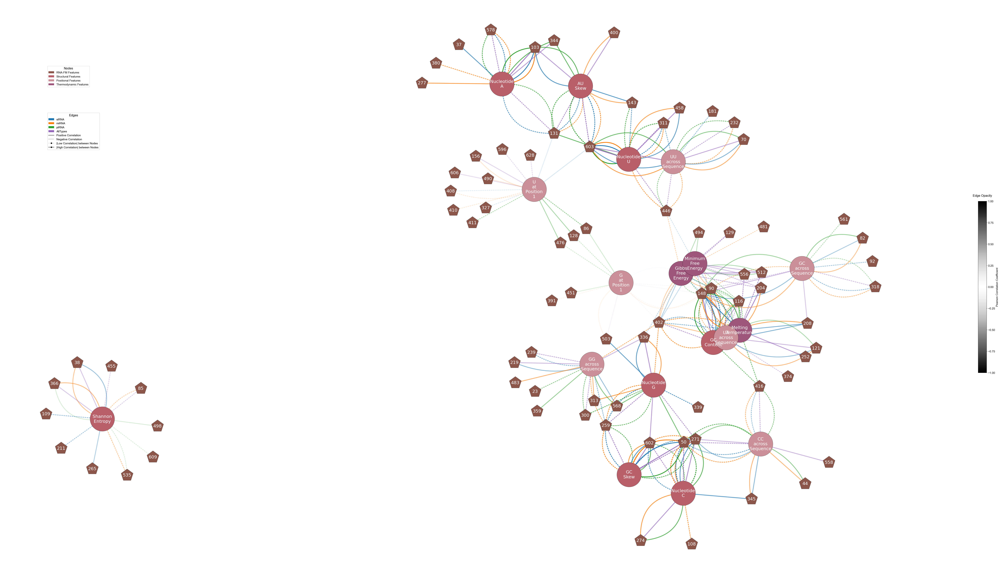

In [89]:
network_df = comb_df_23.set_index(['Base Feature'])
fig, ax = plt.subplots(figsize=(80,40))

g = nx.MultiGraph()
# instead of threshold, pick top 2
network_dict = {}
for y in network_df.T:
    network_dict[y] = sorted(network_df.T[y].items(), key=lambda x: x[1])[:2] + sorted(network_df.T[y].items(), key=lambda x: x[1], reverse=True)[:2]
    if y.startswith('AllTypes'):
        g.add_node('\n'.join(y.split(' ')[1:]))
        for rna_type in ['AllTypes', 'siRNA', 'miRNA', 'piRNA']:
            for z in [x for x in network_dict[y.replace('AllTypes', rna_type)]]:
                if z[0] != y: 
                    g.add_node(z[0])
                    g.add_edge('\n'.join(y.split(' ')[1:]), z[0], weight=z[1], label=rna_type)
                    # print(y, z[0], z[1])
print(g)

hex_colors = ['#B85F69', '#CB9098', '#9E577A'] 

colormap = []
for node,_ in g.nodes.items():
    if type(node) is int:
        colormap.append(matplotlib.colors.to_hex('tab:brown')) 
    elif node in ['Nucleotide\nA', 'Nucleotide\nU', 'Nucleotide\nG', 'Nucleotide\nC', 'GC\nContent', 'GC\nSkew', 'AU\nSkew', 'Shannon\nEntropy']: #Structural 
        colormap.append(hex_colors[0]) #[4])
    elif node in ['U\nat\nPosition\n1', 'UU\nacross\nSequence','G\nat\nPosition\n1', 'GG\nacross\nSequence', 'CC\nacross\nSequence', 'GC\nacross\nSequence', 'UA\nacross\nSequence']: # Positional 
        colormap.append(hex_colors[1])#[0])
    elif node in ['Gibbs\nFree\nEnergy', 'Minimum\nFree\nEnergy', 'Melting\nTemperature']: #Thermo
        colormap.append(hex_colors[2])

edges, weights = zip(*nx.get_edge_attributes(g,'weight').items())
nx.set_edge_attributes(g,values={k: abs(v) for k, v in nx.get_edge_attributes(g,'weight').items()},name='weight') # such that weights are positive for kamada_kawai, but colours will represent neg/pos correlation
paths = dict(nx.shortest_path_length(g, weight=weights))
for x in paths:
    for y in paths[x]:
        paths[x][y] = paths[x][y] * 0.75
d = dict(g.degree)

df = pd.DataFrame(index=g.nodes(), columns=g.nodes())
for row, data in nx.shortest_path_length(g):
    for col, dist in data.items():
        df.loc[row,col] = dist

df = df.fillna(df.max().max())

pos = nx.kamada_kawai_layout(g, dist=df.to_dict(), scale=100)
shapes = [] 
nodesize = []
for y in g.nodes():
    if type(y) is not int:
        shapes.append('o')
        nodesize.append(15000) #5500)
    else:
        shapes.append('p')
        nodesize.append(4000)#1500) #*(8-2)*(d[90]-1)/(21-1))
rna_dict = {'AllTypes': 'tab:purple',
            'siRNA':'tab:blue',
            'miRNA':'tab:orange',
            'piRNA':'tab:green'}

edge_style = []
for weight in weights:
    if weight < 0: 
        edge_style.append('dotted')
    elif weight >= 0:
        edge_style.append('solid')

edge_width = [x*8 for x in list(map(abs,weights))] #13

options = {'edgecolors':'black', 
    'linewidths': 0.5}

for i, node in enumerate(g.nodes()):
    if node in [609,494]:
        pos[node] = pos[node] + [0.15, -0.01]
    elif node in [50, 'Nucleotide\nG']: 
        pos[node] = pos[node] + [0.03, -0.03]
    elif node in [402]: 
        pos[node] = pos[node] + [-0.1, 0.5]
    elif node in [131]:
        pos[node] = pos[node] + [-0.1, -0.1]
    elif node in [148]:
        pos[node] = pos[node] + [-0.2, -0.15]
    elif node in ['GC\nContent', 'Nucleotide\nU']:
        pos[node] = pos[node] + [-0.05, -0.05]
    elif node in ['UA\nacross\nSequence',]:
        pos[node] = pos[node] + [0.2, 0.04]
    elif node in ['Gibbs\nFree\nEnergy']:
        pos[node] = pos[node] + [0.12, -0.06]
    elif node in [204]:
        pos[node] = pos[node] + [-0.08, 0.07]
    elif node in ['Minimum\nFree\nEnergy']:
        pos[node] = pos[node] + [-0.01, -0.015]
    elif node in [512]:
        pos[node] = pos[node] + [-0.015, 0.03]
    elif node in [481]:
        pos[node] = pos[node] + [0.01, 0.03]
    elif node in [556]:
        pos[node] = pos[node] + [0.02, 0.05]
    elif node in [603]:
        pos[node] = pos[node] + [0.05, -0.03]
    elif node in [318, 82, 561, 'GC\nacross\nSequence', 121, 208]:
        pos[node] = pos[node] + [0.2, -0.1]
    elif node in [374]:
        pos[node] = pos[node] + [0, -0.2]
    elif node in [90]:
        pos[node] = pos[node] + [0.08, -0.14]
    elif node in ['U\nat\nPosition\n1']:
        pos[node] = pos[node] + [0.35, 0.3]
    elif node in [40, 539, 628, 410, 250, 490, 408, 411]:
        pos[node] = pos[node] + [0.35, 0.4]
    elif node in [86, 451, 128, 156, 476]:
        pos[node] = pos[node] + [0.03, 0.1]
    elif node in [116]:
        pos[node] = pos[node] + [-0.03, 0]

edge_counter = {}
for edge in g.edges():
    if edge not in edge_counter.keys():
        edge_counter[edge] = 1
    else:
        edge_counter[edge] += 1 

edge_colour = []
types = ['arc3', 'arc3,rad=0.2', 'arc3,rad=0.4', 'arc3,rad=-0.4']
connections = []
for edge in nx.get_edge_attributes(g, 'label'):
    edge_colour.append(rna_dict[nx.get_edge_attributes(g, 'label')[edge]])
for unique_edge in edge_counter:
    if edge_counter[unique_edge] == 4:  
        connections.append('arc3')
        connections.append('arc3, rad=0.3')
        connections.append('arc3, rad=0.5')
        connections.append('arc3, rad=-0.5')
    elif edge_counter[unique_edge ] == 3:
        connections.append('arc3')
        connections.append('arc3, rad=0.5')
        connections.append('arc3, rad=-0.5')
    elif edge_counter[unique_edge ] == 2:
        connections.append('arc3')#, rad=0.5')
        connections.append('arc3, rad=-0.2')
    elif edge_counter[unique_edge ] == 1:
        connections.append('arc3')

for count, node in enumerate(g.nodes()):
    if type(node) == int: 
        nx.draw_networkx_nodes(g, pos, nodelist = [node], node_color='tab:brown', node_shape = shapes[count], node_size = nodesize[count], **options) 
        nx.draw_networkx_labels(g, pos, {node: node}, font_size=22, font_color='white')
    else: 
        nx.draw_networkx_nodes(g, pos, nodelist = [node], node_color=colormap[count], node_shape = shapes[count], node_size = nodesize[count], **options)
        nx.draw_networkx_labels(g, pos, {node: node}, font_size=22, font_color='white')

for id, edge in enumerate(g.edges()):
    nx.draw_networkx_edges(g, pos, edgelist=[edge], arrows=True, edge_color=edge_colour[id],width=4, style=edge_style[id], connectionstyle=connections[id], alpha=[(abs(x) - min(map(abs, weights)))/(max(map(abs, weights)) - min(map(abs, weights))) for x in weights][id])

legend_dict = {'RNA-FM Features': 'tab:brown', 
             'Structural Features': hex_colors[0],
             'Positional Features': hex_colors[1],
             'Thermodynamic Features':hex_colors[2]
             }
handles = [Patch(facecolor=legend_dict [label], label=label) for label in legend_dict ]
ax.add_artist(ax.legend(handles=handles, loc=(0.05,0.85), title='Nodes', fontsize=14, title_fontsize=16))
ax.axis('off')

legend2_dict = {'siRNA': 'tab:blue',
                'miRNA': 'tab:orange',
                'piRNA': 'tab:green',
                'AllTypes': 'tab:purple'
                }
handles2 = [Patch(facecolor=legend2_dict[label], label=label) for label in legend2_dict]
handles2.append(matplotlib.lines.Line2D([], [], label='Positive Correlation', color='black'))
handles2.append(matplotlib.lines.Line2D([], [], label='Negative Correlation', color='black', linestyle=':'))
handles2.append(matplotlib.lines.Line2D([], [], marker='o', markersize=6, label='|Low Correlation| between Nodes', color=(0, 0, 0, 0.2), markerfacecolor='black', markeredgecolor='black'))
handles2.append(matplotlib.lines.Line2D([], [], marker='o', markersize=6, label='|High Correlation| between Nodes',color='black'))
ax.add_artist(ax.legend(handles=handles2, loc=(0.05,0.74), title='Edges', fontsize=14, title_fontsize=16))

colors1 = plt.cm.Greys(np.linspace(1, 0, 100))
colors2 = plt.cm.Greys(np.linspace(0, 1, 100))
colors = np.vstack((colors1, colors2))
sm = plt.cm.ScalarMappable(cmap=matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colors), norm=plt.Normalize(vmin = -1, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.3)
cbar.ax.tick_params(labelsize=14)
cbar.ax.set_title('Edge Opacity', size=16, y=1.02)
cbar.set_label("Pearson Correlation Coefficient", fontsize=14)
plt.tight_layout()
# plt.savefig(f"./pcc_23k_rnafm_network_v3_alpha_2_final_shannon_v1_23k_antisense_scale_fix.png", dpi=300)
# plt.savefig(f"./pcc_23k_rnafm_network_v3_alpha_2_final_shannon_v1_23k_antisense_scale_fix.svg", dpi=600)

# plt.show()

/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/3382339655.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_to_use['RNA Type'] = df_to_use['Base Feature'].apply(lambda x: x.split(' ')[0])
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/3382339655.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_use['RNA Type'] = df_to_use['Base Feature'].apply(lambda x: x.split(' ')[0])
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/3382339655.py:4: PerformanceWarning:

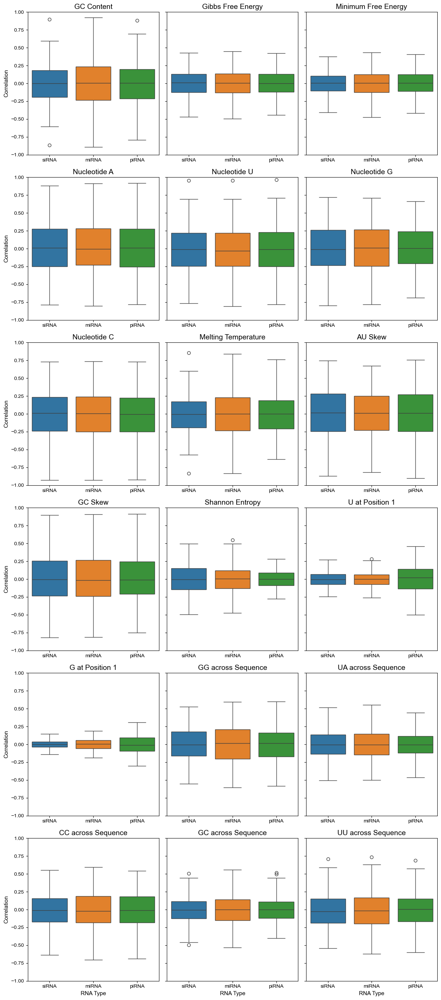

In [ ]:
# Boxplot distribution of Correlation 
df_to_use = comb_df_23[comb_df_23['Base Feature'].str.contains('RNA')]
df_to_use['RNA Type'] = df_to_use['Base Feature'].apply(lambda x: x.split(' ')[0])
df_to_use['Interpretable Features'] = df_to_use['Base Feature'].apply(lambda x: ' '.join(x.split(' ')[1:]))
df_to_use = df_to_use.melt(id_vars=['Interpretable Features', 'RNA Type'], value_vars=[x for x in df_to_use.columns if type(x) == int], var_name='Embeddings', value_name='Correlation')

fig, axs = plt.subplots(6, 3, figsize = (12, 27))
for i, (ax, col) in enumerate(zip(axs.flatten(), df_to_use['Interpretable Features'].unique())):
    subset = df_to_use[df_to_use['Interpretable Features'] == col]
    subset = subset.sort_values(by=['RNA Type'], key=lambda x: x.map({'miRNA': 2, 'siRNA': 1, 'piRNA': 3}))
    sns.boxplot(data=subset, x='RNA Type', y='Correlation', ax=ax, hue='RNA Type', order=['siRNA', 'miRNA', 'piRNA'])
    ax.set_ylim(-1, 1)
    ax.set_title(col)
    if i % 3 > 0:
        ax.set_ylabel('')
        ax.set_yticklabels('')
    if i < 15:
        ax.set_xlabel('')

plt.tight_layout()
# plt.savefig('./data_23k_pearson_correlation_boxplot_fix.png',dpi=300)
# plt.savefig('./data_23k_pearson_correlation_boxplot_fix.svg',dpi=600)

['#4c72b0', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#ccb974', '#64b5cd', '#4c72b0', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#ccb974', '#64b5cd']
Bbox(x0=0.11753083043981483, y0=0.14973611111111107, x1=0.9896833043981481, y1=0.8039686111111111)


/opt/anaconda3/envs/mirna/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/mirna/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Bbox(x0=0.020312500000000004, y0=0.82, x1=0.060312500000000005, y1=0.8999999999999999)


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/3383710844.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.ax_cbar.set_yticklabels([x.get_text() for x in g.ax_cbar.get_yticklabels()], fontsize=12)


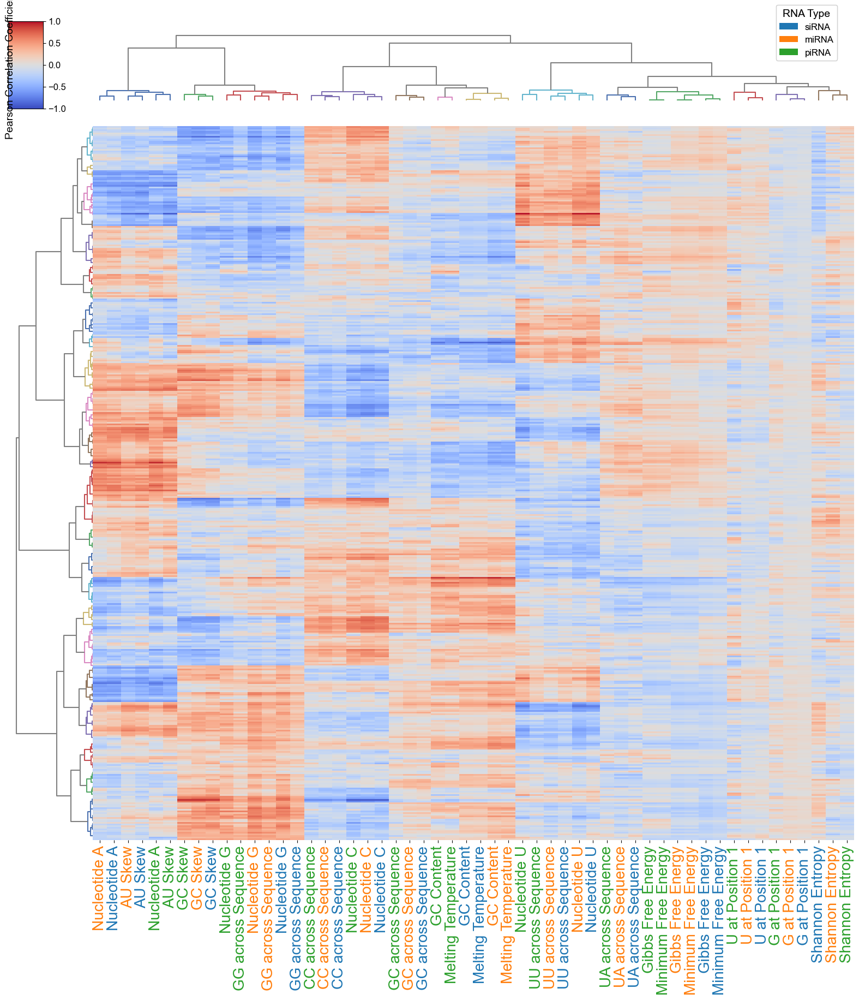

In [ ]:
df_to_use = comb_df_23
data = df_to_use[~df_to_use['Base Feature'].str.startswith('AllTypes')]

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "legend.title_fontsize": 11
})


pal = sns.color_palette('deep',20)
hex_colors = list(pal.as_hex())
hex_colors = [x for x in hex_colors if x != '#dd8452']
hex_colors = [x for x in hex_colors if x != '#8c8c8c']
print(hex_colors)
hierarchy.set_link_color_palette(hex_colors)

# Plot
g = sns.clustermap(data[data.columns[1:]].T, cmap="coolwarm", xticklabels=[(' ').join(x[0:]) for x in data['Base Feature'].str.split(' ')], figsize=(16,20), dendrogram_ratio=0.1, yticklabels=False, metric='euclidean', method='ward', vmin=-1, vmax=1)

g.ax_cbar.set_ylim((-1,1))

x_labels = [item.get_text() for item in g.ax_heatmap.get_xticklabels()]

for i in range(0, len(g.ax_heatmap.get_xticklabels())):
    if g.ax_heatmap.get_xticklabels()[i].get_text().startswith('siRNA'):
        g.ax_heatmap.get_xticklabels()[i].set_color('tab:blue')
        g.ax_heatmap.get_xticklabels()[i].set_fontsize(20)
        x_labels[i] = (' ').join(g.ax_heatmap.get_xticklabels()[i].get_text().split(' ')[1:])
    elif g.ax_heatmap.get_xticklabels()[i].get_text().startswith('miRNA'):
        g.ax_heatmap.get_xticklabels()[i].set_color('tab:orange')
        g.ax_heatmap.get_xticklabels()[i].set_fontsize(20)
        x_labels[i] = (' ').join(g.ax_heatmap.get_xticklabels()[i].get_text().split(' ')[1:])
    elif g.ax_heatmap.get_xticklabels()[i].get_text().startswith('piRNA'):
        g.ax_heatmap.get_xticklabels()[i].set_color('tab:green')
        g.ax_heatmap.get_xticklabels()[i].set_fontsize(20)
        x_labels[i] = (' ').join(g.ax_heatmap.get_xticklabels()[i].get_text().split(' ')[1:])

g.ax_heatmap.set_xticklabels(x_labels)

plt.tight_layout()

lut2 = dict(zip(['siRNA', 'miRNA', 'piRNA'], ['tab:blue','tab:orange','tab:green']))
lut2 = OrderedDict(lut2)
lut2 = {k : lut2[k] for k in ['siRNA', 'miRNA', 'piRNA']}

hm_pos = g.ax_heatmap.get_position()
print(hm_pos)

handles2 = [Patch(facecolor=lut2[name]) for name in lut2]
legend2 = plt.legend(handles2, lut2, ncol=1, loc=(22,0.55), fontsize=12, title_fontsize=14, title='RNA Type')
plt.gca().add_artist(legend2)

row_den = hierarchy.dendrogram(g.dendrogram_row.linkage,distance_sort=True, above_threshold_color= 'gray', color_threshold=3.9,ax=g.ax_row_dendrogram, orientation='left')

col_den = hierarchy.dendrogram(g.dendrogram_col.linkage,distance_sort=True, above_threshold_color= 'gray', color_threshold=5,ax=g.ax_col_dendrogram, orientation='top')

rd_pos = g.ax_row_dendrogram.get_position()
cd_pos = g.ax_col_dendrogram.get_position()
g.ax_row_dendrogram.set_position([rd_pos.x0+0.015, rd_pos.y0, rd_pos.width, rd_pos.height]) # -0.015, rd_pos.y0, rd_pos.width, rd_pos.height]) 
g.ax_col_dendrogram.set_position([cd_pos.x0, cd_pos.y0*0.9, cd_pos.width, cd_pos.height*0.86])  # [x, y, width, height]

cmap_pos = g.ax_cbar.get_position()
g.ax_cbar.set_position((rd_pos.x0+0.01, 0.82, 0.04, 0.08))
g.ax_cbar.set_yticklabels([x.get_text() for x in g.ax_cbar.get_yticklabels()], fontsize=12)
g.ax_cbar.set_ylabel('Pearson Correlation Coefficient', loc='center',labelpad=-80, fontsize=14)
print(g.ax_cbar.get_position())
for spine in g.ax_cbar.spines.values():
    spine.set_visible(True)

# plt.savefig('./clustermap_pcc_alloligo_23k_top20_individual_comb_pub_wopal_final_23k_antisense_fix.png',dpi=300)
# plt.savefig('./clustermap_pcc_alloligo_23k_top20_individual_comb_pub_wopal_final_large_23k_antisense_fix.svg',dpi=600)
plt.show()

['#4c72b0', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#ccb974', '#64b5cd', '#4c72b0', '#55a868', '#c44e52', '#8172b3', '#937860', '#da8bc3', '#ccb974', '#64b5cd']
Bbox(x0=0.035, y0=0.9, x1=0.07500000000000001, y1=0.98)


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/1730783985.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.ax_cbar.set_yticklabels([x.get_text() for x in g.ax_cbar.get_yticklabels()], fontsize=12)


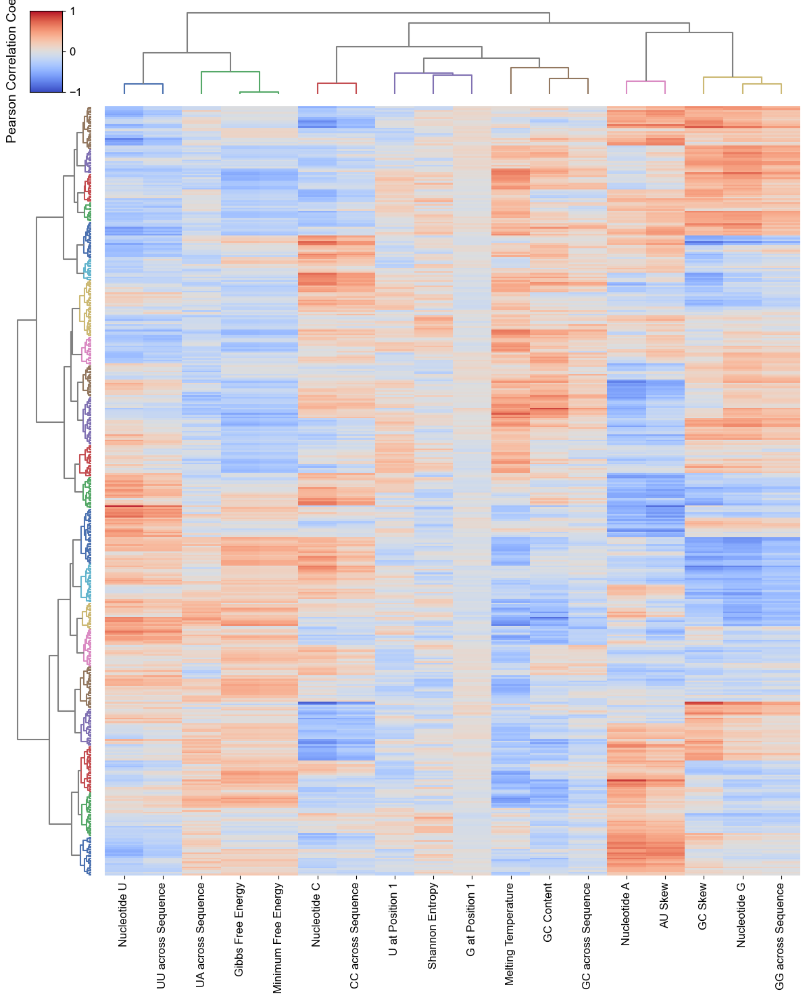

In [ ]:
# Irrespective only
data = comb_df_23[comb_df_23['Base Feature'].str.startswith('AllTypes')]
data = data.replace({'AllTypes u @ pos1': 'AllTypes U at Position 1','AllTypes g @ pos1': 'AllTypes G at Position 1','AllTypes gg @ all': 'AllTypes GG across Sequence','AllTypes ua @ all': 'AllTypes UA across Sequence','AllTypes cc @ all': 'AllTypes CC across Sequence','AllTypes gc @ all': 'AllTypes GC across Sequence','AllTypes uu @ all': 'AllTypes UU across Sequence'})

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 12,
    "axes.titlesize": 15,
    "axes.labelsize": 11,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 11,
    "legend.title_fontsize": 12
})

pal = sns.color_palette('deep',20)
hex_colors = list(pal.as_hex())
hex_colors = [x for x in hex_colors if x != '#dd8452']
hex_colors = [x for x in hex_colors if x != '#8c8c8c']
print(hex_colors)
hierarchy.set_link_color_palette(hex_colors)

# Plot
g = sns.clustermap(data[data.columns[1:]].T, cmap="coolwarm", metric='euclidean', method='ward', xticklabels=[(' ').join(x[1:]) for x in data['Base Feature'].str.split(' ')], yticklabels=False,figsize=(12,15), dendrogram_ratio=0.1,cbar_pos=(0.06, 0.91, 0.03, 0.08), vmin=-1, vmax=1)

plt.tight_layout()

hm_pos = g.ax_heatmap.get_position()

row_den = hierarchy.dendrogram(g.dendrogram_row.linkage,distance_sort=True, above_threshold_color= 'gray', color_threshold=2.75,ax=g.ax_row_dendrogram, orientation='left')
col_den = hierarchy.dendrogram(g.dendrogram_col.linkage,distance_sort=True, above_threshold_color= 'gray', color_threshold=5.75,ax=g.ax_col_dendrogram, orientation='top')

rd_pos = g.ax_row_dendrogram.get_position()
cd_pos = g.ax_col_dendrogram.get_position()

cmap_pos = g.ax_cbar.get_position()
g.ax_cbar.set_position((rd_pos.x0+0.02, 0.90, 0.04, 0.08))
g.ax_cbar.set_yticklabels([x.get_text() for x in g.ax_cbar.get_yticklabels()], fontsize=12)
g.ax_cbar.set_ylabel('Pearson Correlation Coefficient', loc='center',labelpad=-80, fontsize=14)
print(g.ax_cbar.get_position())
for spine in g.ax_cbar.spines.values():
    spine.set_visible(True)

# plt.savefig('./clustermap_pcc_alloligo_23k_top20_irrespective_comb_pub_wopal_final_23k_antisense_fix.png',dpi=300)
# plt.savefig('./clustermap_pcc_alloligo_23k_top20_irrespective_comb_pub_wopal_final_23k_antisense_fix.svg',dpi=600)
plt.show()

### 4.2.4 KDE Comparison 

['u1', 'g1', 'ggall', 'uaall', 'ccall', 'gcall', 'uuall']


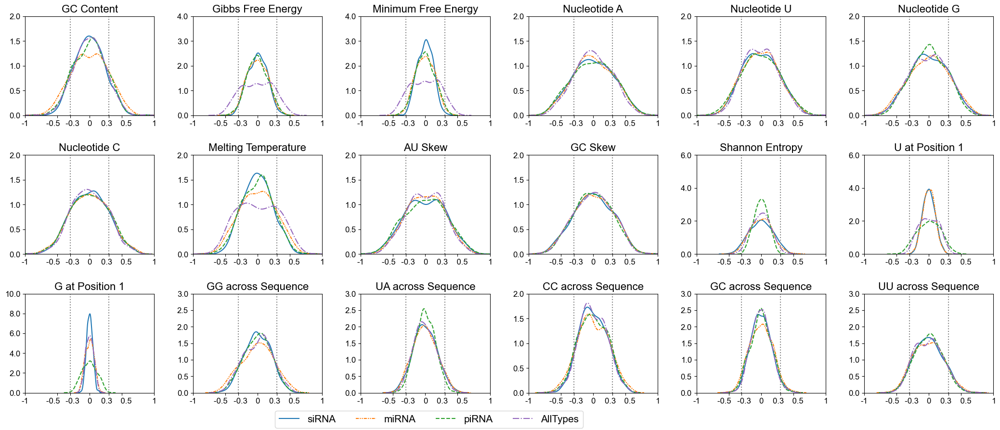

In [ ]:
# Plot the distribution of the correlated values, RNA-type Specific
labels = ['GC Content', 'Gibbs Free Energy', 'Minimum Free Energy','Nucleotide A','Nucleotide U','Nucleotide G','Nucleotide C',  'Melting Temperature', 'AU Skew', 'GC Skew', 'Shannon Entropy', 'U at Position 1','G at Position 1',  'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']

temp_key = list(all_emb_td_dict_23.keys())
print(temp_key)

# PCC 
corr_23 = [gc_corr_23, gfe_corr_23, mfe_corr_23, a_corr_23, u_corr_23, g_corr_23, c_corr_23, tm_corr_23, au_skew_corr_23,gc_skew_corr_23, shannon_corr_23, u1_corr_23, g1_corr_23, ggall_corr_23, uaall_corr_23, ccall_corr_23, gcall_corr_23, uuall_corr_23] 

all_emb_corr_23 = [all_emb_gc_corr_23, all_emb_gfe_corr_23, all_emb_mfe_corr_23,all_emb_a_corr_23, all_emb_u_corr_23, all_emb_g_corr_23,all_emb_c_corr_23,all_emb_tm_corr_23, all_emb_auskew_corr_23, all_emb_gcskew_corr_23, all_emb_shannon_corr_23] + [[y for y in all_emb_td_dict_23[x]] for x in temp_key] 

fig, axs = plt.subplots(3,6, figsize=(21, 9))

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 15,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 15,
    "legend.title_fontsize": 16
})

yticks = []
for a in range(0, len(labels)):
    # Features used in Paper 
    if a in [1, 2]:
        yticks.append(np.arange(0, 4.1, 1))
    elif a in [0, 3, 4, 5, 7, 8, 6, 9, 15]:
        yticks.append(np.arange(0, 2.01, 0.5))
    elif a in [12]:
        yticks.append(np.arange(0, 10.1, 2))
    elif a in [11, 10]:
        yticks.append(np.arange(0, 6.1, 2))
    elif a in [13, 14, 16, 17]:
        yticks.append(np.arange(0, 3.1, 0.5))


for id, ax in enumerate(axs.flatten().tolist()[:len(labels)]):
    sns.kdeplot(corr_23[id][640:640*2], ax=ax, label="siRNA", color='tab:blue')
    sns.kdeplot(corr_23[id][:640], ax=ax, label="miRNA", color='tab:orange', linestyle=(0, (3, 1, 1, 1, 1, 1)))
    sns.kdeplot(corr_23[id][640*2:], ax=ax, label="piRNA", color='tab:green', linestyle='--')
    sns.kdeplot(all_emb_corr_23[id], ax=ax, label="AllTypes", color='tab:purple', linestyle='-.')
    ax.set_title(labels[id])
    ax.set_xticks([-1, -0.5, -0.3, 0, 0.3, 0.5, 1], [-1, '-0.5    ', '  -0.3', 0, '0.3  ', '    0.5', 1])
    ax.set_xlim([-1, 1])
    ax.set_yticks(yticks[id], yticks[id])
    ax.set_ylim([min(yticks[id]), max(yticks[id])])
    ax.set_ylabel('') #original is 'Density'
    ax.axvline(0.3, color='gray',  linestyle=':')
    ax.axvline(-0.3, color='gray',  linestyle=':')

handles, labels = axs.flatten().tolist()[0].get_legend_handles_labels()
fig.legend(handles=handles[0:9], loc=(0.275,0.005), ncol=4) #loc=(0.855,0.035)
fig.tight_layout()
plt.subplots_adjust(bottom=0.08, wspace=0.3, hspace=0.4)
# plt.savefig('./hist_pcc_3k_individual_pub_supp_4_new_edited_3k_antisense_final.png', dpi=300)
# plt.savefig('./hist_pcc_3k_individual_pub_supp_4_new_edited_large_test_3k_antisense_final.svg', dpi=600)
plt.show()

### 4.2.5 Correlation of Correlation

In [114]:
# To evaluate how similar is Data-23K to Data-Whole and Data-3K
labels = ['GC Content', 'Gibbs Free Energy', 'Minimum Free Energy','Nucleotide A','Nucleotide U','Nucleotide G','Nucleotide C','Melting Temperature', 'AU Skew', 'GC Skew', 'Shannon Entropy', 'U at Position 1','G at Position 1',  'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']

corr_df = pd.DataFrame(index=np.arange(0, len(labels)*3), columns=['Interpretable Features', 'Datasets','PCC', 'P-Value (PCC)']) #18*3

In [ ]:
# To load previously computed embeddings, these files can be found in: RNAExplorer/portal/data/embeddings/
db1 = pd.read_csv('database.part01.csv')
db2 = pd.read_csv('database.part02.csv')
db = pd.concat([db1, db2]).reset_index(drop=True)

sirna_db = db[db['RNA Type'] == 'siRNA'].reset_index()
mirna_db = db[db['RNA Type'] == 'miRNA'].reset_index()
pirna_db = db[db['RNA Type'] == 'piRNA'].reset_index()

sirna_db = sirna_db[['index', 'Sequence']].set_index('Sequence')
mirna_db = mirna_db[['index', 'Sequence']].set_index('Sequence')
pirna_db = pirna_db[['index', 'Sequence']].set_index('Sequence')

ls = []
for i in range(1,8):
    emb = np.load(f'refs_embeddings.part0{i}.npy')
    ls.append(emb)
embs = np.concat(ls)

# To use the dataset used in the paper, use these files on RNAExplorer/Notebooks/Data/ on github
# Data-Whole
sirna = pd.read_csv('interp_features_siRNA_whole.csv')
mirna = pd.read_csv('interp_features_miRNA_whole.csv')
pirna = pd.read_csv('interp_features_piRNA_whole.csv')
sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# To load previously computed embeddings
sirna_emb = embs[list(sirna_db.loc[[x[-1] for x in sirna_data], :]['index']), :]
mirna_emb = embs[list(mirna_db.loc[[x[-1] for x in mirna_data], :]['index']), :]
pirna_emb = embs[list(pirna_db.loc[[x[-1] for x in pirna_data], :]['index']), :]

# Sanity check 
m = Featurizer(mirna_data[:10], chunk_size=20)
p = Featurizer(pirna_data[:10], chunk_size=20)
assert (m == mirna_emb[:10]).all()
assert (p == pirna_emb[:10]).all()

corr_whole = []
for col in ['gc_content', 'gibbs_free_energy', 'minimum_free_energy', 'a_content', 'u_content', 'g_content', 'c_content', 'melting_temp', 'au_skew', 'gc_skew', 'shannon_entropy', 'U_1', 'G_1', 'GG_all', 'UA_all', 'CC_all', 'GC_all', 'UU_all']:
    x = list(mirna[col].values) +  list(sirna[col].values) +  list(pirna[col].values)
    _, ls = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], x, 'Pearson')
    corr_whole.append(ls)


# Data-3K
sirna = pd.read_csv('interp_features_siRNA_3k.csv')
mirna = pd.read_csv('interp_features_miRNA_3k.csv')
pirna = pd.read_csv('interp_features_piRNA_3k.csv')
sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# To load previously computed embeddings
sirna_emb = embs[list(sirna_db.loc[[x[-1] for x in sirna_data], :]['index']), :]
mirna_emb = embs[list(mirna_db.loc[[x[-1] for x in mirna_data], :]['index']), :]
pirna_emb = embs[list(pirna_db.loc[[x[-1] for x in pirna_data], :]['index']), :]

# Sanity check 
m = Featurizer(mirna_data[:10], chunk_size=20)
p = Featurizer(pirna_data[:10], chunk_size=20)
assert (m == mirna_emb[:10]).all()
assert (p == pirna_emb[:10]).all()

corr_3 = []
for col in ['gc_content', 'gibbs_free_energy', 'minimum_free_energy', 'a_content', 'u_content', 'g_content', 'c_content', 'melting_temp', 'au_skew', 'gc_skew', 'shannon_entropy', 'U_1', 'G_1', 'GG_all', 'UA_all', 'CC_all', 'GC_all', 'UU_all']:
    x = list(mirna[col].values) +  list(sirna[col].values) +  list(pirna[col].values)
    _, ls = gen_corr_feat([mirna_emb, sirna_emb, pirna_emb], x, 'Pearson')
    corr_3.append(ls)

0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (30721, 640)
1 (74678, 640)
2 (23116, 640)
1920 1920
0 (2632, 6

In [96]:
corr_23 = [gc_corr_23, gfe_corr_23, mfe_corr_23, a_corr_23, u_corr_23, g_corr_23, c_corr_23, tm_corr_23, au_skew_corr_23,gc_skew_corr_23, shannon_corr_23, u1_corr_23,  g1_corr_23, ggall_corr_23, uaall_corr_23, ccall_corr_23, gcall_corr_23, uuall_corr_23] 

In [115]:
for z in range(len(labels)):
    corr_df.loc[z] = [labels[z], 'Data-Whole vs. Data-23K', pearsonr(corr_whole[z],corr_23[z])[0], pearsonr(corr_whole[z],corr_23[z])[1]] #'Data-Whole vs. Data-23K'
    corr_df.loc[z+18] = [labels[z], 'Data-Whole vs. Data-3K', pearsonr(corr_whole[z], corr_3[z])[0], pearsonr(corr_whole[z], corr_3[z])[1]]
    corr_df.loc[z+18*2] = [labels[z], 'Data-3K vs. Data-23K', pearsonr(corr_3[z], corr_23[z])[0], pearsonr(corr_3[z], corr_23[z])[1]] #'Data-3K vs. Data-23K'

In [ ]:
corr_df = corr_df.set_index(['Interpretable Features'])
corr_df = corr_df.loc[labels]
corr_df = corr_df.reset_index()
for x in corr_df.columns[2:]:
    corr_df[x] = np.float64(corr_df[x])

# corr_df.to_csv('./pcc_df_all.csv')
corr_df

,Interpretable Features,Datasets,PCC,P-Value (PCC)
0,GC Content,Data-Whole vs. Data-23K,0.999913,0.0
1,GC Content,Data-Whole vs. Data-3K,0.980406,0.0
2,GC Content,Data-3K vs. Data-23K,0.979987,0.0
3,Gibbs Free Energy,Data-Whole vs. Data-23K,0.999783,0.0
4,Gibbs Free Energy,Data-Whole vs. Data-3K,0.981575,0.0
5,Gibbs Free Energy,Data-3K vs. Data-23K,0.980435,0.0
6,Minimum Free Energy,Data-Whole vs. Data-23K,0.999712,0.0
7,Minimum Free Energy,Data-Whole vs. Data-3K,0.979420,0.0
8,Minimum Free Energy,Data-3K vs. Data-23K,0.977706,0.0
9,Nucleotide A,Data-Whole vs. Data-23K,0.999935,0.0


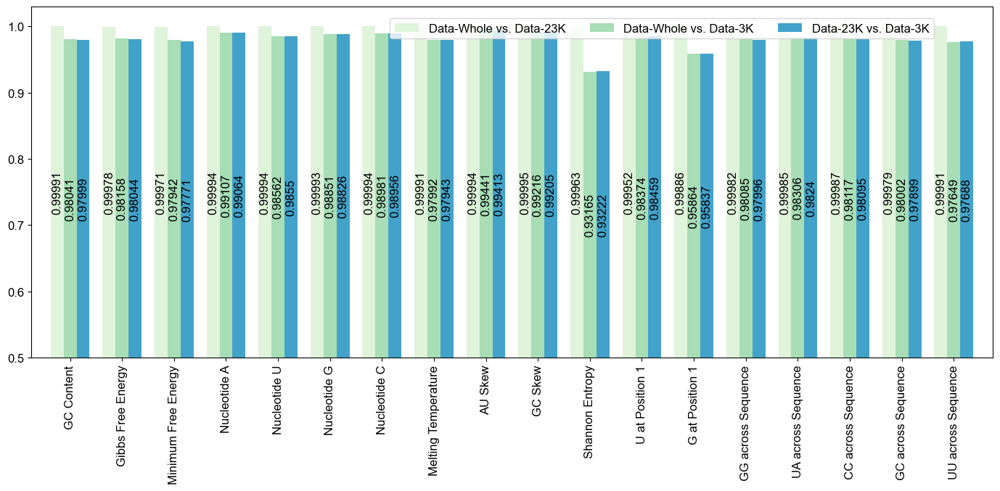

In [ ]:
# Bar Chart to show the correlation of correlation 
labels = ['GC Content', 'Gibbs Free Energy', 'Minimum Free Energy','Nucleotide A','Nucleotide U','Nucleotide G','Nucleotide C',  'Melting Temperature', 'AU Skew', 'GC Skew', 'Shannon Entropy', 'U at Position 1','G at Position 1', 'GG across Sequence', 'UA across Sequence', 'CC across Sequence', 'GC across Sequence', 'UU across Sequence']

# cmap = plt.get_cmap("Set1")
# colors = [cmap(i/9) for i in range(9)]
colors = ['#e0f3db', '#a8ddb5', '#43a2ca']

fig, ax = plt.subplots(1,1, figsize=(14,7))

for id in range(len(labels)):
    p = ax.bar(id+0.25*-1, pd.to_numeric(corr_df['PCC'][id*3]).round(5), color=colors[0], label='Data-Whole vs. Data-23K', width=0.25)
    p1 = ax.bar(id+0.25*0, pd.to_numeric(corr_df['PCC'][id*3+1]).round(5), color=colors[1], label='Data-Whole vs. Data-3K', width=0.25)
    p2 = ax.bar(id+0.25*1, pd.to_numeric(corr_df['PCC'][id*3+2]).round(5), color=colors[2],label='Data-23K vs. Data-3K', width=0.25)
    ax.bar_label(p, label_type='center',color='black',fontsize=12, rotation=90)
    ax.bar_label(p1, label_type='center', color='black',fontsize=12, rotation=90)
    ax.bar_label(p2, label_type='center', color='black',fontsize=12, rotation=90)
    # ax.set_title(labels[id])
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)
ax.set_ylim(0.5, 1.03)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels([corr_df['Interpretable Features'][i*3] for i in range(18)])


plt.xlim(-0.75,len(corr_df[0:18])-0.25)
# fig.suptitle("PCC of Each RNA Type and Dataset", fontsize=18)
handles, labels = ax.get_legend_handles_labels()
plt.subplots_adjust(top=0.94)
fig.legend(handles=[handles[0],handles[10],handles[29]],labels=[labels[0],labels[10],labels[29]],loc=(0.39,0.92),ncols=3,fontsize=12)
fig.tight_layout()

# plt.savefig('./pcc_of_pcc_bar_wopal_edited.png', dpi=300)
# plt.savefig('./pcc_of_pcc_bar_wopal_edited.svg', dpi=600)
plt.show()

# 5. Predictive Utility 

## 5.1 RNA Type Classification

In [122]:
ablation_study = {}
final_performance = {}

# Load RNA-FM features
X_emb = np.concat([sirna_emb, mirna_emb, pirna_emb])
print(X_emb.shape)

# Load interpretable features
interpretable_columns = ['gc_content', 'gibbs_free_energy', 'minimum_free_energy','a_content', 'u_content', 'g_content', 'c_content', 'melting_temp', 'au_skew', 'gc_skew', 'shannon_entropy', 'U_1', 'G_1','GG_all', 'UA_all', 'CC_all', 'GC_all', 'UU_all']
X_bio = np.concat([sirna[interpretable_columns].values, mirna[interpretable_columns].values,pirna[interpretable_columns].values])
print(X_bio.shape)

# Load combined features 
X_comb = np.concat([X_bio,X_emb],axis=-1)
print(X_comb.shape)

y = ['sirna'] * len(sirna) + ['mirna'] * len(mirna) + ['pirna'] * len(pirna)

y = pd.Series(y).map({'sirna': 0, 'mirna': 1, 'pirna': 2})
y = np.array(y)

# Create held-out dataset
X_trainval_ind, X_test_ind, y_trainval, y_test = train_test_split(
    range(len(y)), y,
    test_size=0.20,          
    stratify=y,  
    random_state=42,
)

feature_sets = {
    'deep_learning_features_only': X_emb,
    'interpretable_features_only': X_bio,
    'combined': X_comb
}

method = 'SVM'
for feature_type, X in feature_sets.items():
    
    print(f'{feature_type}')
    X_trainval = X[X_trainval_ind]
    X_test = X[X_test_ind]

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    results = {'accuracy' : [], 
            'macro_f1_score': [], 
            'f1_score_per_class': [], 
            'confusion_matrix': [],
            'precision': [],
            'recall': [],
            'precision_per_class': [],
            'recall_per_class': []}

    splits = list(cv.split(X_trainval, y_trainval))

    for i, (train, val) in enumerate(splits):

        model = LinearSVC( random_state=42) # default parameters 

        X_train, y_train = X_trainval[train], y_trainval[train]
        X_val, y_val = X_trainval[val], y_trainval[val]

        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)  
        X_val = scaler.transform(X_val)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)

        results['accuracy'].append(accuracy_score(y_val, y_pred))
        results['macro_f1_score'].append(f1_score(y_val, y_pred, average='macro'))
        results['f1_score_per_class'].append(f1_score(y_val, y_pred, average=None))
        results['confusion_matrix'].append(confusion_matrix(y_val, y_pred))
        results['precision'].append(precision_score(y_val, y_pred, average='macro'))
        results['precision_per_class'].append(precision_score(y_val, y_pred, average=None))
        results['recall'].append(recall_score(y_val, y_pred, average='macro'))
        results['recall_per_class'].append(recall_score(y_val, y_pred, average=None))

    ablation_study[f'{method}_{feature_type}'] = results

    # Evaluate against held-out 
    test_results = {'accuracy' : [], 
    'macro_f1_score': [], 
    'f1_score_per_class': [], 
    'confusion_matrix': [],
    'precision': [],
    'recall': [],
    'precision_per_class': [],
    'recall_per_class': []} 

    scaler = StandardScaler()
    X_trainval = scaler.fit_transform(X_trainval)  
    X_test = scaler.transform(X_test)

    model = LinearSVC( random_state=42) # default parameters 

    model.fit(X_trainval, y_trainval)
    y_pred = model.predict(X_test)

    test_results['accuracy'].append(accuracy_score(y_test, y_pred))
    test_results['macro_f1_score'].append(f1_score(y_test, y_pred, average='macro'))
    test_results['f1_score_per_class'].append(f1_score(y_test, y_pred, average=None))
    test_results['confusion_matrix'].append(confusion_matrix(y_test, y_pred))
    test_results['precision'].append(precision_score(y_test, y_pred, average='macro'))
    test_results['precision_per_class'].append(precision_score(y_test, y_pred, average=None))
    test_results['recall'].append(recall_score(y_test, y_pred, average='macro'))
    test_results['recall_per_class'].append(recall_score(y_test, y_pred, average=None))
    
    final_performance[f'{method}_{feature_type}'] = test_results

(69348, 640)
(69348, 18)
(69348, 658)
deep_learning_features_only
interpretable_features_only
combined


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/4159562990.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


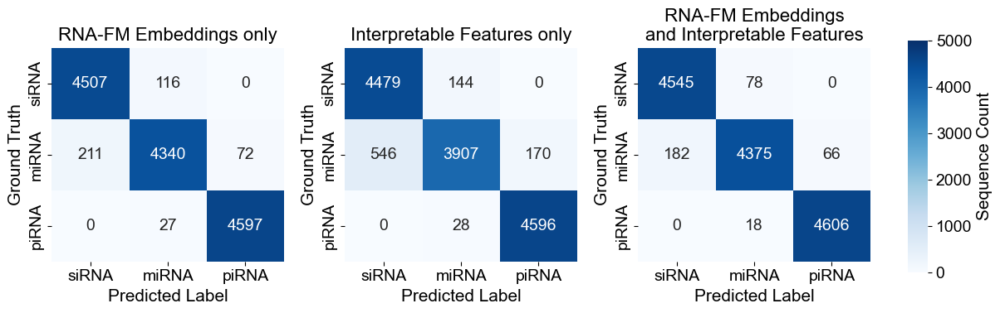

In [ ]:
# Performance across all 
# Plot confusion matrix and the rest will be in a table 
final_df = pd.DataFrame(final_performance)

# Rename for clarity 
rename_dict = {'accuracy': 'Accuracy', 'macro_f1_score': 'F1 score', 'precision': 'Precision', 'recall': 'Recall', 'RF': 'Random Forest', 'SVM': 'Support Vector Machine', 'deep': 'RNA-FM Embeddings only', 'interpretable': 'Interpretable Features only', 'combined': 'RNA-FM Embeddings\nand Interpretable Features', 'f1_score_per_class': 'F1 score', 'precision_per_class': 'Precision', 'recall_per_class': 'Recall', 0:'siRNA', 1: 'miRNA', 2:'piRNA'}

final_df = final_df[[x for x in final_df.columns if 'SVM' in x]].T

final_df = final_df.reset_index()
# final_df['Algorithms'] = final_df['index'].apply(lambda x: x.split('_')[0])
final_df['Features'] = final_df['index'].apply(lambda x: x.split('_')[1])
# final_df['Algorithms'] = final_df['Algorithms'].map(rename_dict)
final_df['Features'] = final_df['Features'].map(rename_dict)
final_df['Methods'] =  final_df['Features']
final_df = final_df.set_index('Methods')

fig, axs = plt.subplots(1, 3, figsize=(12,4))
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7]) 
for i, (ax, index) in enumerate(zip(axs.flatten(), final_df.index)):
    sns.heatmap(final_df.at[index, 'confusion_matrix'][0],ax=ax,annot=True,cmap='Blues',fmt='d', cbar_kws={'shrink': 0.3, 'ticks':list(range(0, 5001, 1000)), 'label': 'Sequence Count'}, vmin=0, vmax=5000, cbar_ax=None if i else cbar_ax, cbar=(i == 0))
    ax.set_title(index)
    ax.set_xlabel('Predicted Label')
    ax.set_xticklabels([rename_dict[int(x.get_text())] for x in ax.get_xticklabels()])
    ax.set_yticklabels([rename_dict[int(x.get_text())] for x in ax.get_yticklabels()])
    ax.set_ylabel('Ground Truth')
plt.tight_layout(rect=[0, 0, 0.9, 1])
# plt.savefig('./RNA_Type_Classification_LinearSVC_5CV_Ablation_Confusion_Matrix_Final_23k_fix.png')
# plt.savefig('./RNA_Type_Classification_LinearSVC_5CV_Ablation_Confusion_Matrix_Final_23k_fix.svg')
plt.show()

In [133]:
# Final Performance averaged 
final_df[['accuracy', 'macro_f1_score', 'precision', 'recall']].explode(['accuracy', 'macro_f1_score', 'precision', 'recall']) 

,accuracy,macro_f1_score,precision,recall
Methods,,,,
RNA-FM Embeddings only,0.969286,0.969186,0.96932,0.969284
Interpretable Features only,0.935977,0.935117,0.937836,0.935973
RNA-FM Embeddings\nand Interpretable Features,0.975198,0.97511,0.9753,0.975197


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/724378504.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x.get_text() for x in ax.get_xticklabels()], rotation=0)
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/724378504.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x.get_text() for x in ax.get_xticklabels()], rotation=0)
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/724378504.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([x.get_text() for x in ax.get_xticklabels()], rotation=0)


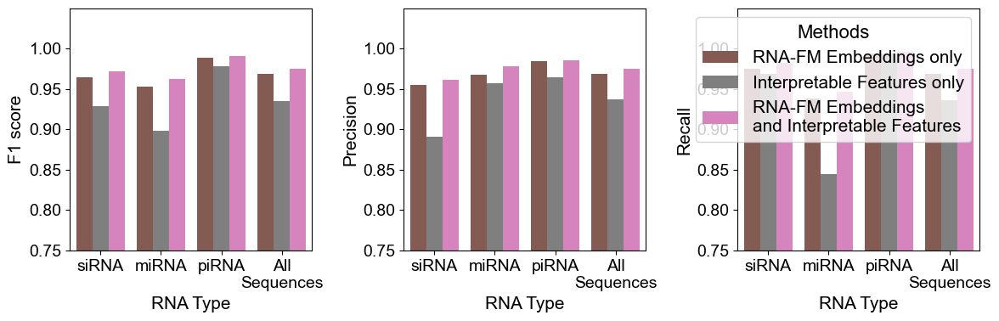

In [ ]:
# Final Performance per class
final_per_class = final_df[[x for x in final_df.columns if 'per_class' in x]].explode([x for x in final_df.columns if 'per_class' in x]).explode([x for x in final_df.columns if 'per_class' in x]).reset_index()
final_per_class['RNA Type'] = final_per_class.groupby(['Methods']).cumcount()
final_per_class = final_per_class.sort_values(by=['RNA Type'])
final_per_class['RNA Type'] = final_per_class['RNA Type'].map(rename_dict)
final_per_class = final_per_class.explode([x for x in final_df.columns if 'per_class' in x])
for ix, i in enumerate(final_df.index):
    final_per_class = pd.concat([final_per_class, pd.DataFrame(dict(zip(final_per_class.columns, [i, final_df.at[i, 'macro_f1_score'][0], final_df.at[i, 'precision'][0], final_df.at[i, 'recall'][0], 'Macro-average'])), index=[0])])
final_per_class = final_per_class.reset_index(drop=True)
final_per_class['RNA Type'] = final_per_class['RNA Type'].replace('Macro-average', 'All\nSequences')

rename_dict.update({'f1_score_per_class': 'F1 score', 'precision_per_class': 'Precision', 'recall_per_class':'Recall'})

# Plot overall performance 
fig, axs = plt.subplots(1,3, figsize=(12, 4))
for i, (ax, val) in enumerate(zip(axs.flatten(), final_per_class.columns[1:-1])): 
    show_legend=True if i == 2 else False
    sns.barplot(final_per_class, hue='Methods',  y=val, x='RNA Type', ax=ax, palette=['tab:brown', 'tab:gray', 'tab:pink'],legend=show_legend)
    ax.set_ylabel(rename_dict[val])
    ax.set_xticklabels([x.get_text() for x in ax.get_xticklabels()], rotation=0)
    ax.set_ylim(0.75, 1.049999)
    
plt.tight_layout()
# plt.savefig('./RNA_Type_Classification_LinearSVC_5CV_Ablation_Per_Class_Final_23k_Updated_fix.png')
# plt.savefig('./RNA_Type_Classification_LinearSVC_5CV_Ablation_Per_Class_Final_23k_Updated_fix.svg')
plt.show()

## 5.2 Interpretable Features Prediction

In [135]:
ablation_study = {}
final_performance = {} 

interpretable_columns = ['gc_content', 'gibbs_free_energy', 'minimum_free_energy','a_content', 'u_content', 'g_content', 'c_content', 'melting_temp', 'au_skew', 'gc_skew', 'shannon_entropy', 'U_1', 'G_1','GG_all', 'UA_all', 'CC_all', 'GC_all', 'UU_all']

# Load RNA-FM features
X = np.concat([sirna_emb, mirna_emb, pirna_emb])
print(X.shape)

for c in interpretable_columns: 

    y = np.concat([sirna[c], mirna[c], pirna[c]])

    if c in ['U_1', 'G_1']:
        X_trainval_ind, X_test_ind, y_trainval, y_test = train_test_split(
            range(len(y)), y,
            test_size=0.20,          
            stratify=y,  
            random_state=42,
        )

    else:
        # Create held-out dataset
        X_trainval_ind, X_test_ind, y_trainval, y_test = train_test_split(
            range(len(y)), y,
            test_size=0.20,          
            random_state=42,
        )

    for method in ['Linear']:
        print(X.shape)
        
        X_trainval = X[X_trainval_ind]
        X_test = X[X_test_ind]

        # Cross-Validation 
        if c in ['U_1', 'G_1']:
            cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        else:
            cv = KFold(n_splits=5, shuffle=True, random_state=42)

        results = {'r2_score': [], 'rmse': [], 'residuals': [], 'y_val': [], 'y_pred': [],  'accuracy': [], 'f1_score': [], 'auc': []}

        splits = list(cv.split(X_trainval, y_trainval))

        for i, (train, val) in enumerate(splits):

            if c in ['U_1', 'G_1']:
                model = LogisticRegression(max_iter=1000, class_weight='balanced')
            else:
                if method == 'Linear': 
                    model = LinearRegression()

            X_train, y_train = X_trainval[train], y_trainval[train]
            X_val, y_val = X_trainval[val], y_trainval[val]

            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)  
            X_val = scaler.transform(X_val)

            model.fit(X_train, y_train)
            y_pred = model.predict(X_val)

            if c in ['U_1', 'G_1']:
                y_pred_proba = model.predict_proba(X_val)[:, 1]

                results['r2_score'].append(np.nan)
                results['rmse'].append(np.nan)
                results['residuals'].append(np.nan)
                results['y_val'].append(y_val)
                results['y_pred'].append(y_pred)
                results['accuracy'].append(accuracy_score(y_val, y_pred))
                results['f1_score'].append(f1_score(y_val, y_pred))
                results['auc'].append(roc_auc_score(y_val, y_pred_proba))
                
            else:
                results['r2_score'].append(r2_score(y_val, y_pred))
                results['rmse'].append(np.sqrt(mean_squared_error(y_val, y_pred)))
                results['y_val'].append(y_val)
                results['y_pred'].append(y_pred)
                results['residuals'].append(y_val - y_pred)
                results['accuracy'].append(np.nan)
                results['f1_score'].append(np.nan)
                results['auc'].append(np.nan)

        ablation_study[f'{c}_{method}'] = results

        # Evaluate against held-out 
        test_results = {'r2_score': [], 'rmse': [], 'residuals':[], 'y_test':[], 'y_pred': [], 'accuracy': [], 'f1_score': [], 'auc': []}

        scaler = StandardScaler()
        X_trainval = scaler.fit_transform(X_trainval)  
        X_test = scaler.transform(X_test)

        if c in ['U_1', 'G_1']:
            model = LogisticRegression(max_iter=1000, class_weight='balanced')
        else:
            if method == 'Linear': 
                model = LinearRegression()
            elif method == 'Ridge':
                model = Ridge(alpha=1.0)

        model.fit(X_trainval, y_trainval)
        y_pred = model.predict(X_test)
        

        if c in ['U_1', 'G_1']:
            y_pred_proba = model.predict_proba(X_test)[:, 1]

            test_results['r2_score'].append(np.nan)
            test_results['rmse'].append(np.nan)
            test_results['residuals'].append(np.nan)
            test_results['y_test'].append(y_test)
            test_results['y_pred'].append(y_pred)
            test_results['accuracy'].append(accuracy_score(y_test, y_pred))
            test_results['f1_score'].append(f1_score(y_test, y_pred))
            test_results['auc'].append(roc_auc_score(y_test, y_pred_proba))
            
        else:
            test_results['r2_score'].append(r2_score(y_test, y_pred))
            test_results['rmse'].append(np.sqrt(mean_squared_error(y_test, y_pred)))
            test_results['residuals'].append(y_test - y_pred)
            test_results['y_test'].append(y_test)
            test_results['y_pred'].append(y_pred)
            test_results['accuracy'].append(np.nan)
            test_results['f1_score'].append(np.nan)
            test_results['auc'].append(np.nan)

        final_performance[f'{c}_{method}'] = test_results

(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)
(69348, 640)


In [ ]:
# Rename for clarity 
rename_dict = {'r2_score': f'R$^2$ Score', 'rmse': 'RMSE', 'Highly-Correlated Embeddings': 'Highly Correlated RNA-FM features', 'All RNA-FM Embeddings': 'All RNA-FM Embeddings', 'Random RNA-FM Embeddings':'Random RNA-FM Embeddings', 'Linear': 'Linear Regression', 'Ridge': 'Ridge Regression'}

rename_dict.update({'gibbs_free_energy': 'Gibbs Free Energy',
        'minimum_free_energy': 'Minimum Free Energy',
        'melting_temp': 'Melting Temperature',
        'shannon_entropy': 'Shannon Entropy',
        'gc_content': 'GC Content',
        'au_skew': 'AU Skew',
        'gc_skew': 'GC Skew',
        'a_content': 'Nucleotide A', 
        'c_content': 'Nucleotide C', 
        'g_content': 'Nucleotide G', 
        'u_content': 'Nucleotide U',
        'U_1': 'U at Position 1', 
        'G_1': 'G at Position 1', 
        'GG_all': 'GG across Sequence', 
        'UA_all': 'UA across Sequence', 
        'CC_all': 'CC across Sequence', 
        'GC_all': 'GC across Sequence', 
        'UU_all': 'UU across Sequence',
        'length': 'Length'})

ablation_performance = pd.DataFrame(ablation_study).T
ablation_overall = ablation_performance[['r2_score', 'rmse']].explode(['r2_score', 'rmse']).reset_index()
ablation_overall['Algorithms'] = ablation_overall['index'].apply(lambda x: x.split('_')[-1])
ablation_overall['Algorithms'] = ablation_overall['Algorithms'].map(rename_dict)
ablation_overall['Interpretable Features'] = ablation_overall['index'].apply(lambda x: rename_dict['_'.join(x.split('_')[:-1])])
ablation_overall= ablation_overall[ablation_overall['Algorithms'].str.contains('Linear')]
ablation_overall['Algorithms'].unique()

,index,r2_score,rmse,Algorithms,Interpretable Features
0,gc_content_Linear,0.989557,0.00997,Linear Regression,GC Content
1,gc_content_Linear,0.989448,0.010019,Linear Regression,GC Content
2,gc_content_Linear,0.989363,0.010095,Linear Regression,GC Content
3,gc_content_Linear,0.989501,0.009977,Linear Regression,GC Content
4,gc_content_Linear,0.989564,0.010027,Linear Regression,GC Content
...,...,...,...,...,...
85,UU_all_Linear,0.932879,0.017219,Linear Regression,UU across Sequence
86,UU_all_Linear,0.932492,0.017486,Linear Regression,UU across Sequence
87,UU_all_Linear,0.930841,0.017323,Linear Regression,UU across Sequence
88,UU_all_Linear,0.933832,0.017324,Linear Regression,UU across Sequence


/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2812831885.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f'{x.get_text()}' for x in ax.get_xticklabels()], rotation=90)
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2812831885.py:72: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(ax.get_yticklabels())


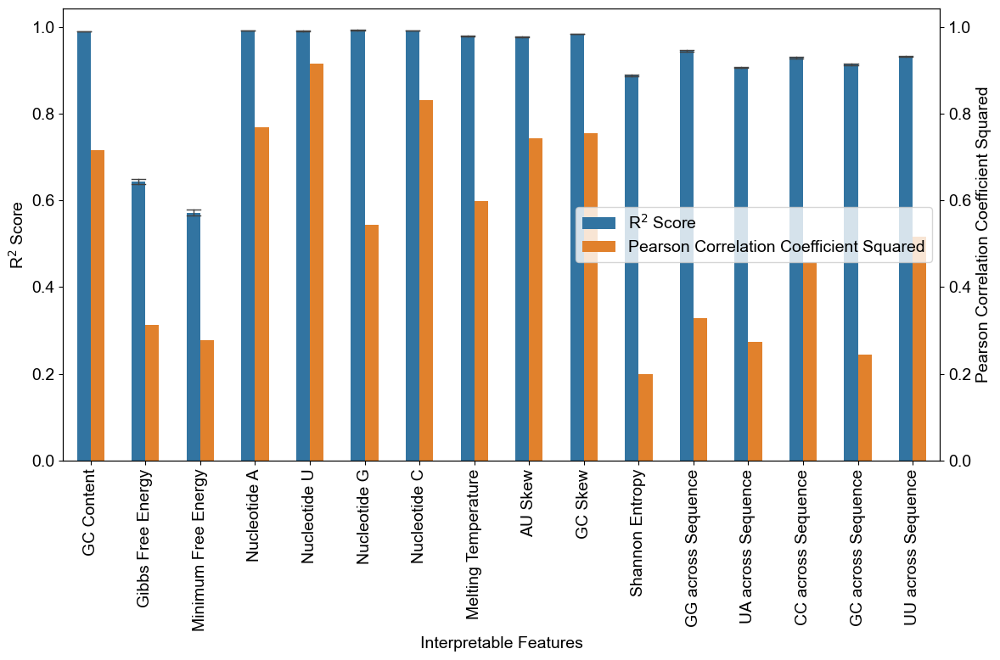

In [ ]:
# Rename for clarity 
rename_dict = {'r2_score': f'R$^2$ Score', 'rmse': 'RMSE', 'Highly-Correlated Embeddings': 'Highly Correlated RNA-FM features', 'All RNA-FM Embeddings': 'All RNA-FM Embeddings', 'Random RNA-FM Embeddings':'Random RNA-FM Embeddings', 'Linear': 'Linear Regression', 'Ridge': 'Ridge Regression'}

rename_dict.update({'gibbs_free_energy': 'Gibbs Free Energy',
        'minimum_free_energy': 'Minimum Free Energy',
        'melting_temp': 'Melting Temperature',
        'shannon_entropy': 'Shannon Entropy',
        'gc_content': 'GC Content',
        'au_skew': 'AU Skew',
        'gc_skew': 'GC Skew',
        'a_content': 'Nucleotide A', 
        'c_content': 'Nucleotide C', 
        'g_content': 'Nucleotide G', 
        'u_content': 'Nucleotide U',
        'U_1': 'U at Position 1', 
        'G_1': 'G at Position 1', 
        'GG_all': 'GG across Sequence', 
        'UA_all': 'UA across Sequence', 
        'CC_all': 'CC across Sequence', 
        'GC_all': 'GC across Sequence', 
        'UU_all': 'UU across Sequence',
        'length': 'Length'})

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 14,
    "axes.titlesize": 18,
    "axes.labelsize": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "legend.title_fontsize": 16
})

corr_ = pd.read_csv('pearsoncorr_misipirna_all_23k_antisense.csv',index_col=0) # this is from correlation between rna-fm embeddings with interpretable features regardless of rna types
highest_corr = {}
for c in ablation_overall['Interpretable Features'].unique():
    if abs(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[0, 4]) < abs(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[-1, 4]):
        highest_corr[c] = tuple(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[-1, 3:5])
    elif abs(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[0, 4]) >= abs(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[-1, 4]):
        highest_corr[c] = tuple(corr_[corr_['Interpretable Features'] == c].sort_values(by='Correlation').values[0, 3:5])

corr_ = pd.DataFrame(highest_corr).T
corr_[1] = corr_[1].apply(lambda x: abs(x)**2)
corr_ = corr_[[1]]
corr_ = corr_.reset_index().rename(columns={'index': 'Interpretable Features', 1: 'Pearson Correlation Coefficient Squared'})
corr_['Algorithms'] = 'Pearson Correlation Coefficient'

ablation_performance = pd.DataFrame(ablation_study).T
ablation_overall = ablation_performance[['r2_score', 'rmse']].explode(['r2_score', 'rmse']).reset_index()
ablation_overall['Algorithms'] = ablation_overall['index'].apply(lambda x: x.split('_')[-1])
ablation_overall['Algorithms'] = ablation_overall['Algorithms'].map(rename_dict)
ablation_overall['Interpretable Features'] = ablation_overall['index'].apply(lambda x: rename_dict['_'.join(x.split('_')[:-1])])
ablation_overall= ablation_overall[ablation_overall['Algorithms'].str.contains('Linear')]

plot_df = ablation_overall[['Interpretable Features', 'Algorithms', 'r2_score']]
plot_df = plot_df.melt(id_vars=['Interpretable Features', 'Algorithms'])
plot_df = pd.concat([plot_df, corr_.melt(id_vars=['Interpretable Features', 'Algorithms'])])
plot_df = plot_df.reset_index(drop=True)
plot_df = plot_df[~plot_df['Interpretable Features'].isin(['U at Position 1', 'G at Position 1'])]

fig, ax = plt.subplots(1,1, figsize=(12,8))
sns.barplot(plot_df, x='Interpretable Features', hue='variable', ax=ax, y='value',capsize=0.5, err_kws={'linewidth':1}, errorbar='sd', width=0.5)

ax2 = plt.twinx()
ax.set_xticklabels([f'{x.get_text()}' for x in ax.get_xticklabels()], rotation=90)
ax.set_ylabel(f'{rename_dict['r2_score']}')
ax2.set_ylim(ax.get_ylim())
ax2.set_yticklabels(ax.get_yticklabels())
ax2.set_ylabel('Pearson Correlation Coefficient Squared')
ax.legend(handles=ax.get_legend_handles_labels()[0], labels= [rename_dict[x] if x in rename_dict.keys() else x for x in ax.get_legend_handles_labels()[1]])
# ax.set_ylim(0.5, 1.09)
plt.tight_layout()
# plt.savefig('./All_Interpretable_Prediction_Regression.png')
# plt.savefig('./All_Interpretable_Prediction_Regression.svg')
plt.show()

In [ ]:
# Logistic Regression results
ablation_performance = pd.DataFrame(ablation_study).T
ablation_overall = ablation_performance.explode(['auc']).reset_index()
ablation_overall = ablation_overall.dropna()
ablation_overall['Algorithms'] = ablation_overall['index'].apply(lambda x: x.split('_')[-1])
ablation_overall['Algorithms'] = ablation_overall['Algorithms'].map(rename_dict)
ablation_overall['Interpretable Features'] = ablation_overall['index'].apply(lambda x: rename_dict['_'.join(x.split('_')[:-1])])
ablation_overall= ablation_overall[ablation_overall['Algorithms'].str.contains('Linear')]
ablation_overall = ablation_overall.rename(columns={'auc': 'AUC Score'})

plot_df = ablation_overall[['Interpretable Features', 'Algorithms', 'AUC Score']]
plot_df = plot_df.melt(id_vars=['Interpretable Features', 'Algorithms'])
plot_df = plot_df.reset_index(drop=True)
plot_df = plot_df[plot_df['Interpretable Features'].isin(['U at Position 1', 'G at Position 1'])]

In [179]:
plot_df[plot_df['variable'] == 'AUC Score'].groupby('Interpretable Features')['value'].mean(), plot_df[plot_df['variable'] == 'AUC Score'].groupby('Interpretable Features')['value'].std()

(Interpretable Features
 G at Position 1    0.990676
 U at Position 1    0.996647
 Name: value, dtype: object,
 Interpretable Features
 G at Position 1    0.001188
 U at Position 1    0.000414
 Name: value, dtype: float64)

In [ ]:
# Plot final performance 
final_df = pd.DataFrame(final_performance).T
final_df = final_df[['r2_score', 'rmse']].explode(['r2_score', 'rmse']).reset_index()
final_df['Algorithms'] = final_df['index'].apply(lambda x: x.split('_')[-1])
final_df['Algorithms'] = final_df['Algorithms'].map(rename_dict)
final_df['Interpretable Features'] = final_df['index'].apply(lambda x: rename_dict['_'.join(x.split('_')[:-1])])
final_df = final_df[['Interpretable Features', 'Algorithms', 'r2_score', 'rmse']].pivot(columns=['Algorithms'], values=['r2_score', 'rmse'], index=['Interpretable Features'])
final_df.columns = [f'{x[0]}_{x[1]}' for x in final_df.columns]
final_df = final_df.reset_index()
final_df = final_df.sort_values(by=[x for x in final_df.columns[1:]], ascending=[False if 'r2' in x else True for x in final_df.columns[1:]]) 
for c in [x for x in final_df.columns[1:]]: 
    final_df[c] = ['%.3f' % x for x in final_df[c]]
final_df
# this is to show in a table in supplementary 

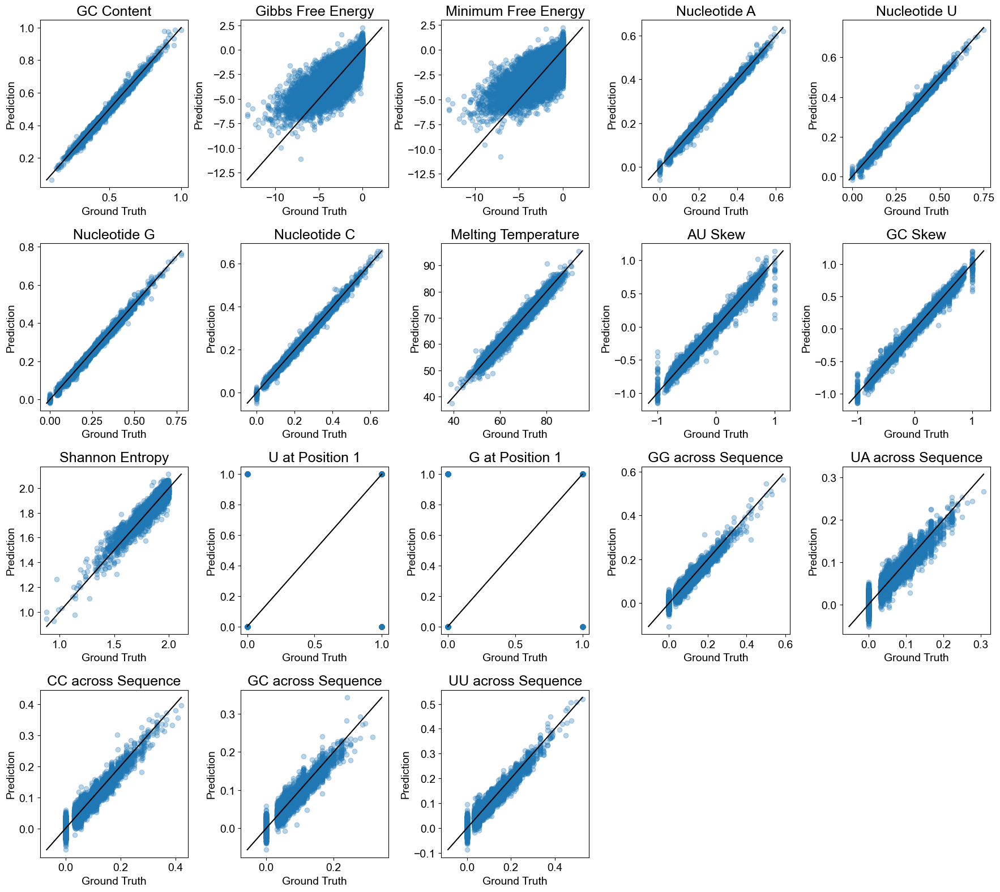

In [ ]:
# Plot final performance residuals 
final_df = pd.DataFrame(final_performance).T
final_df = final_df[['residuals', 'y_test', 'y_pred']].reset_index()
final_df['Algorithms'] = final_df['index'].apply(lambda x: x.split('_')[-1])
final_df['Algorithms'] = final_df['Algorithms'].map(rename_dict)
final_df['Interpretable Features'] = final_df['index'].apply(lambda x: rename_dict['_'.join(x.split('_')[:-1])])
final_df = final_df.set_index('index')

# Plot residuals
for ls in ['Linear']: 
    # Plot y_test vs y_pred
    fig, axs = plt.subplots(4,5, figsize=(18,16))
    for i, (ax, index) in enumerate(zip(axs.flatten(), [x for x in final_df.index if ls in x])):
        ax.scatter(final_df.at[index, 'y_test'][0], final_df.at[index, 'y_pred'][0], alpha=0.3, rasterized=True)
        ax.set_xlabel('Ground Truth')
        ax.set_ylabel('Prediction')

        min_val = min(np.concat([final_df.at[index, 'y_test'][0], final_df.at[index, 'y_pred'][0]]))
        max_val = max(np.concat([final_df.at[index, 'y_test'][0], final_df.at[index, 'y_pred'][0]]))
        ax.plot([min_val, max_val], [min_val, max_val], '-', color='black')
        ax.set_title(final_df.at[index, 'Interpretable Features'])

        ax.set_xlim(np.max(np.max([ax.get_xlim()[0], ax.get_ylim()[0]])), np.max(np.max([ax.get_xlim()[1], ax.get_ylim()[1]])))
        ax.set_ylim(np.max(np.max([ax.get_xlim()[0], ax.get_ylim()[0]])), np.max(np.max([ax.get_xlim()[1], ax.get_ylim()[1]])))
    for ax in axs.flatten()[-2:]:
        ax.set_axis_off()

    plt.tight_layout()
    # plt.savefig(f'./All_Interpretable_Prediction_Regression_{ls}_5CV_Ablation_Pred_Final_23k_Updated_fix.png')
    # plt.savefig(f'./All_Interpretable_Prediction_Regression_{ls}_5CV_Ablation_Pred_Final_23k_Updated_fix.svg')
    plt.show()

## 5.3 siRNA Efficacy Prediction

In [218]:
network_df = comb_df_23.set_index(['Base Feature'])
# the features here should be from Figure 8 
# instead of threshold, pick top 2
network_dict = {}
for y in network_df.T:
    network_dict[y] = sorted(network_df.T[y].items(), key=lambda x: x[1])[:2] + sorted(network_df.T[y].items(), key=lambda x: x[1], reverse=True)[:2]
high_corr_feat = np.array([[y[0] for y in x] for x in network_dict.values()]).flatten()
high_corr_feat = np.unique(high_corr_feat)

In [ ]:
def reverse_complement(seq):
    comp = {'A':'U', 'U':'A', 'G':'C', 'C':'G'}
    return ''.join(comp[c] for c in seq.upper()[::-1])

for group in ['Huesken' , 'Takayuki']:
    efficacy_df = pd.read_csv('siRNA_HuTuDataset.csv') # this can be obtained from https://doi.org/10.1038/nbt1118 and https://doi.org/10.1093/nar/gkl1120 
    efficacy_df = efficacy_df[efficacy_df['index'] == group].reset_index(drop=True)
    print(efficacy_df['Sequence'].apply(len).max())
    if group == 'Takayuki':
        efficacy_df['Sequence'] = efficacy_df['Sequence'].apply(lambda x: reverse_complement(x))
    elif group == 'Huesken':
        efficacy_df['Sequence'] = efficacy_df['Sequence'].apply(lambda x: x[:-2])
    print(efficacy_df['Sequence'].apply(len).max())
    print(efficacy_df['Efficacy'].min(), efficacy_df['Efficacy'].max())
    efficacy_df['Efficacy'] = (efficacy_df['Efficacy'] - efficacy_df['Efficacy'].min())/(efficacy_df['Efficacy'].max() - efficacy_df['Efficacy'].min())

    X_emb = Featurizer(list(zip(range(len(efficacy_df)), efficacy_df['Sequence'])), chunk_size=20)
    X_emb = X_emb[:, high_corr_feat] # high correlation ones 

    # Interpretable features 
    sirna = pd.read_csv('./siRNA_features_whole_unique.csv')
    sirna = sirna.set_index('sequence')
    sirna = sirna.loc[list(efficacy_df['Sequence']),:]
    interpretable_columns = ['gc_content', 'gibbs_free_energy', 'minimum_free_energy','a_content', 'u_content', 'g_content', 'c_content', 'melting_temp', 'au_skew', 'gc_skew', 'shannon_entropy', 'U_1', 'G_1','GG_all', 'UA_all', 'CC_all', 'GC_all', 'UU_all']
    X_bio = np.concat([sirna[interpretable_columns].values])

    # Load combined features 
    X_comb = np.concat([X_bio,X_emb],axis=-1)
    print(X_comb.shape)

    y = ['sirna'] * len(sirna) + ['mirna'] * len(mirna) + ['pirna'] * len(pirna)

    y = pd.Series(y).map({'sirna': 0, 'mirna': 1, 'pirna': 2})
    y = np.array(y)

    feature_sets = {
    'interpretable_features_only': X_bio,
    'combined': X_comb
    }

    ablation_study = {}

    for feature_type, X in feature_sets.items():
        print(feature_type, X.shape)
        # Load RNA-FM features
        c = 'Efficacy'
        print(X.shape)

        y = np.array(efficacy_df[c])

        for method in ['Linear']: 
            print(X.shape)
            
            X_trainval = X
            y_trainval = y

            # Cross-Validation 
            cv = KFold(n_splits=10, shuffle=True, random_state=42)

            results = {'r2_score': [], 'rmse': [], 'residuals': [], 'y_val': [], 'y_pred': []}

            splits = list(cv.split(X_trainval, y_trainval))

            for i, (train, val) in enumerate(splits):

                if method == 'Linear': 
                    model = LinearRegression()
                elif method == 'Ridge':
                    model = Ridge(alpha=1.0)

                X_train, y_train = X_trainval[train], y_trainval[train]
                X_val, y_val = X_trainval[val], y_trainval[val]

                scaler = StandardScaler()
                X_train = scaler.fit_transform(X_train)  
                X_val = scaler.transform(X_val)

                model.fit(X_train, y_train)
                y_pred = model.predict(X_val)

                results['r2_score'].append(r2_score(y_val, y_pred))
                results['rmse'].append(np.sqrt(mean_squared_error(y_val, y_pred)))
                results['y_val'].append(y_val)
                results['y_pred'].append(y_pred)
                results['residuals'].append(y_val - y_pred)

            ablation_study[f'{c}_{method}_{feature_type}'] = results
    
    ablation_performance = pd.DataFrame(ablation_study).T
    print(ablation_performance['r2_score'].apply(lambda x: np.mean(x)), ablation_performance['r2_score'].apply(lambda x: np.std(x)))

21
19
0.0 1.341


  0%|          | 0/122 [00:00<?, ?it/s]

(2431, 640)
(2431, 97)
interpretable_features_only (2431, 18)
(2431, 18)
(2431, 18)
combined (2431, 97)
(2431, 97)
(2431, 97)
Efficacy_Linear_interpretable_features_only    0.232607
Efficacy_Linear_combined                       0.283351
Name: r2_score, dtype: float64 Efficacy_Linear_interpretable_features_only    0.038087
Efficacy_Linear_combined                       0.052426
Name: r2_score, dtype: float64
19
19
0.0 0.9799


  0%|          | 0/36 [00:00<?, ?it/s]

(702, 640)
(702, 97)
interpretable_features_only (702, 18)
(702, 18)
(702, 18)
combined (702, 97)
(702, 97)
(702, 97)
Efficacy_Linear_interpretable_features_only    0.362225
Efficacy_Linear_combined                       0.381373
Name: r2_score, dtype: float64 Efficacy_Linear_interpretable_features_only    0.121581
Efficacy_Linear_combined                       0.091257
Name: r2_score, dtype: float64


# 6. RNAExplorer Utility

In [ ]:
mirna = pd.read_csv('interp_features_miRNA_whole.csv')
def reverse_complement(seq):
    assert set(seq.upper()) <= set('ACGU'), f"Unexpected characters in: {seq}"
    comp = {'A':'U', 'U':'A', 'G':'C', 'C':'G'}
    return ''.join(comp[c] for c in seq.upper()[::-1])

efficacy_df = pd.read_csv('siRNA_HuTuDataset.csv')
ls = [] 
for group in ['Huesken', 'Takayuki']:
    subset = efficacy_df[efficacy_df['index'] == group].reset_index(drop=True)
    print(subset['Sequence'].apply(len).max())
    if group == 'Takayuki':
        subset['Sequence'] = subset['Sequence'].apply(lambda x: reverse_complement(x))
    elif group == 'Huesken':
        # Remove 3' overhang 
        subset['Sequence'] = subset['Sequence'].apply(lambda x: x[:-2])
    print(subset['Sequence'].apply(len).max())
    print(subset['Efficacy'].min(), subset['Efficacy'].max())
    # subset['Efficacy'] = (subset['Efficacy'] - subset['Efficacy'].min())/(subset['Efficacy'].max() - subset['Efficacy'].min())
    ls.append(subset)
efficacy_df = pd.concat(ls)
efficacy_df['seed_region'] = efficacy_df['Sequence'].apply(lambda x: x[1:8])

21
19
0.0 1.341
19
19
0.0 0.9799


In [ ]:
# To load previously computed embeddings, these files can be found in: RNAExplorer/portal/data/embeddings/
db1 = pd.read_csv('database.part01.csv')
db2 = pd.read_csv('database.part02.csv')
db = pd.concat([db1, db2]).reset_index(drop=True)

sirna_db = db[db['RNA Type'] == 'siRNA'].reset_index()
mirna_db = db[db['RNA Type'] == 'miRNA'].reset_index()
pirna_db = db[db['RNA Type'] == 'piRNA'].reset_index()

sirna_db = sirna_db[['index', 'Sequence']].set_index('Sequence')
mirna_db = mirna_db[['index', 'Sequence']].set_index('Sequence')
pirna_db = pirna_db[['index', 'Sequence']].set_index('Sequence')

ls = []
for i in range(1,8):
    emb = np.load(f'refs_embeddings.part0{i}.npy')
    ls.append(emb)
embs = np.concat(ls)

# To use the dataset used in the paper, use these files on RNAExplorer/Notebooks/Data/ on github
# Data-Whole
sirna = pd.read_csv('interp_features_siRNA_whole.csv')
mirna = pd.read_csv('interp_features_miRNA_whole.csv')
pirna = pd.read_csv('interp_features_piRNA_whole.csv')
sirna_data = [tuple(x) for x in sirna[['sequence']].reset_index().values]
mirna_data = [tuple(x) for x in mirna[['sequence']].reset_index().values]
pirna_data = [tuple(x) for x in pirna[['sequence']].reset_index().values]

# To load previously computed embeddings
sirna_emb = embs[list(sirna_db.loc[[x[-1] for x in sirna_data], :]['index']), :]
mirna_emb = embs[list(mirna_db.loc[[x[-1] for x in mirna_data], :]['index']), :]
pirna_emb = embs[list(pirna_db.loc[[x[-1] for x in pirna_data], :]['index']), :]

df_ = []
for d, label in zip([sirna, mirna, pirna], ['siRNA', 'miRNA', 'piRNA']):
    d['RNA type'] = label
    df_.append(d[['sequence', 'RNA type']])
df_ = pd.concat(df_).reset_index(drop=True)
embs = np.concat([sirna_emb, mirna_emb, pirna_emb])
assert len(df_) == embs.shape[0]

fresh = np.asarray(Featurizer([("q", df_.iloc[0]['sequence'])], chunk_size=1)[0])
(fresh== embs[0]).all() # to confirm again 

  0%|          | 0/1 [00:00<?, ?it/s]

(1, 640)


np.True_

In [280]:
# Most Similar k miRNA seq 
# see views.py from RNAExplorer
results_ = {}
ref_df = mirna
ref_emb = mirna_emb
sigma=1.0
for k in [20, 50, 100]: 
    query_matches = []
    for query_seq in efficacy_df['Sequence']:
        query_emb = embs[df_[df_['sequence'] == query_seq].index.values[0],:]
        dists = np.linalg.norm(ref_emb - query_emb, axis=1)

        order = np.argsort(dists)
        count = 0 
        for i, idx in enumerate(order):
            ref_seq = mirna.iloc[idx, 0]
            d = float(dists[idx])
            similarity = round(float(np.exp(-d/sigma)), 3)

            row = mirna.iloc[idx].to_dict()
            row['query_sequence'] = query_seq
            row['distance'] = d
            row['similarity'] = similarity
            query_matches.append(row)
            
            count +=1 
            if count >= k:
                break
    results_[k] = pd.DataFrame(query_matches)

0.0 1.0
5.081049471665838e-13
7.514439349333738e-10
3.909350087700445e-05
0.0 1.0
3.621152654418957e-14
3.212500461101314e-10
4.662582044559309e-06
0.0 1.0
2.59929857795338e-15
1.431529258595792e-10
4.769881885731423e-07


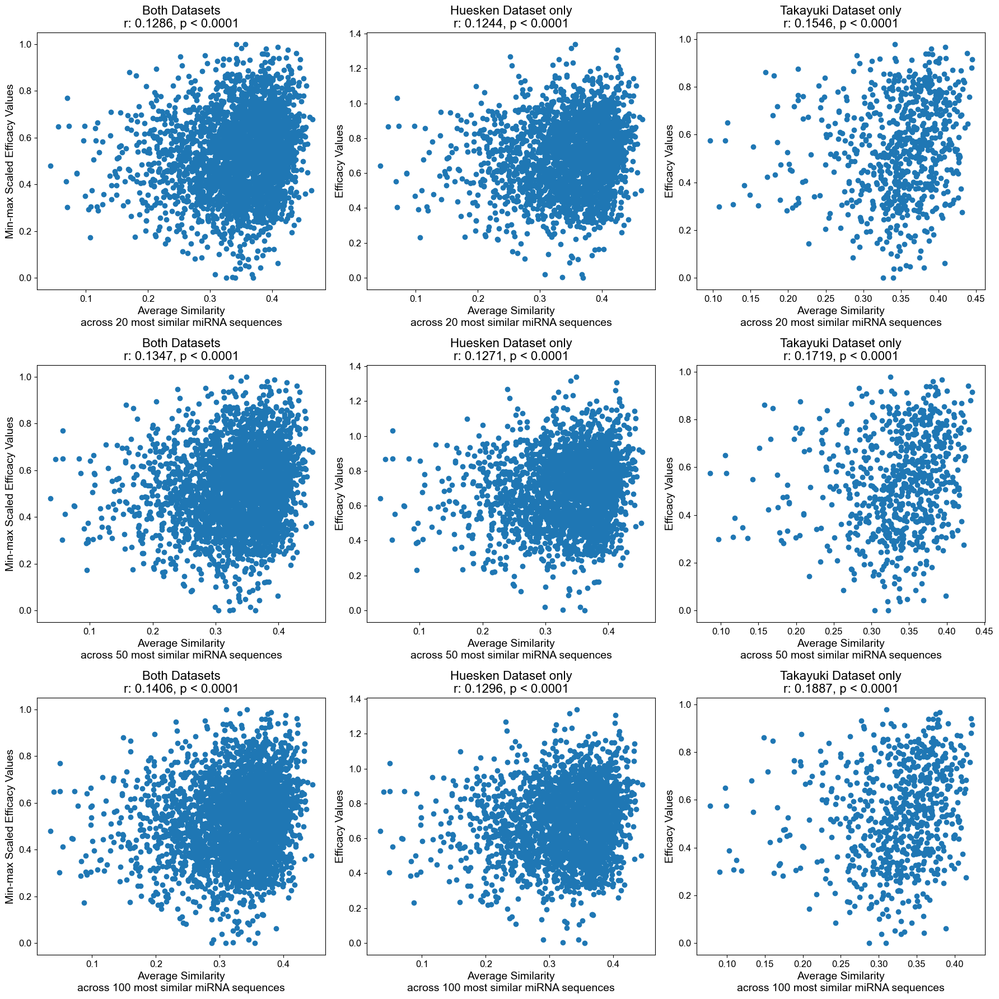

In [ ]:
col = 'similarity'
fig, axs, = plt.subplots(3,3, figsize=(18, 18))
plt.rcParams.update({
    "svg.fonttype": "none",
    "font.size": 12,
    "axes.titlesize": 16,
    "axes.labelsize": 14, 
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 14,
    "legend.title_fontsize": 12
})

for i in range(0, 3):
    k = list(results_.keys())[i]

    # results = results_[k].copy()
    results = pd.read_csv(f'./final_results/sirna_efficacy_matching_{k}_mirna.csv', index_col=0)
    efficacy_dist = results.merge(efficacy_df[['index', 'Sequence', 'Efficacy']], left_on=['query_sequence'], right_on='Sequence').copy()
    avg_dist = efficacy_dist[['index', 'Sequence', col, 'Efficacy']].groupby(['Sequence','index', 'Efficacy'], as_index=False).mean()

    for ax, label in zip(axs[i, :], ['Both Datasets', 'Huesken', 'Takayuki']):
        subset = avg_dist.copy()
        if label != 'Both Datasets':
            subset = subset[subset['index'] == label]
        else:
            subset.loc[subset['index'] == 'Huesken', 'Efficacy']  = (subset.loc[subset['index'] == 'Huesken', 'Efficacy'] - subset.loc[subset['index'] == 'Huesken', 'Efficacy'].min())/((subset.loc[subset['index'] == 'Huesken', 'Efficacy']).max() - (subset.loc[subset['index'] == 'Huesken', 'Efficacy']).min())
            subset.loc[subset['index'] == 'Takayuki', 'Efficacy']  = (subset.loc[subset['index'] == 'Takayuki', 'Efficacy'] - subset.loc[subset['index'] == 'Takayuki', 'Efficacy'].min())/((subset.loc[subset['index'] == 'Takayuki', 'Efficacy']).max() - (subset.loc[subset['index'] == 'Takayuki', 'Efficacy']).min())
            print(subset['Efficacy'].min(), subset['Efficacy'].max())
        result = pearsonr(subset[col], subset['Efficacy'])
        ax.scatter(subset[col], subset['Efficacy'])
        print(result.pvalue)
        p_text = 'p < 0.0001' if result.pvalue < 0.0001 else result.pvalue
        ax.set_title(f'{label}{' Dataset only' if label != 'Both Datasets' else ''}\nr: {result.statistic:.4f}, {p_text}')
        ax.set_xlabel(f'Average Similarity\nacross {k} most similar miRNA sequences')
        if label == 'Both Datasets':
            ax.set_ylabel('Min-max Scaled Efficacy Values')
        else:
            ax.set_ylabel('Efficacy Values')
    plt.tight_layout()
# plt.savefig('./final_results/supplementary_fig_s14_mean.png')
# plt.savefig('./final_results/supplementary_fig_s14_mean.svg')

## 6.1 SNCA Case Study

In [311]:
query_ = ['UGUCACUUGCUCUUUGGUC', 'ACACCCGUCACCACUGCUC', 'UUAGGCUUCAGGUUCGUAG', 'UUCUCAGCCACUGUUGCCA']

In [ ]:
ls = []
for i in range(1,5):
    d = pd.read_csv(f'nearest_sequences ({i}).csv') # Obtain this from RNAExplorer
    d['query_sequence'] = query_[i-1] 
    d = d.loc[1:20, :] # normally first line would be the query_sequence itself
    ls.append(d)
top_20 = pd.concat(ls).reset_index(drop=True)

In [ ]:
ls = []
ls2 = []
for i in range(0, 4):
    if i > 0:
        suf = f' ({i})'
    else:
        suf = ''
    d = pd.read_csv(f'matching_sequences{suf}.csv')
    d['query_sequence'] = query_[i]
    d['human_mirna'] = 0 
    d.loc[(d['Type'] == 'miRNA') & (d['Species'].str.contains('Homo sapiens')), 'human_mirna'] = 1
    ls.append(d)

    seed_ = query_[i][1:8]
    ls2.append(d[d['Sequence'].apply(lambda x: x[1:8]) == seed_])
fragment_containing_seed = pd.concat(ls)
fragment_containing_seed = fragment_containing_seed[fragment_containing_seed['Sequence'] != fragment_containing_seed['query_sequence']].reset_index(drop=True)
same_seed = pd.concat(ls2)
same_seed = same_seed[same_seed['Sequence'] != same_seed['query_sequence']].reset_index(drop=True)

In [454]:
# Human miRNA 
seed_frag = fragment_containing_seed.groupby(['query_sequence'])['human_mirna'].value_counts().reset_index()
seed_frag = seed_frag[seed_frag['human_mirna'] == 1]
seed_frag = seed_frag.rename(columns={'count': 'human_mirna_count'})
seed_frag = seed_frag[['query_sequence', 'human_mirna_count']]

seed_frag_general = fragment_containing_seed.groupby(['query_sequence'])['Type'].value_counts().reset_index()
seed_frag_general= seed_frag_general.pivot(index='query_sequence', columns='Type')
seed_frag_general.columns = seed_frag_general.columns.get_level_values(1)
seed_frag_general = seed_frag_general.reset_index().merge(seed_frag, how='left').fillna(0)

In [455]:
same_seed_frag = same_seed.groupby(['query_sequence'])['human_mirna'].value_counts().reset_index()
same_seed_frag = same_seed_frag[same_seed_frag['human_mirna'] == 1]
same_seed_frag = same_seed_frag.rename(columns={'count': 'human_mirna_count'})
same_seed_frag = same_seed_frag[['query_sequence', 'human_mirna_count']]

same_seed_frag_general = same_seed.groupby(['query_sequence'])['Type'].value_counts().reset_index()
same_seed_frag_general= same_seed_frag_general.pivot(index='query_sequence', columns='Type')
same_seed_frag_general.columns = same_seed_frag_general.columns.get_level_values(1)
same_seed_frag_general = same_seed_frag_general.reset_index().merge(same_seed_frag, how='left').fillna(0)

In [456]:
# Most Similar k miRNA seq 
# see views.py from RNAExplorer
results_ = {}
ref_df = mirna
ref_emb = mirna_emb
sigma=1.0
for k in [20, 50, 100]: 
    query_matches = []
    for query_seq in query_:
        query_emb = embs[df_[df_['sequence'] == query_seq].index.values[0],:]
        dists = np.linalg.norm(ref_emb - query_emb, axis=1)

        order = np.argsort(dists)
        count = 0 
        for i, idx in enumerate(order):
            ref_seq = mirna.iloc[idx, 0]
            d = float(dists[idx])
            similarity = round(float(np.exp(-d/sigma)), 3)

            row = mirna.iloc[idx].to_dict()
            row['query_sequence'] = query_seq
            row['distance'] = d
            row['similarity'] = similarity
            query_matches.append(row)
            
            count +=1 
            if count >= k:
                break
    results_[k] = pd.DataFrame(query_matches)
for k in results_:
    results_[k]['k'] = k
df = pd.concat(results_.values())

/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2815588305.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,0].set_xticklabels([f'Sequence {map_dict[x.get_text()]}' for x in axs[0,0].get_xticklabels()])
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2815588305.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0,1].set_xticklabels([f'Sequence {map_dict[x.get_text()]}' for x in axs[0,1].get_xticklabels()])
/var/folders/gh/j4727vd54z3bxljkhjg_vqd40000gn/T/ipykernel_84767/2815588305.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1,0].set_xticklabels([f'Sequence {map_dict[x.get_text()]}\n{x.get_text()[1:8]}' for x in axs[1,0].get_xticklabels()])
/var/folders/gh/j4727vd54z3bxljkhjg_v

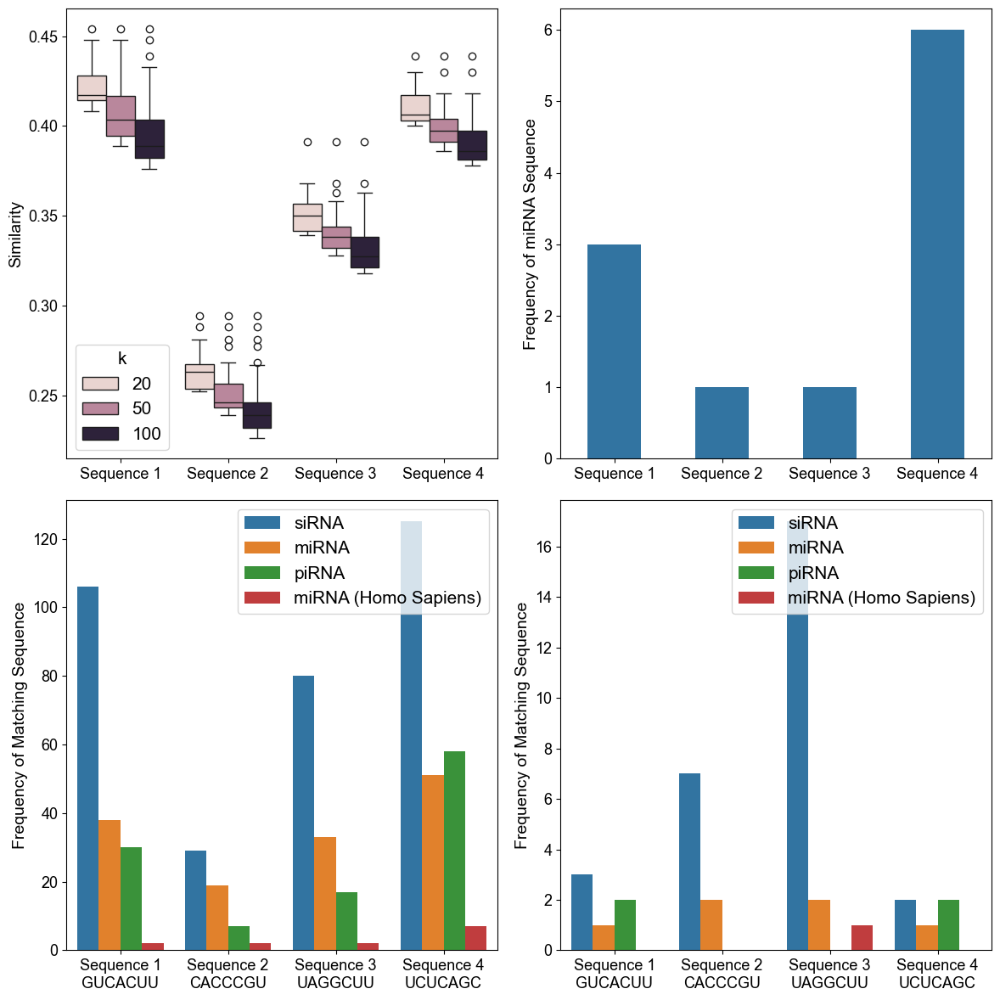

In [ ]:
mirna_val_count = top_20[['query_sequence', 'Type']].groupby(['query_sequence'], as_index=False).value_counts()
mirna_val_count = mirna_val_count[mirna_val_count['Type'] == 'miRNA']
mirna_val_count = mirna_val_count.set_index('query_sequence')
mirna_val_count = mirna_val_count.loc[query_,:].reset_index()
map_dict = dict(zip(query_, range(1, 5),))
seed_frag_count = seed_frag_general.set_index('query_sequence').loc[query_,:].reset_index()
seed_frag_count = seed_frag_count.melt(id_vars='query_sequence', var_name='RNA type', value_name='count')
same_seed_count = same_seed_frag_general.set_index('query_sequence').loc[query_,:].reset_index()
same_seed_count = same_seed_count.melt(id_vars='query_sequence', var_name='RNA type', value_name='count')
seed_frag_count['RNA type'] = seed_frag_count['RNA type'].replace('human_mirna_count', 'miRNA (Homo Sapiens)')
same_seed_count['RNA type'] = same_seed_count['RNA type'].replace('human_mirna_count', 'miRNA (Homo Sapiens)')

plt.rcParams.update({
    "svg.fonttype": "none",
    "font.family":"Arial",
    "font.size": 14,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "xtick.labelsize": 13,
    "ytick.labelsize": 13,
    "legend.fontsize": 15,
    "legend.title_fontsize": 15
})
fig, axs = plt.subplots(2,2,figsize=(12,12))#figsize=(8, 12))

# Boxplot of the distance
ls = []
map_dict = dict(zip(query_, range(1,5)))
# for k in [20, 50, 100]: 
#     df = pd.read_csv(f'./snca_case_study_top_{k}_mirna_reverse.csv', index_col=0)
#     df['k'] = k
#     ls.append(df)
# df = pd.concat(ls).reset_index(drop=True)

sns.boxplot(df, x='query_sequence', y='similarity',hue='k',ax=axs[0,0])
axs[0,0].set_xticklabels([f'Sequence {map_dict[x.get_text()]}' for x in axs[0,0].get_xticklabels()])
axs[0,0].set_xlabel('')
axs[0,0].set_ylabel('Similarity')

sns.barplot(mirna_val_count, y='count',x='query_sequence',ax=axs[0,1], width=0.5)
axs[0,1].set_xlabel('')
axs[0,1].set_xticklabels([f'Sequence {map_dict[x.get_text()]}' for x in axs[0,1].get_xticklabels()])
axs[0,1].set_ylabel('Frequency of miRNA Sequence')

sns.barplot(seed_frag_count, y='count', x='query_sequence', hue='RNA type', ax=axs[1,0], hue_order=['siRNA','miRNA', 'piRNA', 'miRNA (Homo Sapiens)'])
axs[1,0].set_xlabel('')
axs[1,0].set_ylabel('Frequency of Matching Sequence')

axs[1,0].set_xticklabels([f'Sequence {map_dict[x.get_text()]}\n{x.get_text()[1:8]}' for x in axs[1,0].get_xticklabels()])
axs[1,0].legend(title='')

sns.barplot(same_seed_count, y='count', x='query_sequence', hue='RNA type', ax=axs[1,1], hue_order=['siRNA','miRNA', 'piRNA', 'miRNA (Homo Sapiens)'])
axs[1,1].set_xlabel('')
axs[1,1].set_ylabel('Frequency of Matching Sequence')

axs[1,1].set_xticklabels([f'Sequence {map_dict[x.get_text()]}\n{x.get_text()[1:8]}' for x in axs[1,1].get_xticklabels()])
axs[1,1].legend(title='')

plt.tight_layout()